# Primer Trabajo: Machine Learning para Macroeconomía y Finanzas

## Marcelo Gallardo 
## Profesor: Josué Cox
## Asistente de docencia: Luis Surco

In [302]:
# Instalaciones (librerías y otros)

#!pip install pandas-datareader
#import sys
#library pdarima designed to fill the void in Python's time series analysis capabilities
#!{sys.executable} -m pip install pmdarima
#!conda config --add channels conda-forge
#!conda config --set channel_priority strict
#!conda install pmdarima


In [415]:
# Librerías
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
from datetime import datetime, timedelta

from dateutil.relativedelta import relativedelta

# lib pandas, para plotear y descomposición
import numpy 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import requests
from scipy import stats
from pandas_datareader import data
from numpy import log  
import math
import statsmodels.api as sm
import pmdarima as pmd
import pylab as pl
from dateutil.parser import parse

# eventualmente 
from statsmodels.tsa.api import VAR

#full arima y STL

from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose

import pmdarima as pm
from pmdarima import model_selection

#ETS

from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
from collections import defaultdict

import statsmodels.tsa.holtwinters     as      ets
from   statsmodels.tsa.holtwinters import  Holt
import statsmodels.tools.eval_measures as      fa
from   sklearn.metrics                 import  mean_squared_error
from   statsmodels.tsa.holtwinters     import  SimpleExpSmoothing

# outliers

import plotly.express as pxs


#csv

import csv
from scipy import interpolate

# Pregunta 1

Usando la API del Banco Central de Reserva del Perú, construya una base de datos (Pandas) con las siguientes variables para cada frecuencia de datos. Genere gráficos para cada una de ellas con la descomposición STL (Tip: pueden usar un for loop para generar los gráficos). Discuta si los datos presentan quiebres estructurales o outliers (observaciones extremas) explicando cómo identificó dichos quiebres y/o outliers. 

Observación:  "la Base de Datos de Estadísticas del BCRP (BCRPData) proporciona interfaces API para consultar series estadísticas desde otras aplicaciones Web".


Comentarios preliminares: las series de tiempo $\{x_t\}$ que se van a analizar son extraidas del BCRP usando el código provisto por el profesor Josué Cox en el ipynb "modulo 1". La lógica en todo momento es la siguiente:

1. Se extraen los datos y se generan una base de datos Panda. 
2. Se grafican las series de tiempo resolviendo el problema de la n.a. usando el comando .fillna(method='bfill'). Esto asegura la continuidad de $\{x_t\}$.
3. Se efectúa la descomposición STL (nuevamente se hace uso del código provisto). 
4. Dado que las variables, sobre todo las diarias, poseen missing values (los fines de semana algunas series no poseen registro), se corrige empleando: https://stackoverflow.com/questions/71982711/valueerror-this-function-does-not-handle-missing-values

Se ha tratado de homogeneizar y tomar un intervalo lo suficientemente grande para el periodo que denotamos $[t_0, T]$. 

# Una nota sobre los n.a.

Dado que las series de tiempo presentan missing values (sobre todo diarias por los fines de semana), se va a completar la data usando: bfill o en su defecto (cuando el último valor es n.a), se usa ffill. La técnica interpolate se usará cuando se tenga una única serie (y no todas agrupadas en el dataframe). Las gráficas parecen no estar bien discretizadas para el caso diario pero, si se descarga el csv, puede apreciarse que se ha completado exitosamente con el bfill. 

https://www.geeksforgeeks.org/working-with-missing-data-in-pandas/

https://stackoverflow.com/questions/71982711/valueerror-this-function-does-not-handle-missing-values
    

## Series de tiempo $\{x_{it}\}_{t=t_0}^{T}$ $i=1, ..., k=20$ cuya frecuencia es diaria

Vamos a considerar un periodo lo suficientemente amplio, sin considerar $t_0 = \max\{t_{min}^{i}\}_{i=1}^{20}$ y $T = \min\{t_{\max}^{i}\}_{i=1}^{20}$ donde $\{x_{it}\}$ posee datos sobre $[t_{\min}^{i}, t_{\max}^{i}]$. 


De este modo, trabajamos del 01/01/2000 al 01/12/2022. 

Observación: se hace caso omiso de momento a la existencia de missing values i.e., n.a. 



In [520]:
#DIARIAS
# Tasa interbancaria, Rendimiento del Bono del gobierno peruano a 10 years (en S/), TC Interbancario (S/ por US$) compra, venta
# euro compra, venta, indice General Bursátil BVL, indice Selectivo Bursátil BVL, Monto negociado en acciones (millones S/)
#  cobre, plata, zinc, oro, petroelo, Bonos del Tesoro EE.UU 5, 10 y 30 ,  Spread - EMBIG Peru, AL,  Dow Jones

url_base  = 'https://estadisticas.bcrp.gob.pe/estadisticas/series/api/'
cod_var   = ['PD04692MD', 'PD31893DD', 'PD04637PD', 'PD04638PD', 'PD04647PD', 'PD04648PD', 'PD38026MD', 'PD38027MD', 
             'PD04696MD', 'PD04701XD', 'PD04702XD', 'PD04703XD', 'PD04704XD', 'PD04705XD', 'PD04718XD', 'PD04719XD', 
             'PD04720XD', 'PD04709XD', 'PD04708XD', 'PD04721XD'] 
form_out  = '/json'
period    = '/2000-1-1/2022-12-1'


month_s = ['Ene','Feb','Mar','Abr','May','Jun','Jul','Ago','Set','Oct','Nov','Dic']
month_d = ['01','02','03','04','05','06','07','08','09','10','11','12']

#crear la mega tabla
df1 = pd.DataFrame()

#Transformando los datos a formato de base de datos Pandas. 

# En caso se quiera las graficas en formato suavizado.
for j in cod_var:
    url_aux   = url_base + j + form_out + period
    resp      = requests.get(url_aux)
    resp_json = resp.json()
    periods   = resp_json['periods']
    
    value = []
    dates = []
    
    for i in periods:
        aux_dat = i['name']
        aux_val = i['values']
        dates.append(aux_dat)
        value.append(float(aux_val[0]))
    
    dict_aux = {'Fecha' : dates, 
                 resp_json['config']['series'][0]['name'] : value}
    df_aux = pd.DataFrame(dict_aux)
    df_aux.set_index(df_aux['Fecha'], inplace=True)
    df_aux = df_aux.drop(columns=['Fecha'])
    df1    = pd.concat([df1, df_aux], axis=1)

# En caso se quiera las graficas en formato 20XX-0Y-ZW o correr el código    
"""

for j in cod_var:
    url_aux   = url_base + j + form_out + period
    resp      = requests.get(url_aux)
    resp_json = resp.json()
    periods   = resp_json['periods']
    
    value = []
    dates = []
    
    for i in periods:
        aux_dat = i['name']
        aux_val = i['values']
        dates.append(aux_dat)
        value.append(float(aux_val[0]))
    
    dict_aux = {'Fecha' : dates, 
                 resp_json['config']['series'][0]['name'] : value}
    df_aux = pd.DataFrame(dict_aux)


    for (s,d) in zip(month_s,month_d):
        df_aux['Fecha'] = df_aux['Fecha'].str.replace(s,d)
    df_aux['Fecha'] = pd.to_datetime(df_aux['Fecha'])
    
    df_aux.set_index(df_aux['Fecha'], inplace=True)
    df_aux = df_aux.drop(columns=['Fecha'])
    df1    = pd.concat([df1, df_aux], axis=1)
"""

#df1.to_excel('marcelo.xlsx')
#df1.to_csv('FrecuenciaDiaria.csv')

display(df1)


,"Tasas de interés - Interbancaria, S/",Tasas de interés - Rendimiento del Bono del gobierno peruano a 10 años (en S/),Tipo de cambio - TC Interbancario (S/ por US$) - Compra,Tipo de cambio - TC Interbancario (S/ por US$) - Venta,Tipo de cambio - TC Euro (S/ por Euro) - Compra,Tipo de cambio - TC Euro (S/ por Euro) - Venta,Indicadores bursátiles - Índice General Bursátil BVL (índice),Indicadores bursátiles - Índice Selectivo Bursátil BVL (índice),Indicadores bursátiles - Monto negociado en acciones (millones S/) - Promedio diario,"Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)","Cotizaciones internacionales - Plata (H.Harman, US$ por onzas troy)","Cotizaciones internacionales - Zinc (Londres, cUS$ por libras)","Cotizaciones internacionales - Oro (Londres, US$ por onzas troy)","Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)",Tasas de interés internacionales - Bonos del Tesoro EE.UU. - 5 años (%),Tasas de interés internacionales - Bonos del Tesoro EE.UU. - 10 años (%),Tasas de interés internacionales - Bonos del Tesoro EE.UU. - 30 años (%),Tasas de interés: EMBIG (variación en pbs) - Spread - EMBIG Perú (pbs),Tasas de interés: EMBIG (variación en pbs) - Spread - EMBIG America Latina (pbs),Bolsas (índices) - Dow Jones (var%)
Fecha,,,,,,,,,,,,,,,,,,,,
03.Ene.00,17.023013,NaN,3.5165,3.5192,NaN,NaN,NaN,NaN,12.110376,NaN,NaN,NaN,NaN,NaN,NaN,6.592,6.622,425.0,586.0,-1.210000
04.Ene.00,19.538619,NaN,3.5243,3.5263,NaN,NaN,NaN,NaN,13.704803,83.143481,5.300,55.020754,282.00,25.55,NaN,6.497,6.537,442.0,623.0,-3.170000
05.Ene.00,20.191614,NaN,3.5174,3.5198,NaN,NaN,NaN,NaN,21.062432,82.463093,5.190,54.476444,280.80,24.91,NaN,6.594,6.621,429.0,618.0,1.130000
06.Ene.00,16.624679,NaN,3.5051,3.5072,NaN,NaN,NaN,NaN,15.354102,83.052763,5.170,54.295007,280.70,24.78,NaN,6.524,6.553,449.0,634.0,1.170000
07.Ene.00,15.474790,NaN,3.5111,3.5130,NaN,NaN,NaN,NaN,35.454522,83.075443,5.190,54.431084,282.30,24.22,NaN,6.515,6.546,440.0,630.0,2.390000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29.Jun.22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,383.104119,20.775,154.674998,1817.75,111.65,3.1395,3.087,3.215,238.0,530.0,0.258952
28.Jul.22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,349.810439,19.805,147.236083,1753.50,99.11,2.6979,2.671,3.017,226.0,510.0,1.027643
29.Jul.22,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,353.824732,20.262,151.998803,1753.40,101.31,2.6811,2.658,3.012,219.0,500.0,0.982542


Las series de tiempo presentan missing values (n.d. en la página del BCRP). Por ende, empleamos los siguientes métodos.

In [521]:
# numero de missings
df1.isnull().sum()
#numero total
#df1.isnull().sum().sum()

Tasas de interés - Interbancaria, S/                                                     299
Tasas de interés - Rendimiento del Bono del gobierno peruano a 10 años (en S/)          1738
Tipo de cambio - TC Interbancario (S/ por US$) - Compra                                  381
Tipo de cambio - TC Interbancario (S/ por US$) - Venta                                   381
Tipo de cambio - TC Euro (S/ por Euro) - Compra                                          897
Tipo de cambio - TC Euro (S/ por Euro) - Venta                                           895
Indicadores bursátiles - Índice General Bursátil BVL (índice)                           1701
Indicadores bursátiles - Índice Selectivo Bursátil BVL (índice)                         1701
Indicadores bursátiles - Monto negociado en acciones (millones S/) - Promedio diario     211
Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)                          205
Cotizaciones internacionales - Plata (H.Harman, US$ por onzas troy)   

In [524]:
# back y forward
data_diaria_draft=df1.fillna(method='bfill')
data_diaria=data_diaria_draft.fillna(method='ffill')
display(data_diaria)

# Si queremos usar
#https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.interpolate.html
# hay que transformar el pandas en csv, importar y dejarlo en formato series, esto se usa en la última pregunta

,"Tasas de interés - Interbancaria, S/",Tasas de interés - Rendimiento del Bono del gobierno peruano a 10 años (en S/),Tipo de cambio - TC Interbancario (S/ por US$) - Compra,Tipo de cambio - TC Interbancario (S/ por US$) - Venta,Tipo de cambio - TC Euro (S/ por Euro) - Compra,Tipo de cambio - TC Euro (S/ por Euro) - Venta,Indicadores bursátiles - Índice General Bursátil BVL (índice),Indicadores bursátiles - Índice Selectivo Bursátil BVL (índice),Indicadores bursátiles - Monto negociado en acciones (millones S/) - Promedio diario,"Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)","Cotizaciones internacionales - Plata (H.Harman, US$ por onzas troy)","Cotizaciones internacionales - Zinc (Londres, cUS$ por libras)","Cotizaciones internacionales - Oro (Londres, US$ por onzas troy)","Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)",Tasas de interés internacionales - Bonos del Tesoro EE.UU. - 5 años (%),Tasas de interés internacionales - Bonos del Tesoro EE.UU. - 10 años (%),Tasas de interés internacionales - Bonos del Tesoro EE.UU. - 30 años (%),Tasas de interés: EMBIG (variación en pbs) - Spread - EMBIG Perú (pbs),Tasas de interés: EMBIG (variación en pbs) - Spread - EMBIG America Latina (pbs),Bolsas (índices) - Dow Jones (var%)
Fecha,,,,,,,,,,,,,,,,,,,,
03.Ene.00,17.023013,9.35,3.5165,3.519200,2.989,3.017,4802.25,7681.11,12.110376,83.143481,5.300,55.020754,282.00,25.55,5.4450,6.592,6.622,425.0,586.0,-1.210000
04.Ene.00,19.538619,9.35,3.5243,3.526300,2.989,3.017,4802.25,7681.11,13.704803,83.143481,5.300,55.020754,282.00,25.55,5.4450,6.497,6.537,442.0,623.0,-3.170000
05.Ene.00,20.191614,9.35,3.5174,3.519800,2.989,3.017,4802.25,7681.11,21.062432,82.463093,5.190,54.476444,280.80,24.91,5.4450,6.594,6.621,429.0,618.0,1.130000
06.Ene.00,16.624679,9.35,3.5051,3.507200,2.989,3.017,4802.25,7681.11,15.354102,83.052763,5.170,54.295007,280.70,24.78,5.4450,6.524,6.553,449.0,634.0,1.170000
07.Ene.00,15.474790,9.35,3.5111,3.513000,2.989,3.017,4802.25,7681.11,35.454522,83.075443,5.190,54.431084,282.30,24.22,5.4450,6.515,6.546,440.0,630.0,2.390000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
29.Jun.22,7.250000,5.35,3.9050,3.912667,4.173,4.217,17700.78,21830.80,0.000000,383.104119,20.775,154.674998,1817.75,111.65,3.1395,3.087,3.215,238.0,530.0,0.258952
28.Jul.22,7.250000,5.35,3.9050,3.912667,4.173,4.217,17700.78,21830.80,0.000000,349.810439,19.805,147.236083,1753.50,99.11,2.6979,2.671,3.017,226.0,510.0,1.027643
29.Jul.22,7.250000,5.35,3.9050,3.912667,4.173,4.217,17700.78,21830.80,0.000000,353.824732,20.262,151.998803,1753.40,101.31,2.6811,2.658,3.012,219.0,500.0,0.982542


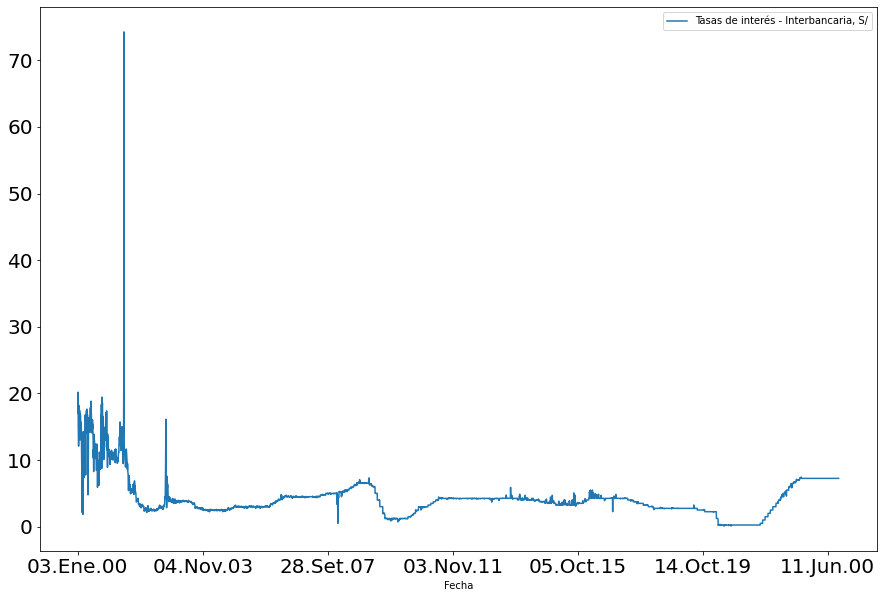

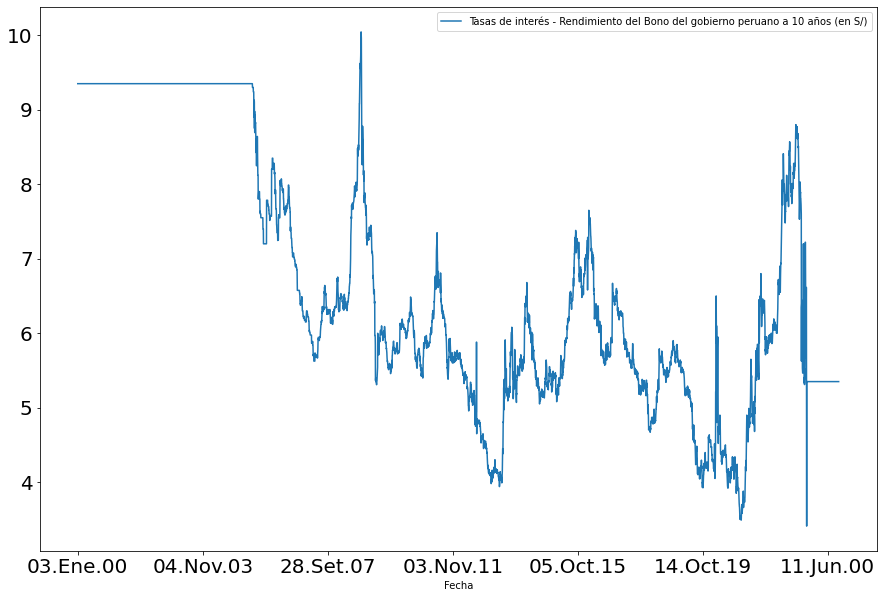

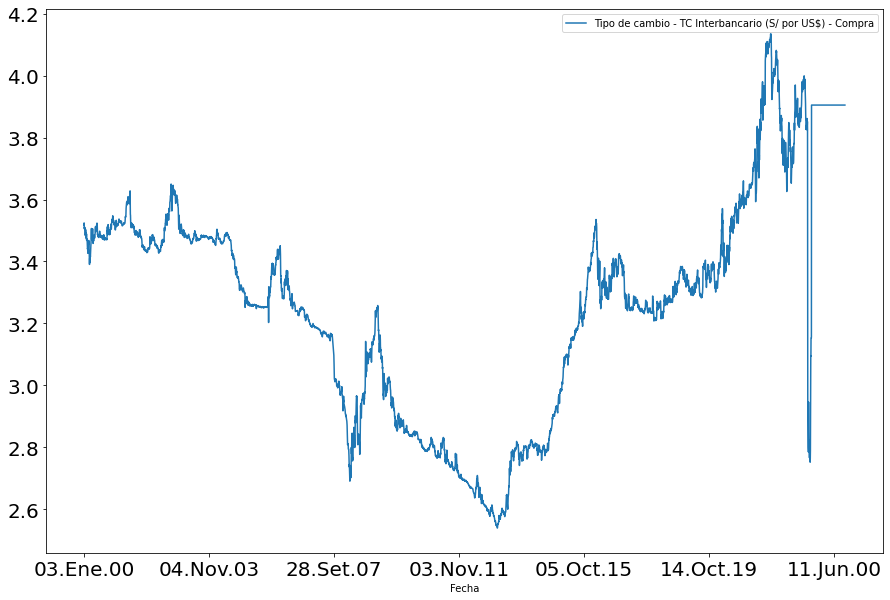

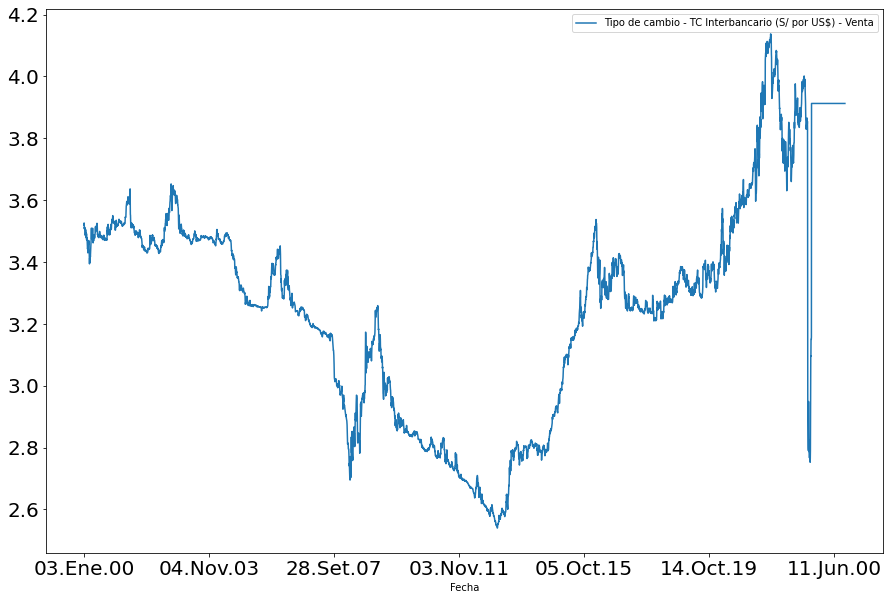

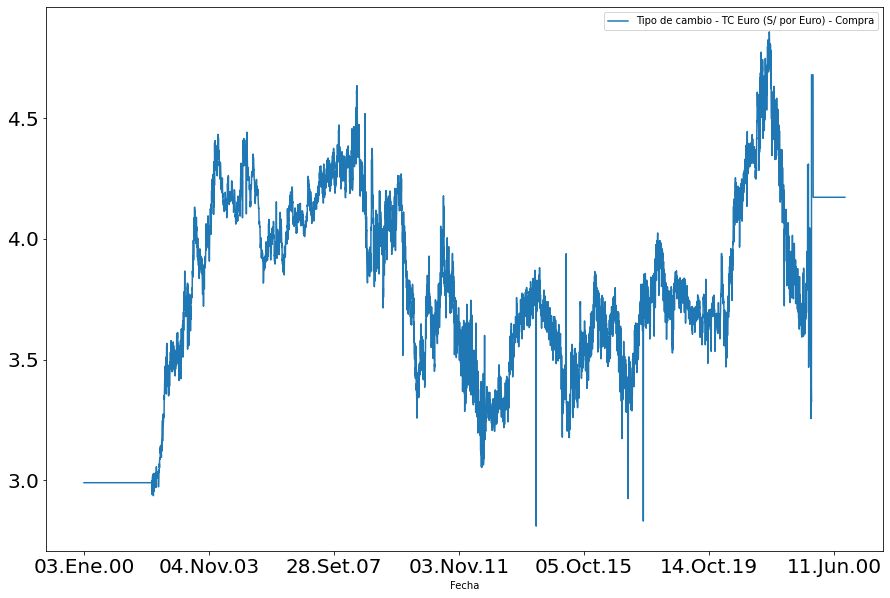

...

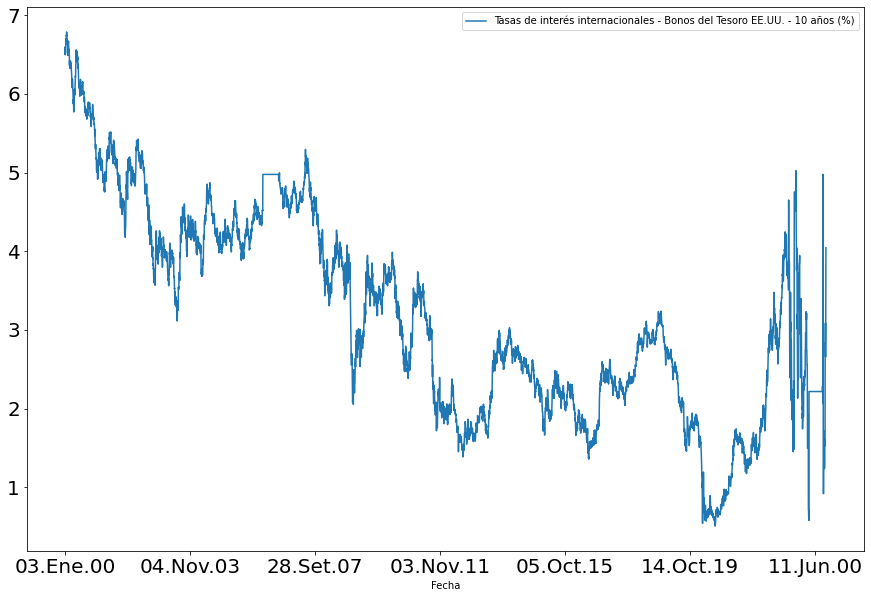

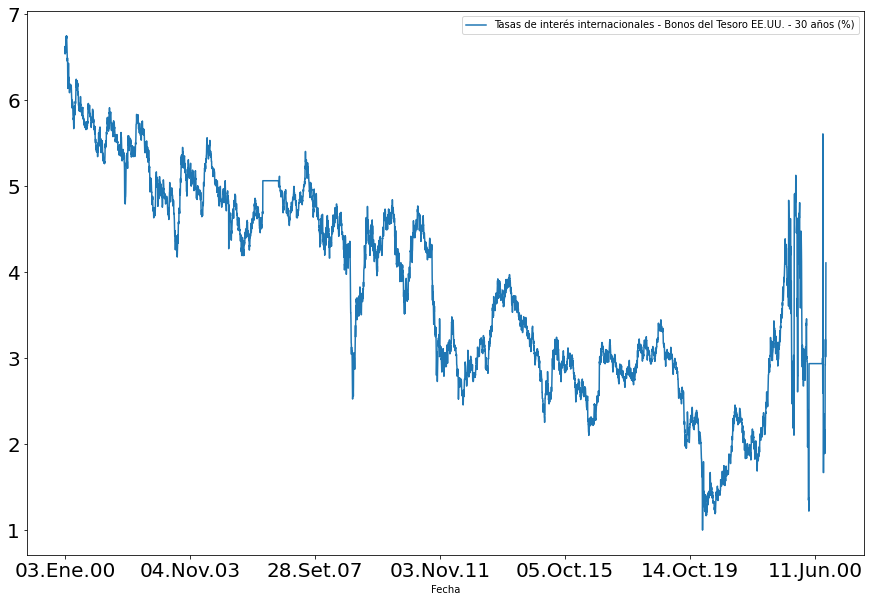

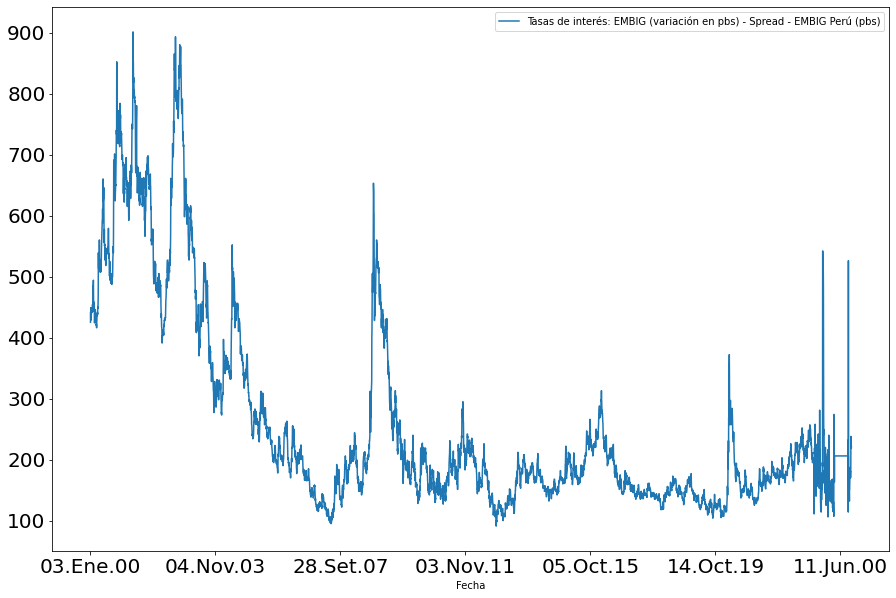

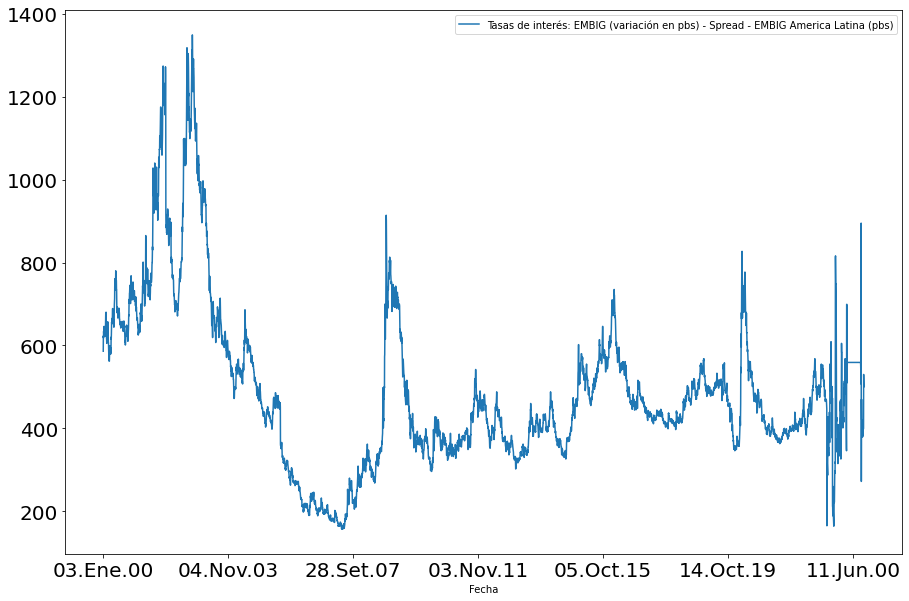

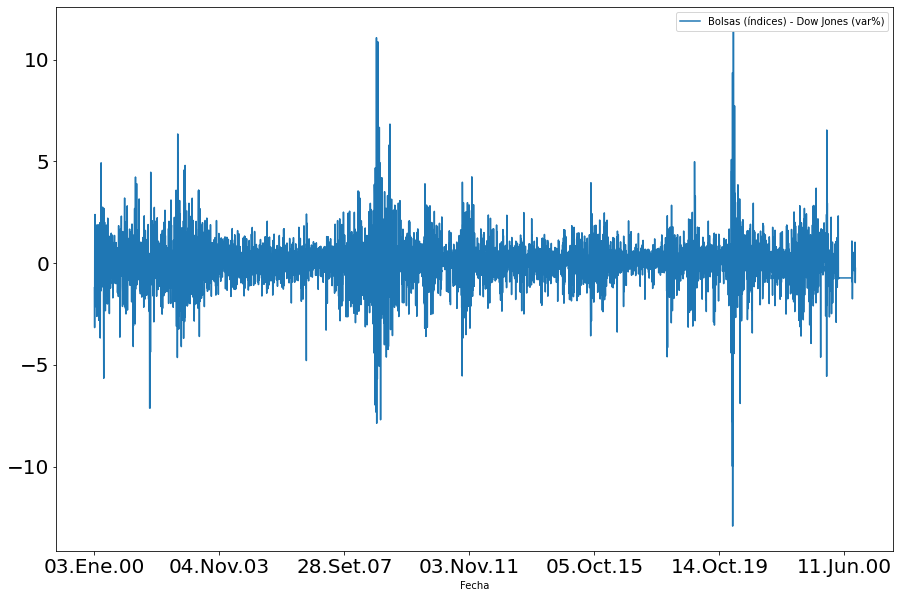

In [525]:
for i in range(20):
    df_timeserie2 =data_diaria.iloc[:,[i]]
    fig = df_timeserie2.plot(figsize=(15, 10), fontsize=20, legend=dict_aux).get_figure()

    

Recordemos que las series de tiempo pueden descomponerse en el componente estacional $(S_t)$, el componente tendencia-ciclo ($T_t$) y el componente restante $(R_t)$.

$\textbf{La tendencia}$ es el componente que muestra incrementos o caídas en el largo plazo en la variable.

$\textbf{El ciclo}$ es el componente que muestra incrementos o caídas que no son regulares en la variable.

$\textbf{La estacionalidad}$ es finalmente el componente que afecta la variable con regularidad.


Así,   

$$y_t = f(S_t, T_t, R_t).$$


Si asumimos que $f$ es lineal, o sea, que la dscomposición es aditiva (tal y como se efectuará a continuación)

 $$y_t=S_t+T_t+R_t(+\varepsilon_t).$$
 
 
 Gracias al comando seasonal_decompose, se puede obtener para cada serie $\{y_t\}$, la descomposición, obteniendo para cada una 4 gráficos: nivel, tendencia, estacionalidad y el error.

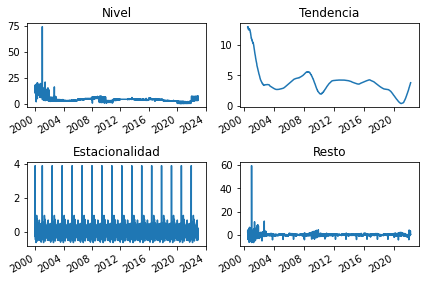

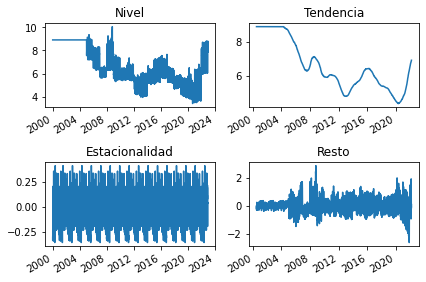

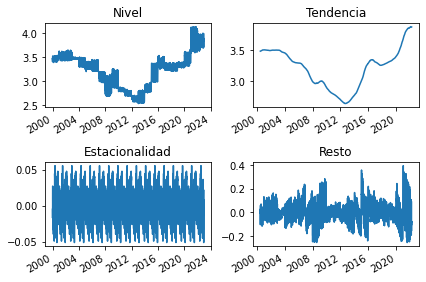

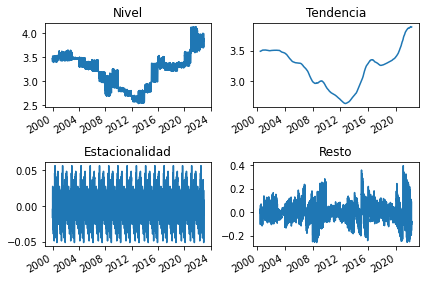

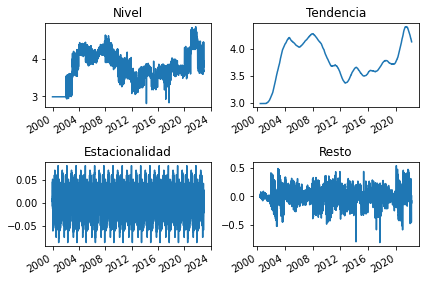

...

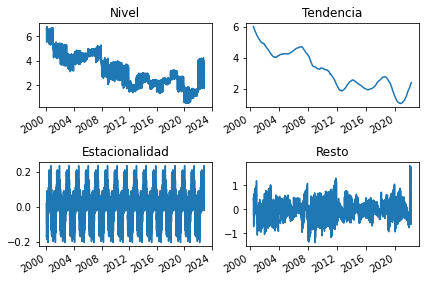

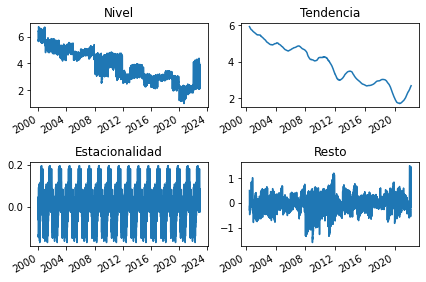

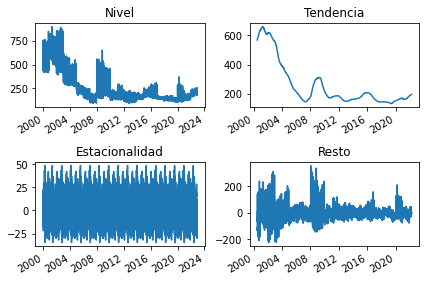

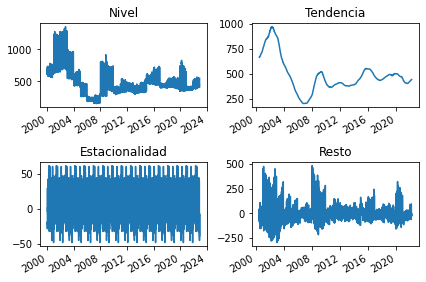

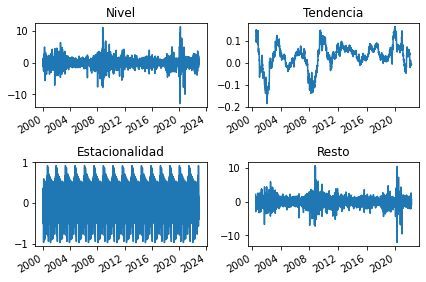

In [131]:

for i in range(20):

  
    
    # --> poner period en 7 pues es diaria, pero la grafica, debido a la cantidad de datos, pierde sentido visual
    res0=seasonal_decompose(data_diaria.iloc[:,[i]], model='additive', period=365)
    
    
    fig = plt.figure()

    ax0 = fig.add_subplot(221)
    res0.observed.plot()
    ax0.set_title('Nivel')
    ax0.set(xlabel=None)

    ax1 = fig.add_subplot(222)
    res0.trend.plot()
    ax1.set_title('Tendencia')
    ax1.set(xlabel=None)

    ax2 = fig.add_subplot(223)
    res0.seasonal.plot()
    ax2.set_title('Estacionalidad')
    ax2.set(xlabel=None)

    ax3 = fig.add_subplot(224)
    res0.resid.plot()
    ax3.set_title('Resto')
    ax3.set(xlabel=None)

    fig.tight_layout(pad=1.0)

In [ ]:
# Para descomposiciones STL siguiendo un modelo multiplicativo o post log linealización
#res1=seasonal_decompose(df_extr, model='multiplicable', period=12)
#res2=seasonal_decompose(np.log(df_extr), model='additive', period=12)

## Series de tiempo $\{x_{it}\}_{t=t_0}^{T}$ $i=1, ..., k=18$ cuya frecuencia es mensual


El periodo considerado (debido a que ninguna posee data pre 2005) es : $[t_0, T] = [2005/01, 2022/12]$. Nuevamente, se hace caso omiso al hecho que algunas series de tiempo no poseen datos desde o partir de cierta fecha.

In [141]:
#Mensuales
#Exportaciones totales (FOB millones de USD$), importaciones totales, circulante (millones S/.), preferencia por circulante en Ms/. 
# indicadores de las empresas bancarias: utilidad acumulada empresas bancarias, liquidez, coeficiente de dolarizacion, IPC
# IPC sin almentis y energia, IPC alimentos y energia, IPC subyacente y no subyacente, al por mayor, expectativa de finaclion  
# pbi y tipo de cambio a 12 meses, PBI (2007=100), variaciones porcentuales

url_base  = 'https://estadisticas.bcrp.gob.pe/estadisticas/series/api/'
cod_var   = ['RD38111BM', 'RD38136BM', 'PN00178MM', 'PN00492MM' , 'PN07782EM', 'PN00135MM', 'PN00143MM', 'PN38705PM',
            'PN38707PM', 'PN39521PM', 'PN38708PM', 'PN39522PM', 'PN38712PM', 'PD12912AM', 'PD38048AM', 'PD38049AM', 
             'PN01770AM', 'PN01728AM'] 
form_out  = '/json'
period    = '/2005-1/2019-12'


month_s = ['Ene','Feb','Mar','Abr','May','Jun','Jul','Ago','Set','Oct','Nov','Dic']
month_d = ['01','02','03','04','05','06','07','08','09','10','11','12']

#crear la mega tabla
df2 = pd.DataFrame()

#Transformando los datos a formato de base de datos Pandas. 


for j in cod_var:
    url_aux   = url_base + j + form_out + period
    resp      = requests.get(url_aux)
    resp_json = resp.json()
    periods   = resp_json['periods']
    
    value = []
    dates = []
    
    for i in periods:
        aux_dat = i['name']
        aux_val = i['values']
        dates.append(aux_dat)
        value.append(float(aux_val[0]))
    
    dict_aux = {'Fecha' : dates, 
                 resp_json['config']['series'][0]['name'] : value}
    df_aux = pd.DataFrame(dict_aux)

    df_aux['Fecha'] = df_aux['Fecha'].str.replace('.','-')
    for (s,d) in zip(month_s,month_d):
        df_aux['Fecha'] = df_aux['Fecha'].str.replace(s,d)
    df_aux['Fecha'] = pd.to_datetime(df_aux['Fecha'])

    
    df_aux.set_index(df_aux['Fecha'], inplace=True)
    df_aux = df_aux.drop(columns=['Fecha'])
    df2    = pd.concat([df2, df_aux], axis=1)


"""
for j in cod_var:
    url_aux   = url_base + j + form_out + period
    resp      = requests.get(url_aux)
    resp_json = resp.json()
    periods   = resp_json['periods']
    
    value = []
    dates = []
    
    for i in periods:
        aux_dat = i['name']
        aux_val = i['values']
        dates.append(aux_dat)
        value.append(float(aux_val[0]))
    
    dict_aux = {'Fecha' : dates, 
                 resp_json['config']['series'][0]['name'] : value}
    df_aux = pd.DataFrame(dict_aux)
    df_aux.set_index(df_aux['Fecha'], inplace=True)
    df_aux = df_aux.drop(columns=['Fecha'])
    df2    = pd.concat([df2, df_aux], axis=1)

"""

display(df2)

,Exportaciones por Departamento (Valores FOB en millones de US$) - Total,Importaciones por Aduana (Valores FOB en millones de US$) - Total,Liquidez de las sociedades creadoras de depósito (fin de periodo) - Circulante (millones S/),Emisión primaria y multiplicador (millones S/) - Preferencia por Circulante,Indicadores de las empresas bancarias - Utilidad acumulada - Empresas Bancarias (millones S/),Liquidez de las empresas bancarias - Liquidez (millones S/),Liquidez de las empresas bancarias - Coeficiente de Dolarización de la Liquidez (%),Índice de precios Lima Metropolitana (índice Dic.2021 = 100) - Índice de Precios al Consumidor (IPC),Índice de precios Lima Metropolitana (índice Dic.2021 = 100) - IPC Sin Alimentos y Energía,Índice de precios Lima Metropolitana (índice Dic.2021 = 100) - IPC Alimentos y Energía,Índice de precios Lima Metropolitana (índice Dic.2021 = 100) - IPC Subyacente,Índice de precios Lima Metropolitana (índice Dic.2021 = 100) - IPC No Subyacente,Índice de precios Lima Metropolitana (índice Dic.2021 = 100) - Índice de Precios al por Mayor,Expectativas Macroeconómicas - Expectativa de Inflación a 12 meses,Expectativas Macroeconómicas - Expectativa de PBI a 12 meses,Expectativas Macroeconómicas - Expectativa de TC a 12 meses,Producto bruto interno y demanda interna (índice 2007=100) - PBI,Producto bruto interno y demanda interna (variaciones porcentuales anualizadas) - PBI
Fecha,,,,,,,,,,,,,,,,,,
2005-01-01,1260.352460,917.979251,7432.417700,35.250586,56.739000,43313.45878,69.668209,61.004074,67.807647,54.422364,61.083230,60.799060,78.403744,2.500000,NaN,NaN,79.979161,5.355973
2005-02-01,1133.709115,806.797617,7600.953400,34.620034,131.450000,43566.66020,68.844027,60.860946,67.780635,54.209559,61.082538,60.457077,78.129461,2.533333,NaN,NaN,80.134460,8.147413
2005-03-01,1343.020060,935.096576,7499.042700,32.775764,232.974000,44035.53618,66.677556,61.256661,68.057712,54.643868,61.298785,61.097775,78.387935,2.500000,NaN,NaN,81.396413,3.511075
2005-04-01,1253.014325,1056.667343,7977.428900,35.163006,334.448000,44555.44492,68.678760,61.329449,68.032712,54.793575,61.336542,61.223326,78.480362,2.500000,NaN,NaN,87.073447,3.542415
2005-05-01,1349.999845,993.648561,8007.697200,35.273698,446.215000,45523.92100,68.904374,61.406927,68.154046,54.847992,61.433359,61.257328,78.674412,2.520833,NaN,NaN,92.141455,6.508898
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-08-01,3949.739026,3622.682147,49110.728905,21.946769,6253.475047,248870.80660,42.892703,91.735293,94.605552,88.573271,94.337730,86.891222,108.832239,2.300000,3.066667,3.378333,172.604171,3.697635
2019-09-01,4014.235755,3385.482100,48739.969947,21.820139,7000.092848,248021.07298,43.199641,91.741149,94.611537,88.578984,94.434669,86.729526,108.816647,2.212500,2.912500,3.359375,172.363764,2.489750
2019-10-01,4180.926600,3713.638310,48787.484509,21.662276,7721.738925,248625.83550,42.802151,91.842730,94.827588,88.554458,94.510211,86.879506,108.948766,2.229167,2.916667,3.358333,176.229838,2.678191


In [142]:
data_mensual_draft=df2.fillna(method='bfill')
data_mensual=data_mensual_draft.fillna(method='ffill')

display(data_mensual)

,Exportaciones por Departamento (Valores FOB en millones de US$) - Total,Importaciones por Aduana (Valores FOB en millones de US$) - Total,Liquidez de las sociedades creadoras de depósito (fin de periodo) - Circulante (millones S/),Emisión primaria y multiplicador (millones S/) - Preferencia por Circulante,Indicadores de las empresas bancarias - Utilidad acumulada - Empresas Bancarias (millones S/),Liquidez de las empresas bancarias - Liquidez (millones S/),Liquidez de las empresas bancarias - Coeficiente de Dolarización de la Liquidez (%),Índice de precios Lima Metropolitana (índice Dic.2021 = 100) - Índice de Precios al Consumidor (IPC),Índice de precios Lima Metropolitana (índice Dic.2021 = 100) - IPC Sin Alimentos y Energía,Índice de precios Lima Metropolitana (índice Dic.2021 = 100) - IPC Alimentos y Energía,Índice de precios Lima Metropolitana (índice Dic.2021 = 100) - IPC Subyacente,Índice de precios Lima Metropolitana (índice Dic.2021 = 100) - IPC No Subyacente,Índice de precios Lima Metropolitana (índice Dic.2021 = 100) - Índice de Precios al por Mayor,Expectativas Macroeconómicas - Expectativa de Inflación a 12 meses,Expectativas Macroeconómicas - Expectativa de PBI a 12 meses,Expectativas Macroeconómicas - Expectativa de TC a 12 meses,Producto bruto interno y demanda interna (índice 2007=100) - PBI,Producto bruto interno y demanda interna (variaciones porcentuales anualizadas) - PBI
Fecha,,,,,,,,,,,,,,,,,,
2005-01-01,1260.352460,917.979251,7432.417700,35.250586,56.739000,43313.45878,69.668209,61.004074,67.807647,54.422364,61.083230,60.799060,78.403744,2.500000,6.300000,3.250000,79.979161,5.355973
2005-02-01,1133.709115,806.797617,7600.953400,34.620034,131.450000,43566.66020,68.844027,60.860946,67.780635,54.209559,61.082538,60.457077,78.129461,2.533333,6.300000,3.250000,80.134460,8.147413
2005-03-01,1343.020060,935.096576,7499.042700,32.775764,232.974000,44035.53618,66.677556,61.256661,68.057712,54.643868,61.298785,61.097775,78.387935,2.500000,6.300000,3.250000,81.396413,3.511075
2005-04-01,1253.014325,1056.667343,7977.428900,35.163006,334.448000,44555.44492,68.678760,61.329449,68.032712,54.793575,61.336542,61.223326,78.480362,2.500000,6.300000,3.250000,87.073447,3.542415
2005-05-01,1349.999845,993.648561,8007.697200,35.273698,446.215000,45523.92100,68.904374,61.406927,68.154046,54.847992,61.433359,61.257328,78.674412,2.520833,6.300000,3.250000,92.141455,6.508898
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-08-01,3949.739026,3622.682147,49110.728905,21.946769,6253.475047,248870.80660,42.892703,91.735293,94.605552,88.573271,94.337730,86.891222,108.832239,2.300000,3.066667,3.378333,172.604171,3.697635
2019-09-01,4014.235755,3385.482100,48739.969947,21.820139,7000.092848,248021.07298,43.199641,91.741149,94.611537,88.578984,94.434669,86.729526,108.816647,2.212500,2.912500,3.359375,172.363764,2.489750
2019-10-01,4180.926600,3713.638310,48787.484509,21.662276,7721.738925,248625.83550,42.802151,91.842730,94.827588,88.554458,94.510211,86.879506,108.948766,2.229167,2.916667,3.358333,176.229838,2.678191


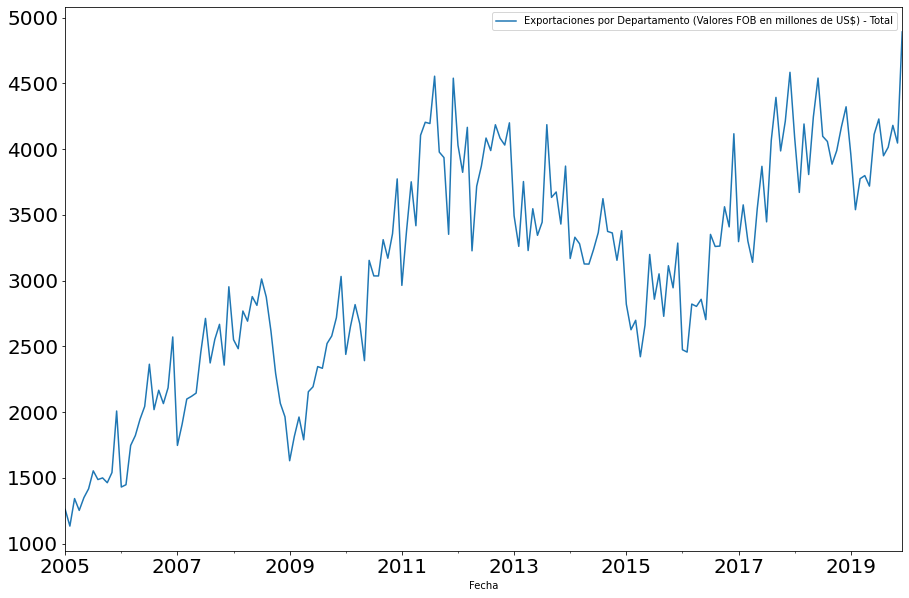

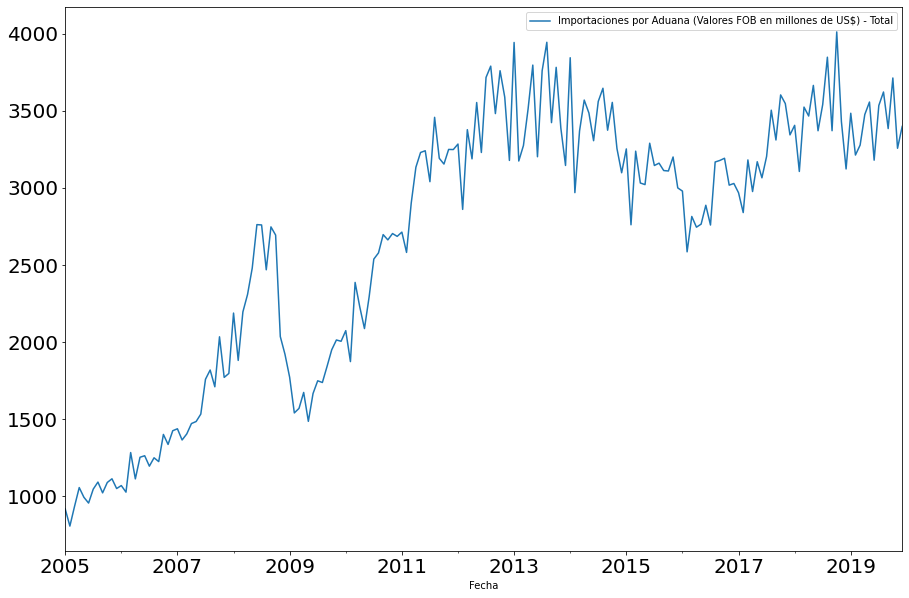

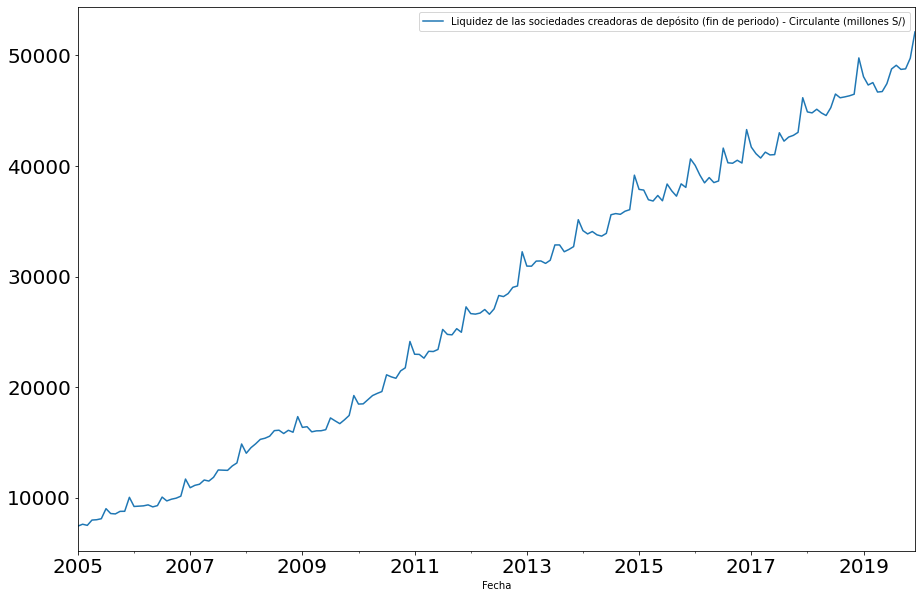

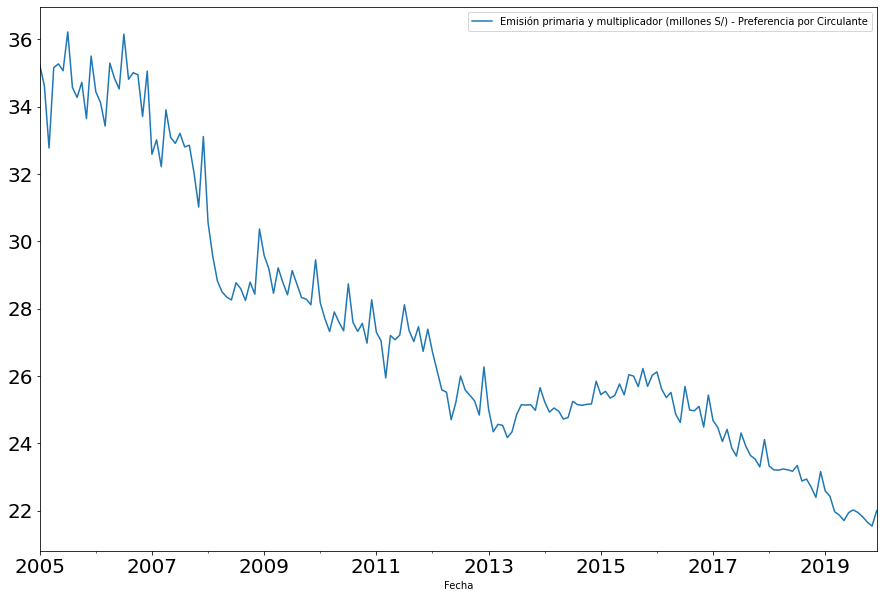

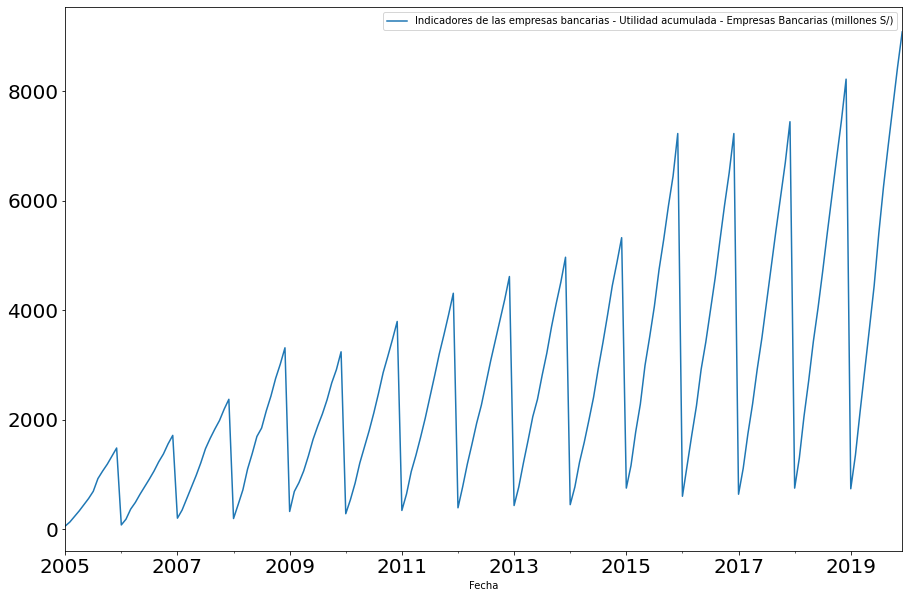

...

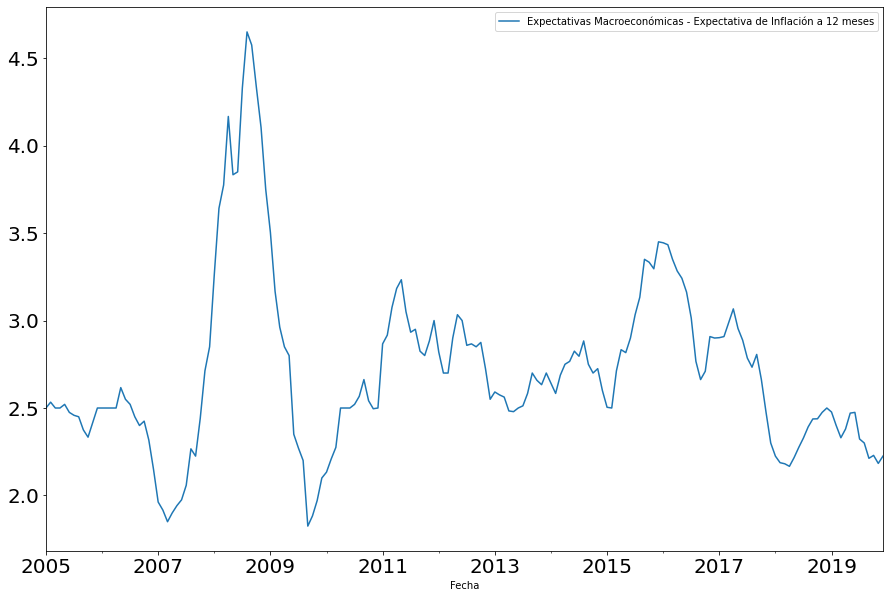

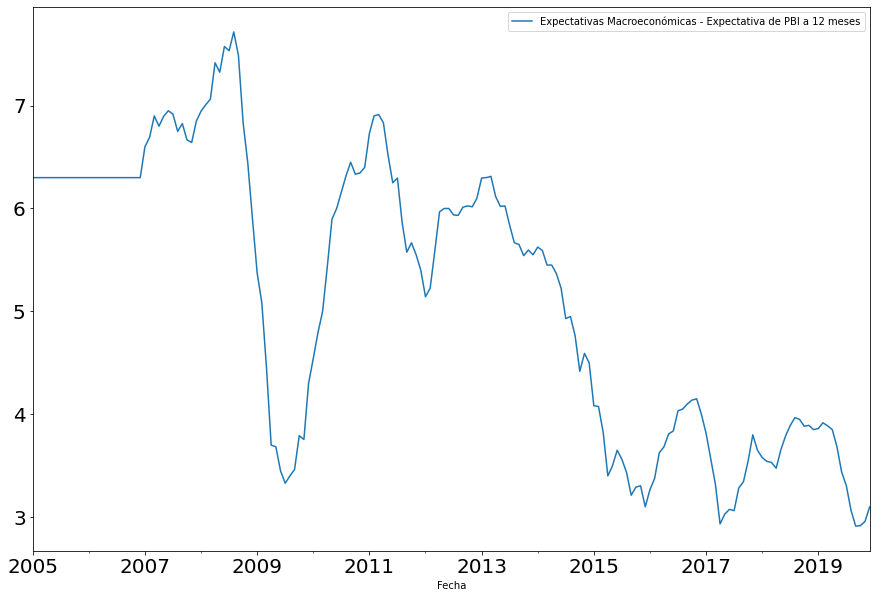

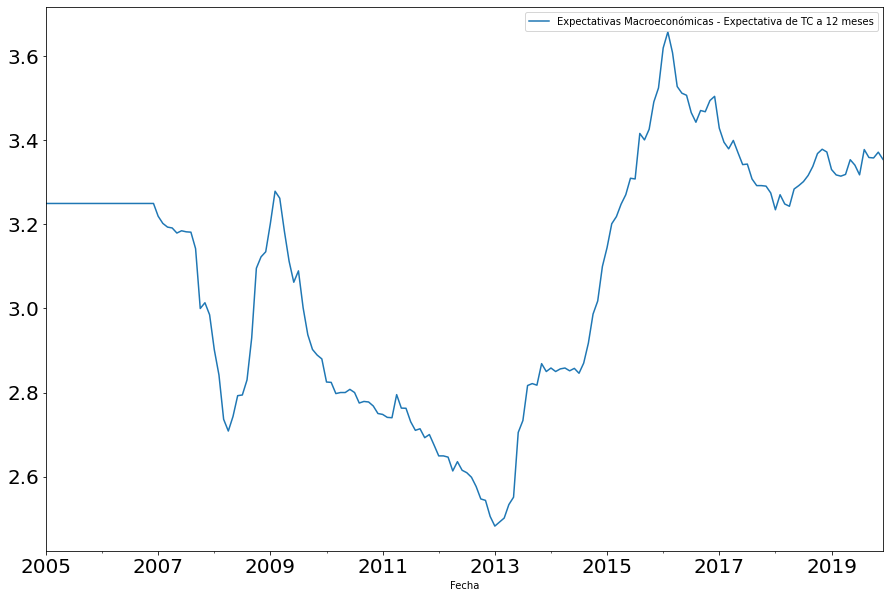

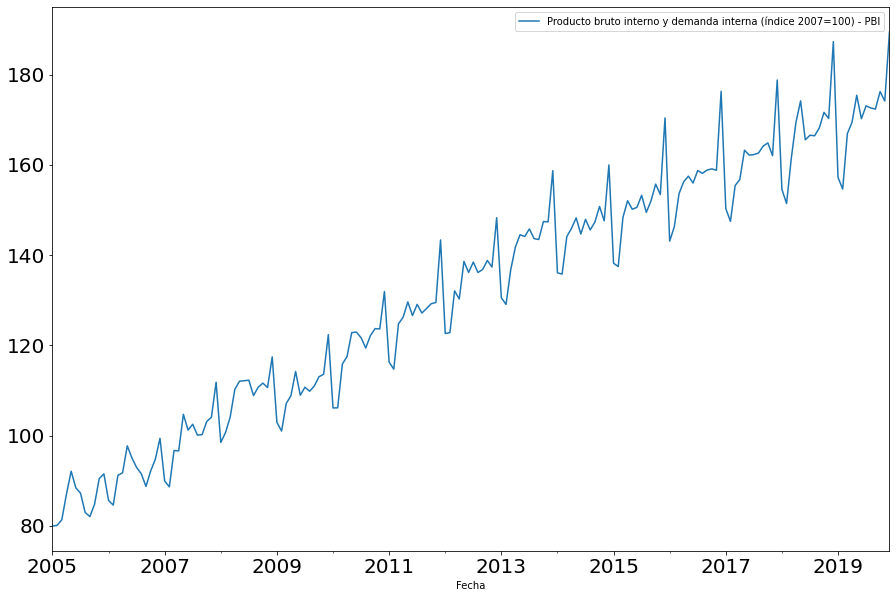

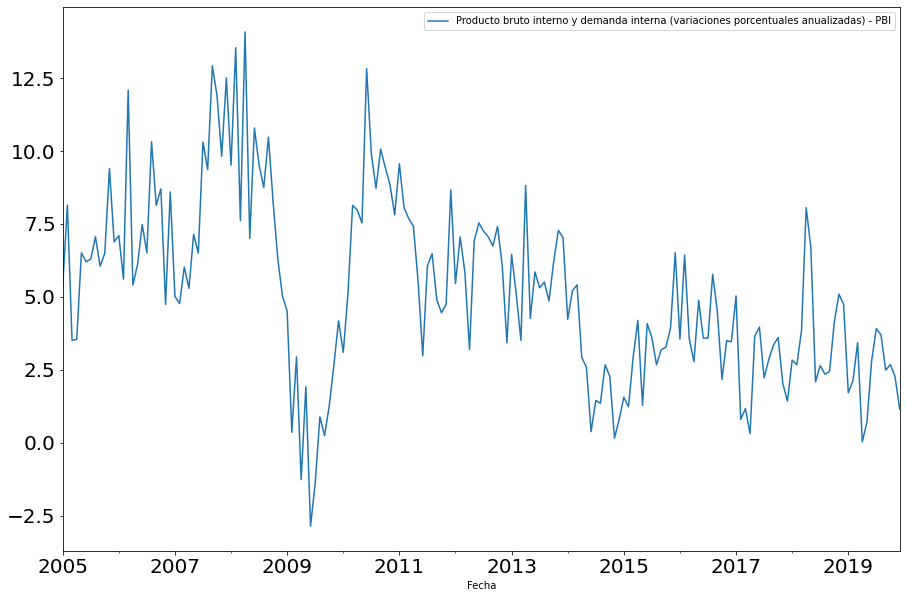

In [143]:
for i in range(18):
    df_timeserie2 = data_mensual.iloc[:,[i]].bfill()
    fig = df_timeserie2.plot(figsize=(15, 10), fontsize=20, legend=dict_aux).get_figure()

    

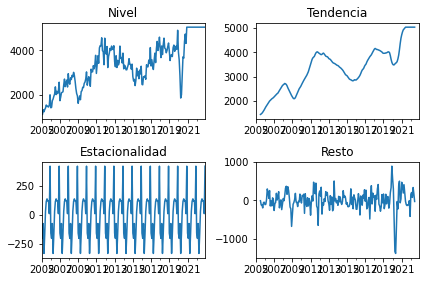

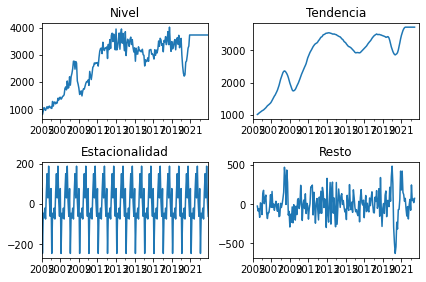

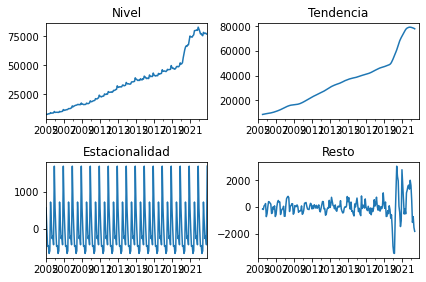

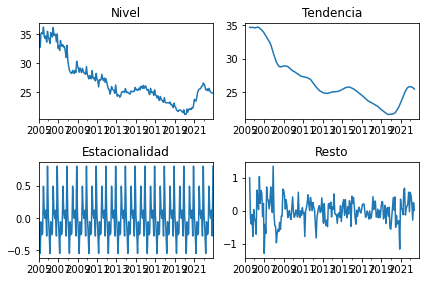

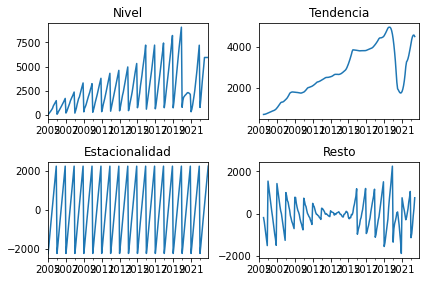

...

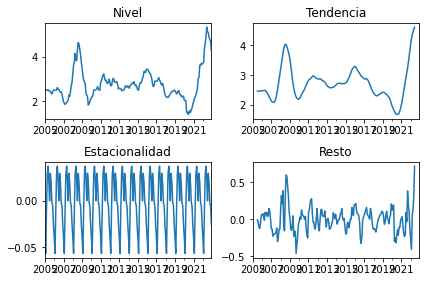

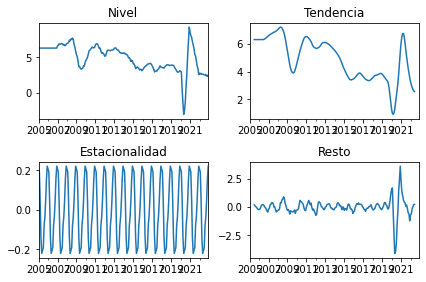

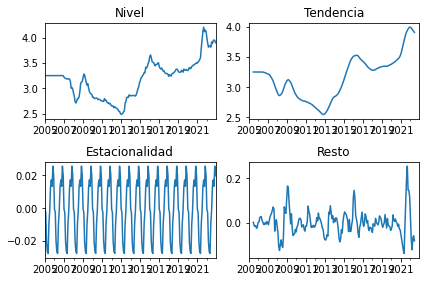

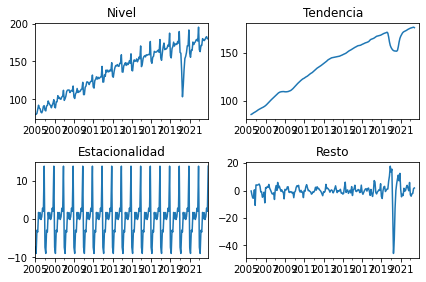

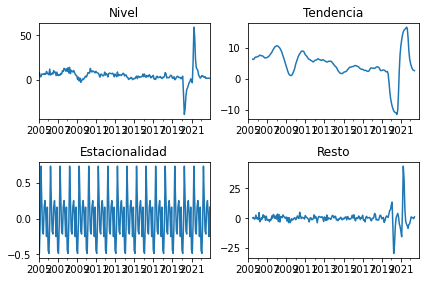

In [139]:
for i in range(18):
    # period 12
   
    res0=seasonal_decompose(data_mensual.iloc[:,[i]], model='additive', period=12)
    
    
    fig = plt.figure()

    ax0 = fig.add_subplot(221)
    res0.observed.plot()
    ax0.set_title('Nivel')
    ax0.set(xlabel=None)

    ax1 = fig.add_subplot(222)
    res0.trend.plot()
    ax1.set_title('Tendencia')
    ax1.set(xlabel=None)

    ax2 = fig.add_subplot(223)
    res0.seasonal.plot()
    ax2.set_title('Estacionalidad')
    ax2.set(xlabel=None)

    ax3 = fig.add_subplot(224)
    res0.resid.plot()
    ax3.set_title('Resto')
    ax3.set(xlabel=None)

    fig.tight_layout(pad=1.0)

## Series de tiempo trimestrales 
Vamos a considerar, sin importar la disponibilidad de data de cada serie de tiempo individualmente, el periodo 2000-T1/2021-T3. Esto pues, como la frecuencia es trimestral, si nos limitamos a la disponibilidad de datos de cada serie, terminaremos con muy poca información globalmente. 


In [200]:
#Trimestrales
# Índice de precios hedónicos de inmuebles, terminos de intercambio, PBI (2007=100), demanda interna consumo privado (millones 
#2007), demanda interna consumo publico (millones 2007),  demanda interna exportaciones e importaciones (millones 2007), 
# venta de energia electria total (GWH), produccion de energia electria total (GWH)
 


url_base  = 'https://estadisticas.bcrp.gob.pe/estadisticas/series/api/'
cod_var   = ['PD37940PQ', 'PN39352BQ', 'PN02516AQ', 'PN02529AQ', 'PN02530AQ', 'PN02531AQ', 'PN02536AQ', 'PN02537AQ',
            'RD14428DQ', 'RD14378DQ'] 
form_out  = '/json'
period    = '/2000-T1/2021-T3'


# dejamos la nomenclatura T.

#crear la mega tabla
df3 = pd.DataFrame()

#Transformando los datos a formato de base de datos Pandas. 

for j in cod_var:
    url_aux   = url_base + j + form_out + period
    resp      = requests.get(url_aux)
    resp_json = resp.json()
    periods   = resp_json['periods']
    
    value = []
    dates = []
    
    for i in periods:
        aux_dat = i['name']
        aux_val = i['values']
        dates.append(aux_dat)
        value.append(float(aux_val[0]))
    
    dict_aux = {'Fecha' : dates, 
                 resp_json['config']['series'][0]['name'] : value}
    df_aux = pd.DataFrame(dict_aux)
    df_aux.set_index(df_aux['Fecha'], inplace=True)
    df_aux = df_aux.drop(columns=['Fecha'])
    df3    = pd.concat([df3, df_aux], axis=1)

display(df3)

,Índice de precios de inmuebles - Índice de precios hedónicos de inmuebles,Términos de intercambio de comercio exterior (índice 2007 = 100) - Términos de Intercambio,Producto bruto interno (índice 2007 = 100) - PBI Global,Producto bruto interno por tipo de gasto (millones S/ 2007) - Demanda Interna - Consumo Privado,Producto bruto interno por tipo de gasto (millones S/ 2007) - Demanda Interna - Consumo Público,Producto bruto interno por tipo de gasto (millones S/ 2007) - Demanda Interna - Inversión Bruta Interna,Producto bruto interno por tipo de gasto (millones S/ 2007) - Exportaciones,Producto bruto interno por tipo de gasto (millones S/ 2007) - Importaciones,Venta de energía eléctrica por departamento - Total (gwh),Producción de electricidad por departamento - Total (gwh)
Fecha,,,,,,,,,,
T4.07,37.439966,NaN,106.368669,49355.000000,9062.000000,19958.597515,26528.749512,19891.058026,6464.702474,7810.439752
T1.08,38.218694,NaN,101.092382,50198.747000,8446.000000,18463.879222,24996.773313,21309.082535,6628.057703,8021.207739
T2.08,43.810833,NaN,111.504117,53698.142000,8409.000000,24506.102299,25532.591402,23028.121700,6760.948631,8070.605873
T3.08,49.390820,NaN,110.643950,53716.922000,8923.000000,22309.235601,27689.307632,24208.224233,6809.490439,8142.209647
T4.08,50.482453,NaN,113.265824,51822.750000,9448.000000,25459.996128,27418.708371,23623.726499,6804.833241,8229.083024
...,...,...,...,...,...,...,...,...,...,...
T3.06,NaN,NaN,91.095231,45099.679108,8081.896069,10484.386900,24017.825334,14877.518346,5579.537963,6829.039864
T4.06,NaN,NaN,95.462662,45031.080697,9576.017279,13728.996754,25119.239326,17158.471872,5815.984680,7137.142592
T1.07,NaN,NaN,91.780700,46181.000000,7999.000000,14604.280160,21907.711219,17337.857379,5956.440845,7285.946164


In [202]:
data_trimestral_draft=df3.fillna(method='bfill')
data_trimestral=data_trimestral_draft.fillna(method='ffill')

display(data_trimestral)

,Índice de precios de inmuebles - Índice de precios hedónicos de inmuebles,Términos de intercambio de comercio exterior (índice 2007 = 100) - Términos de Intercambio,Producto bruto interno (índice 2007 = 100) - PBI Global,Producto bruto interno por tipo de gasto (millones S/ 2007) - Demanda Interna - Consumo Privado,Producto bruto interno por tipo de gasto (millones S/ 2007) - Demanda Interna - Consumo Público,Producto bruto interno por tipo de gasto (millones S/ 2007) - Demanda Interna - Inversión Bruta Interna,Producto bruto interno por tipo de gasto (millones S/ 2007) - Exportaciones,Producto bruto interno por tipo de gasto (millones S/ 2007) - Importaciones,Venta de energía eléctrica por departamento - Total (gwh),Producción de electricidad por departamento - Total (gwh)
Fecha,,,,,,,,,,
T4.07,37.439966,111.024744,106.368669,49355.000000,9062.000000,19958.597515,26528.749512,19891.058026,6464.702474,7810.439752
T1.08,38.218694,111.024744,101.092382,50198.747000,8446.000000,18463.879222,24996.773313,21309.082535,6628.057703,8021.207739
T2.08,43.810833,111.024744,111.504117,53698.142000,8409.000000,24506.102299,25532.591402,23028.121700,6760.948631,8070.605873
T3.08,49.390820,111.024744,110.643950,53716.922000,8923.000000,22309.235601,27689.307632,24208.224233,6809.490439,8142.209647
T4.08,50.482453,111.024744,113.265824,51822.750000,9448.000000,25459.996128,27418.708371,23623.726499,6804.833241,8229.083024
...,...,...,...,...,...,...,...,...,...,...
T3.06,106.530712,115.976096,91.095231,45099.679108,8081.896069,10484.386900,24017.825334,14877.518346,5579.537963,6829.039864
T4.06,106.530712,115.976096,95.462662,45031.080697,9576.017279,13728.996754,25119.239326,17158.471872,5815.984680,7137.142592
T1.07,106.530712,115.976096,91.780700,46181.000000,7999.000000,14604.280160,21907.711219,17337.857379,5956.440845,7285.946164


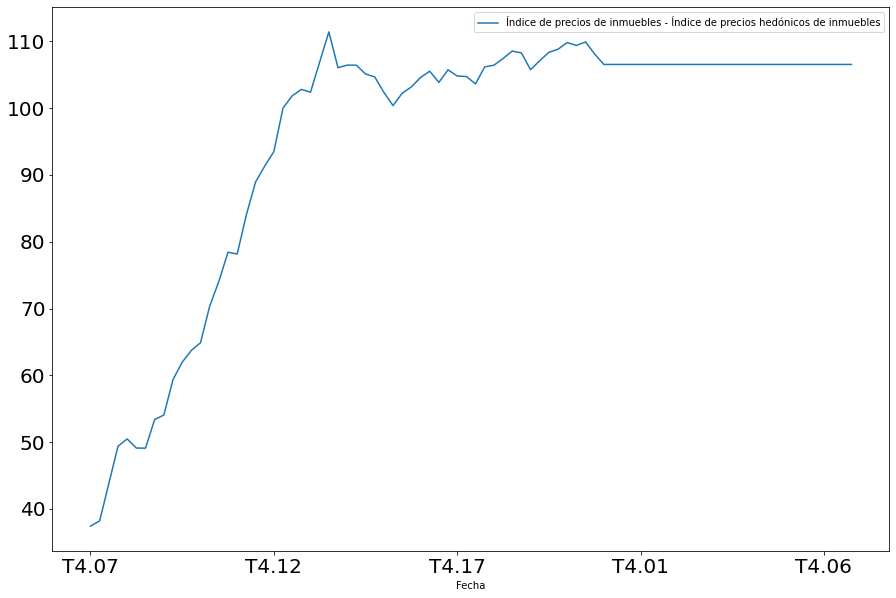

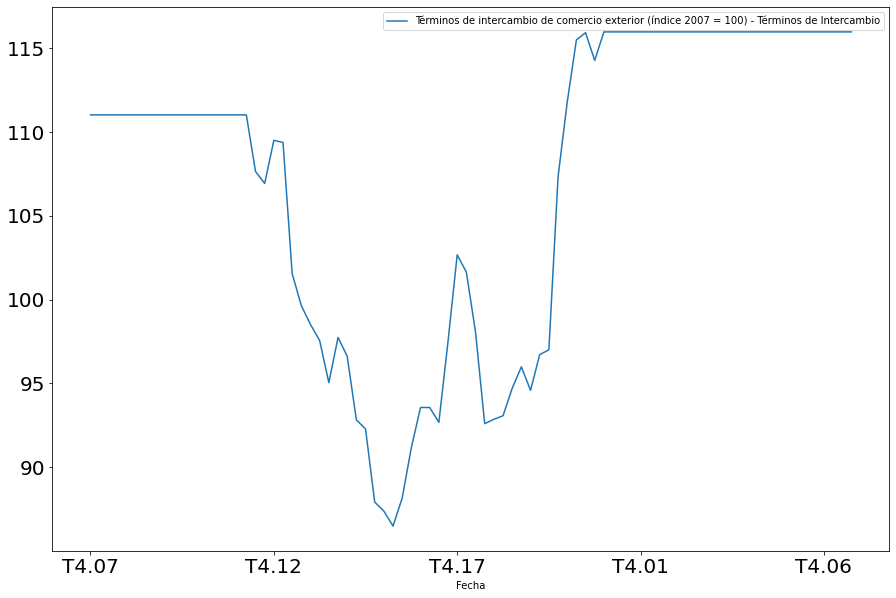

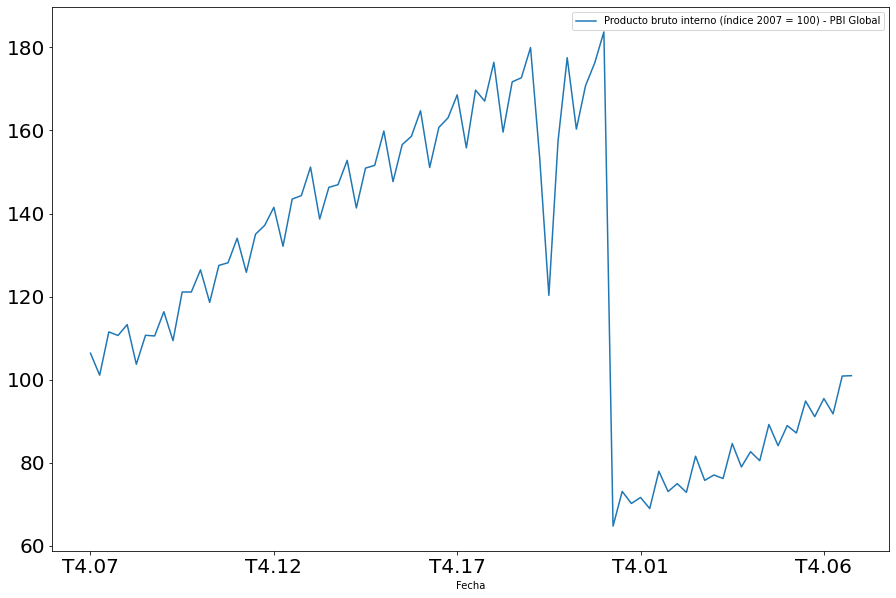

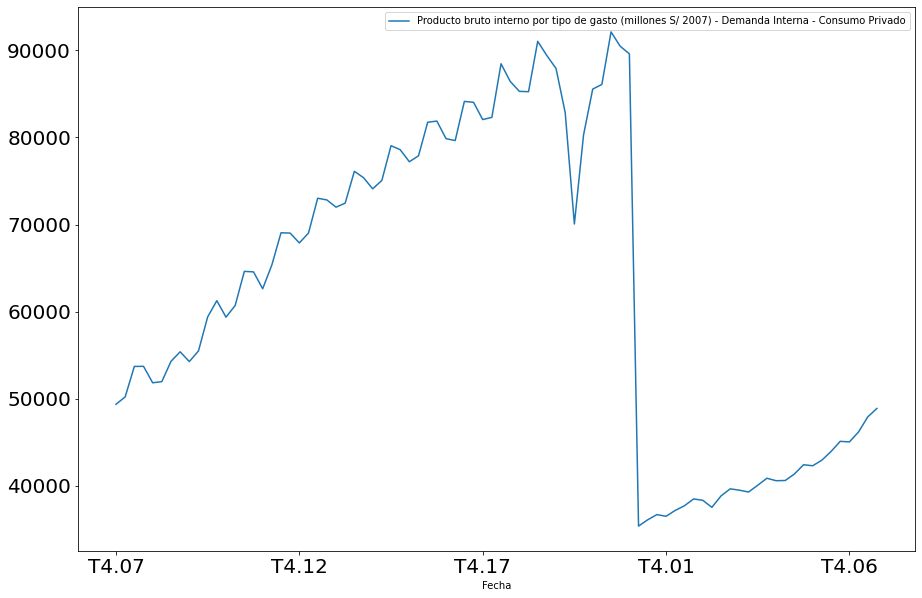

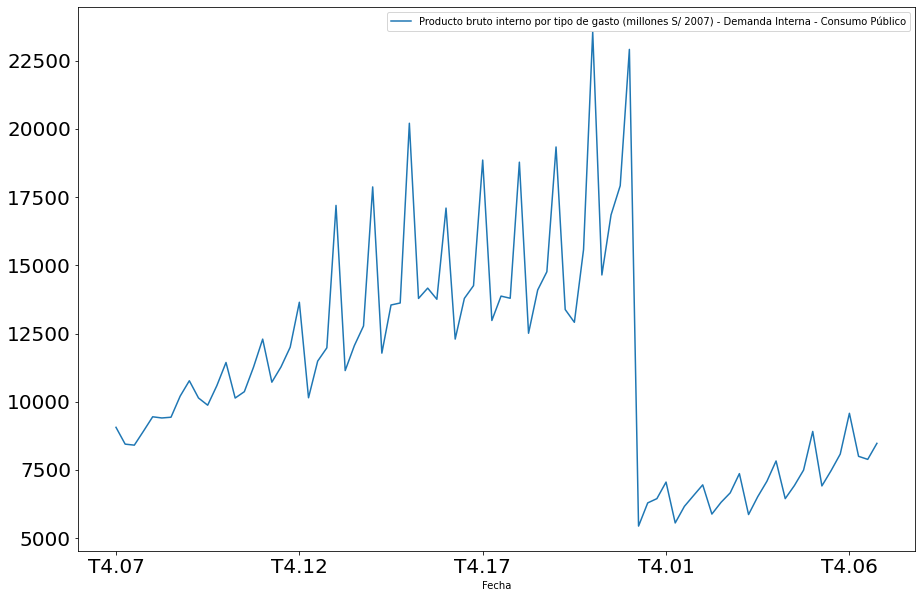

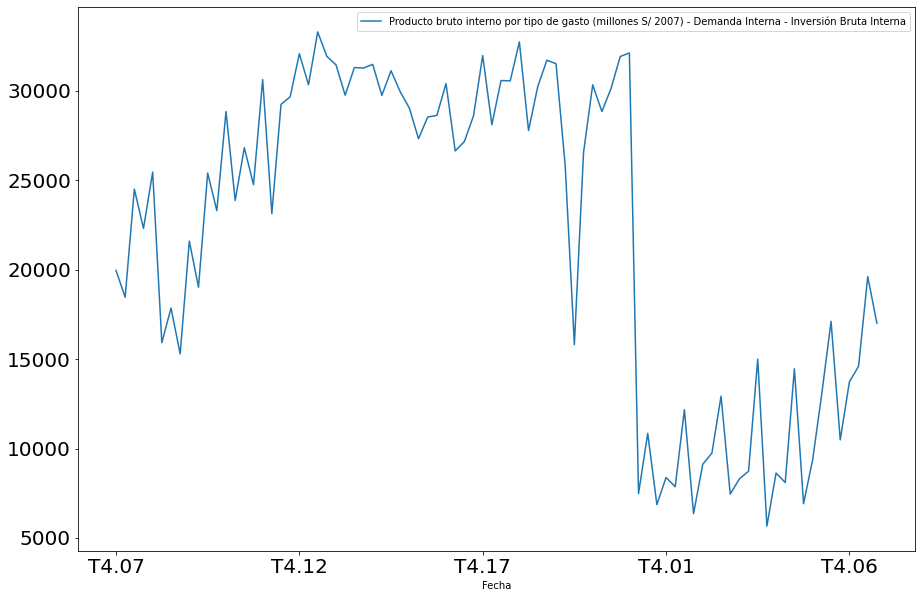

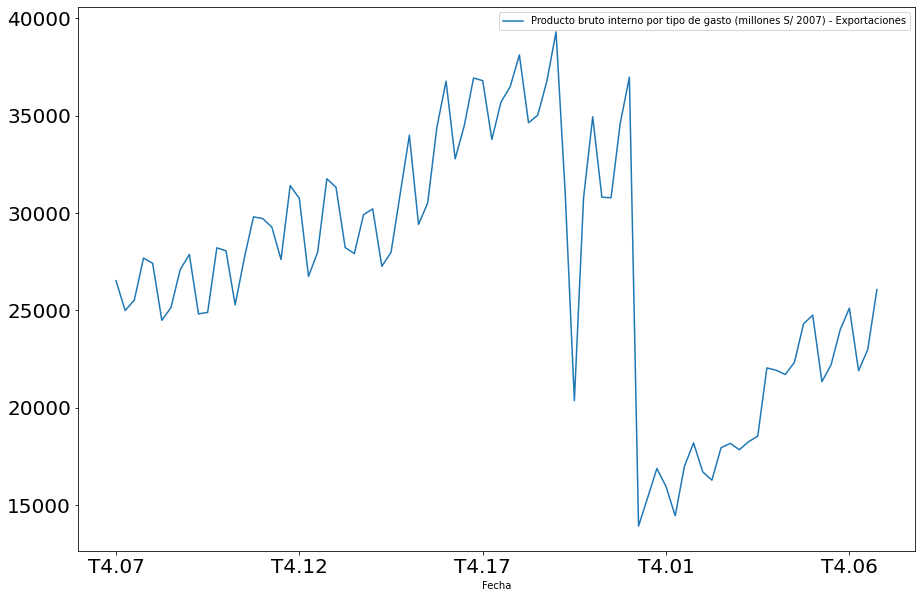

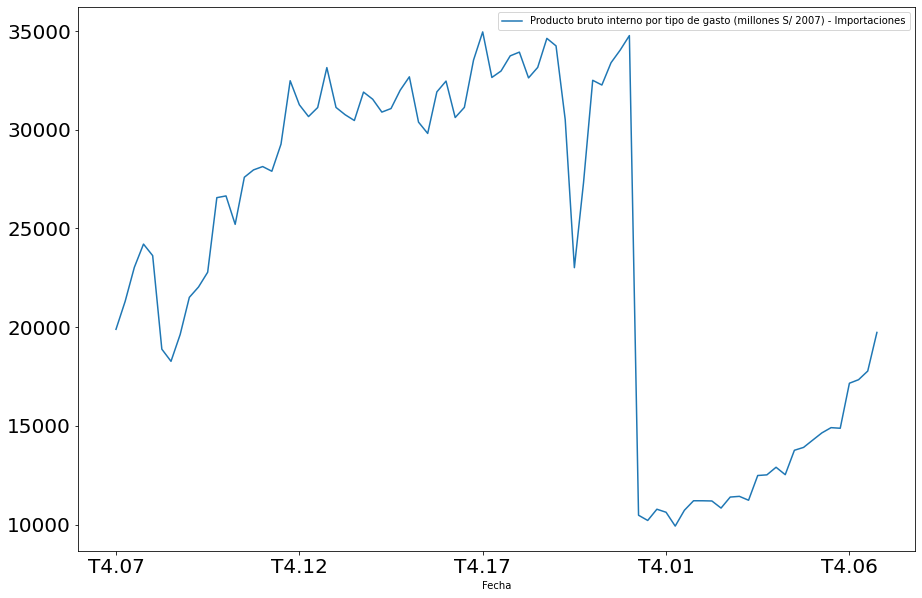

In [204]:
for i in range(8):
    df_timeserie3 = data_trimestral.iloc[:,[i]] 
    fig = df_timeserie3.plot(figsize=(15, 10), fontsize=20, legend=dict_aux).get_figure()


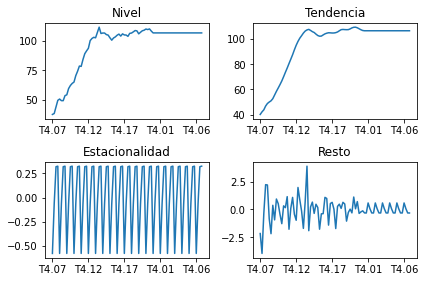

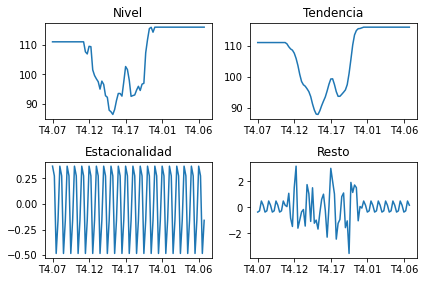

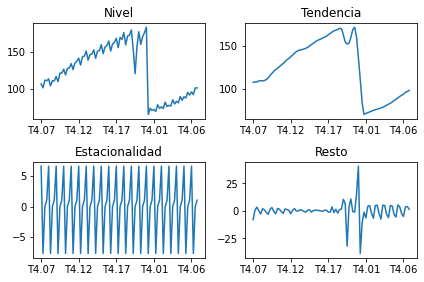

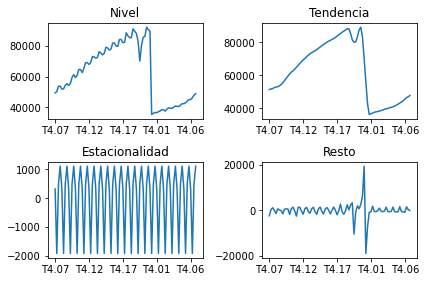

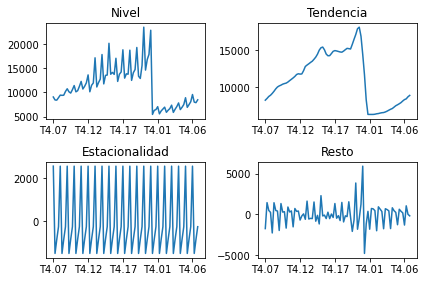

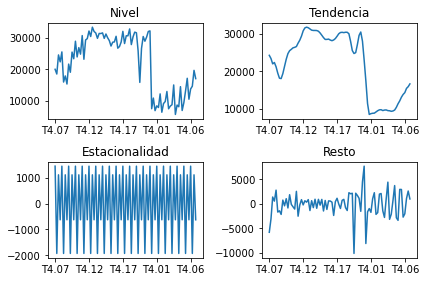

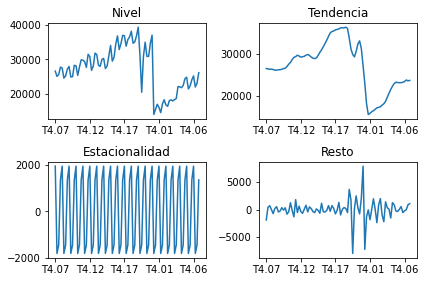

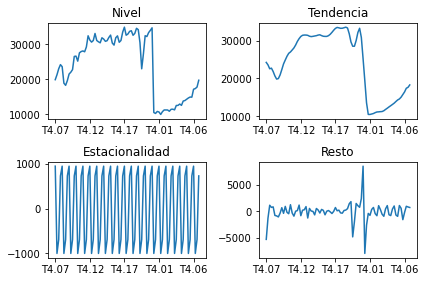

In [205]:
for i in range(8):
    # period 4 pues la data es trimestral
    res0=seasonal_decompose(data_trimestral.iloc[:,[i]], model='additive', period=4, extrapolate_trend='freq')
    
    
    fig = plt.figure()

    ax0 = fig.add_subplot(221)
    res0.observed.plot()
    ax0.set_title('Nivel')
    ax0.set(xlabel=None)

    ax1 = fig.add_subplot(222)
    res0.trend.plot()
    ax1.set_title('Tendencia')
    ax1.set(xlabel=None)

    ax2 = fig.add_subplot(223)
    res0.seasonal.plot()
    ax2.set_title('Estacionalidad')
    ax2.set(xlabel=None)

    ax3 = fig.add_subplot(224)
    res0.resid.plot()
    ax3.set_title('Resto')
    ax3.set(xlabel=None)

    fig.tight_layout(pad=1.0)

## Outliers

La detección de outliers puede efectuar a través de la descomposición STL (y esto es coherente con el énfasis de la pregunta). En efecto, escribiendo $Y_t= S_t+C_t+T_t+ \underbrace{\varepsilon_t}_{\text{Resto}}$, si buscamos anomalías, el término de error $\varepsilon_t$ recoge de cierta forma los outliers pues es una normalización de la serie $Y_t$ pues tanto el componente tendencial $T_t$, el ciclo $C_t$ y el componente estacional $S_t$ son patrones no estocásticos. Así, las anomalías se podrán observar (con mayor facilidad) en el gráfico del resto. 

Concretamente, se identifica irregularidad (presencia de outlier) en $t = t_{j}$ si $\varepsilon_{t_j} \geq 3\sigma_{\varepsilon}$. En caso $\varepsilon \sim \mathcal{N}(0, 1)$, $3\sigma_{\varepsilon}=3$. Dado que no conocemos a priori la distribución de la data, se emplea el método intercuartil: $y_t \not \in [Q1-1.5 \cdot IQR, Q3+1.5 \cdot IQR ] $. 

In [206]:
def find_outliers_IQR(df):

   q1=df.quantile(0.25)

   q3=df.quantile(0.75)

   IQR=q3-q1

   outliers = df[((df<(q1-1.5*IQR)) | (df>(q3+1.5*IQR)))]

   return outliers

In [449]:

# si no es outlier: NAN

outliers = find_outliers_IQR(df1)


print("number of outliers: " + str(len(outliers)))

print("max outlier value: "+ str(outliers.max()))

print("min outlier value: "+ str(outliers.min()))

outliers

number of outliers: 3952
max outlier value: Tasas de interés - Interbancaria, S/                                                        7.450000
Tasas de interés - Rendimiento del Bono del gobierno peruano a 10 años (en S/)             10.045000
Tipo de cambio - TC Interbancario (S/ por US$) - Compra                                          NaN
Tipo de cambio - TC Interbancario (S/ por US$) - Venta                                           NaN
Tipo de cambio - TC Euro (S/ por Euro) - Compra                                             4.859000
Tipo de cambio - TC Euro (S/ por Euro) - Venta                                              5.206000
Indicadores bursátiles - Índice General Bursátil BVL (índice)                            6054.000000
Indicadores bursátiles - Índice Selectivo Bursátil BVL (índice)                         42139.760000
Indicadores bursátiles - Monto negociado en acciones (millones S/) - Promedio diario     3901.156926
Cotizaciones internacionales - Cobre (Londres, 

,"Tasas de interés - Interbancaria, S/",Tasas de interés - Rendimiento del Bono del gobierno peruano a 10 años (en S/),Tipo de cambio - TC Interbancario (S/ por US$) - Compra,Tipo de cambio - TC Interbancario (S/ por US$) - Venta,Tipo de cambio - TC Euro (S/ por Euro) - Compra,Tipo de cambio - TC Euro (S/ por Euro) - Venta,Indicadores bursátiles - Índice General Bursátil BVL (índice),Indicadores bursátiles - Índice Selectivo Bursátil BVL (índice),Indicadores bursátiles - Monto negociado en acciones (millones S/) - Promedio diario,"Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)","Cotizaciones internacionales - Plata (H.Harman, US$ por onzas troy)","Cotizaciones internacionales - Zinc (Londres, cUS$ por libras)","Cotizaciones internacionales - Oro (Londres, US$ por onzas troy)","Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)",Tasas de interés internacionales - Bonos del Tesoro EE.UU. - 5 años (%),Tasas de interés internacionales - Bonos del Tesoro EE.UU. - 10 años (%),Tasas de interés internacionales - Bonos del Tesoro EE.UU. - 30 años (%),Tasas de interés: EMBIG (variación en pbs) - Spread - EMBIG Perú (pbs),Tasas de interés: EMBIG (variación en pbs) - Spread - EMBIG America Latina (pbs),Bolsas (índices) - Dow Jones (var%)
Fecha,,,,,,,,,,,,,,,,,,,,
03.Ene.06,NaN,8.20,NaN,NaN,NaN,NaN,4807.74,7694.87,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
04.Ene.06,NaN,8.20,NaN,NaN,NaN,NaN,4889.63,7844.72,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
05.Ene.06,NaN,8.20,NaN,NaN,NaN,NaN,4911.53,7915.91,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
06.Ene.06,NaN,8.20,NaN,NaN,NaN,NaN,4820.78,7749.88,164.822595,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
09.Ene.06,NaN,8.28,NaN,NaN,NaN,NaN,4781.77,7688.97,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25.Nov.22,7.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,262.001755,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
28.Nov.22,7.25,NaN,NaN,NaN,NaN,NaN,NaN,NaN,228.668752,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
29.Nov.22,7.30,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [207]:
outliers = find_outliers_IQR(df2)


print("number of outliers: " + str(len(outliers)))

print("max outlier value: "+ str(outliers.max()))

print("min outlier value: "+ str(outliers.min()))

outliers

number of outliers: 180
max outlier value: Exportaciones por Departamento (Valores FOB en millones de US$) - Total                                         NaN
Importaciones por Aduana (Valores FOB en millones de US$) - Total                                               NaN
Liquidez de las sociedades creadoras de depósito (fin de periodo) - Circulante (millones S/)                    NaN
Emisión primaria y multiplicador (millones S/) - Preferencia por Circulante                               36.224000
Indicadores de las empresas bancarias - Utilidad acumulada - Empresas Bancarias (millones S/)           9082.308869
Liquidez de las empresas bancarias - Liquidez (millones S/)                                                     NaN
Liquidez de las empresas bancarias - Coeficiente de Dolarización de la Liquidez (%)                             NaN
Índice de precios Lima Metropolitana (índice Dic.2021 = 100) - Índice de Precios al Consumidor (IPC)            NaN
Índice de precios Lima Metrop

,Exportaciones por Departamento (Valores FOB en millones de US$) - Total,Importaciones por Aduana (Valores FOB en millones de US$) - Total,Liquidez de las sociedades creadoras de depósito (fin de periodo) - Circulante (millones S/),Emisión primaria y multiplicador (millones S/) - Preferencia por Circulante,Indicadores de las empresas bancarias - Utilidad acumulada - Empresas Bancarias (millones S/),Liquidez de las empresas bancarias - Liquidez (millones S/),Liquidez de las empresas bancarias - Coeficiente de Dolarización de la Liquidez (%),Índice de precios Lima Metropolitana (índice Dic.2021 = 100) - Índice de Precios al Consumidor (IPC),Índice de precios Lima Metropolitana (índice Dic.2021 = 100) - IPC Sin Alimentos y Energía,Índice de precios Lima Metropolitana (índice Dic.2021 = 100) - IPC Alimentos y Energía,Índice de precios Lima Metropolitana (índice Dic.2021 = 100) - IPC Subyacente,Índice de precios Lima Metropolitana (índice Dic.2021 = 100) - IPC No Subyacente,Índice de precios Lima Metropolitana (índice Dic.2021 = 100) - Índice de Precios al por Mayor,Expectativas Macroeconómicas - Expectativa de Inflación a 12 meses,Expectativas Macroeconómicas - Expectativa de PBI a 12 meses,Expectativas Macroeconómicas - Expectativa de TC a 12 meses,Producto bruto interno y demanda interna (índice 2007=100) - PBI,Producto bruto interno y demanda interna (variaciones porcentuales anualizadas) - PBI
Fecha,,,,,,,,,,,,,,,,,,
2005-01-01,NaN,NaN,NaN,35.250586,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005-02-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005-03-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005-04-01,NaN,NaN,NaN,35.163006,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2005-05-01,NaN,NaN,NaN,35.273698,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-08-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-09-01,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-10-01,NaN,NaN,NaN,NaN,7721.738925,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [208]:
outliers = find_outliers_IQR(df3)

print("number of outliers: " + str(len(outliers)))

print("max outlier value: "+ str(outliers.max()))

print("min outlier value: "+ str(outliers.min()))

outliers

number of outliers: 84
max outlier value: Índice de precios de inmuebles - Índice de precios hedónicos de inmuebles                                           NaN
Términos de intercambio de comercio exterior (índice 2007 = 100) - Términos de Intercambio                          NaN
Producto bruto interno (índice 2007 = 100) - PBI Global                                                             NaN
Producto bruto interno por tipo de gasto (millones S/ 2007) - Demanda Interna - Consumo Privado                     NaN
Producto bruto interno por tipo de gasto (millones S/ 2007) - Demanda Interna - Consumo Público            23551.468326
Producto bruto interno por tipo de gasto (millones S/ 2007) - Demanda Interna - Inversión Bruta Interna             NaN
Producto bruto interno por tipo de gasto (millones S/ 2007) - Exportaciones                                         NaN
Producto bruto interno por tipo de gasto (millones S/ 2007) - Importaciones                                         Na

,Índice de precios de inmuebles - Índice de precios hedónicos de inmuebles,Términos de intercambio de comercio exterior (índice 2007 = 100) - Términos de Intercambio,Producto bruto interno (índice 2007 = 100) - PBI Global,Producto bruto interno por tipo de gasto (millones S/ 2007) - Demanda Interna - Consumo Privado,Producto bruto interno por tipo de gasto (millones S/ 2007) - Demanda Interna - Consumo Público,Producto bruto interno por tipo de gasto (millones S/ 2007) - Demanda Interna - Inversión Bruta Interna,Producto bruto interno por tipo de gasto (millones S/ 2007) - Exportaciones,Producto bruto interno por tipo de gasto (millones S/ 2007) - Importaciones,Venta de energía eléctrica por departamento - Total (gwh),Producción de electricidad por departamento - Total (gwh)
Fecha,,,,,,,,,,
T4.07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
T1.08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
T2.08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
T3.08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
T4.08,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
T3.06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
T4.06,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
T1.07,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Análisis cualitativo: analizar las tablas previas, si sale NaN, no hay outlier, caso contrario, se confirma su existencia.

Análisis gráfico:

Diaria
1.	Tasa de interés interbancaria en el tramo 2000-2003 (cerca del 2002). 
2.	Tasas de interés - Rendimiento del Bono del gobierno peruano a 10 años (en S/)  en el bloque 2000-2008, posiblemente por nan. 
3.	Debido a missing values, el término de error del TC presenta irregularidades en el primer tramo. Sin embargo, se nota un outlier en el último tramo: inestabilidad política, elecciones 2021.
4.	Idem al inciso anterior, coherente con el hecho que es el TC pero venta.
5.	Idem al inciso anterior, coherente con el hecho que es el TC pero con referencia el Euro.  pero venta.
6.	Idem al inciso anterior, coherente con el hecho que es el TC pero con referencia el Euro y en vez de compra es venta.
7.	Indicadores bursátiles (IGB) en el último periodo (Covid, crisis política).
8.	Indicadores bursátiles (ISB) en el último periodo (Covid, crisis política).
9.	El monto negociado en acciones presenta muchas irregularidades. 
10.	Las cotizaciones internacionales cobre presentan irregularidades en las fechas: crisis subprimes, último tramo (Covid).
11.	 Las cotizaciones internacionales plata presentan irregularidades en la misma fecha.
12.	Lo mismo para el zinc.
13.	Lo mismo para el oro.
14.	Lo mismo para el petróleo. Notemos que los Outliers se acumulan en el periodo 2020: esto es consistente pues coincide con la crisis sanitaria. 
15.	Tasa de interés internacionales Bonos del Tesoro EEUU 5 años: irregularidades en la última sección de datos. 
16.	Análogo para la tasa de interés internacionales Bonos del Tesoro EEUU 10 años.
17.	Análogo para la tasa de interés internacionales Bonos del Tesoro EEUU 30 años.
18.	Tasa de interés EMBIG: 2008 y > 2020: subprimes, crisis sanitaria.
19.	Spread: idem que el anterior.
20.	Outlier en la época de la crisis de subprimes. 

Mensual 
1.	Exportaciones por departamento: irregularidad en inicios 2020 (Covid).
2.	Idem: importaciones por aduana.
3.	Liquidez de las sociedades lucrativas: irregularidad / outliers > 2019.
4.	Emisión primaria y multiplicador: s.c.
5.	Indicadores de las empresas bancarias - Utilidad acumulad: s.c.
6.	Liquidez de las empresas bancarias: outliers en el último tramo.
7.	Liquidez de las empresas bancarias - Coeficiente de Dolarización de la Liquidez: outlier en el tramo inicial (primer bloque). 
8.	Índice de Precios al Consumidor (var% mensual): Outliers en fechas próximas al 2015 y el 2021 (picos respectivos): irregularidades en el tercer, cuatro y quinto bloque.
9.	Índice de Precios al Consumidor Sin Alimentos y Energía (var% mensual): 2008 e inicios del 2021. 
10.	Índice de Precios al Consumidor Alimentos y Energía (var% mensual): meses previos al 2015 y finales del 2020-inicios del 2021.
11.	Índice de Precios al Consumidor Subyacente (var% mensual): 2008 y nuevamente 2020-2021.
12.	Índice de Precios al Consumidor No Subyacente (var% mensual) :  meses previos al 2015 y finales del 2020-inicios del 2021.
13.	Índice de Precios al por Mayor (var% mensual): 2008 y nuevamente 2020-2021.
14.	Expectativa de Inflación a 12 meses: irregularidades a inicios y al final de la serie de tiempo, una corresponde la segundo tramo y la última corresponde al último tramo. 
15.	Expectativa de PBI a 12 meses: choque en el 2020, posiblemente por la crisis sanitaria. 
16.	Expectativa de TC a 12 meses: choques con cierta regularidad en el término de error, pero lo más notorio en el último año 2021. 
17.	Producto bruto interno (índice 2007=100): caída en el año del inicio de la pandemia. 
18.	Producto bruto interno (variaciones porcentuales anualizadas): crisis Covid 2020 y rebote 2021. 

Trimestral 
1.	Índice de precios hedónicos de inmuebles:  outlier cerca de T401.
2.	Términos de Intercambio (2007=100): outliers cerca de T412 y T401.
3.	Producto bruto interno (índice 2007 = 100): Outliers entre T417 y T401.
4.	Demanda Interna - Consumo Privado (millones 2007): idem.
5.	Demanda Interna - Consumo Público (millones 2007): outlier justo antes de T401.
6.	Demanda Interna - Inversión Bruta Interna (millones 2007): Outliers entre T417 y T401, los 2 picos. 
7.	Demanda Interna - Exportaciones (millones 2007): idem.
8.	Demanda Interna - Importaciones (millones 2007): adicionalmente a los 2 anteriores, uno en T407.
9.	Venta de energía eléctrica total (gwh): entre T417 y T401, nuevamente 2 picos. 
10.	Producción de energía eléctrica total (gwh): adicionalmente a los 2 anteriores, uno en T407.


Nótese que muchos de estos outliers corresponden al periodo de la pandemia de la COVID 19 (2020-) o al periodo relativo a la crisis de subprimes (hipotecas, mercado inmobiliario) originada en Estados-Unidos.

# Pregunta 2

Seleccione dos indicadores por cada grupo y realice una predicción de 1 semana en adelante para los datos diarios, 2 meses en adelante para datos mensuales y 2 trimestres en adelante para datos trimestrales. Los modelos que deben usar son los ETS y ARIMA. Creen un programa que evalúe todos los tipos de modelos (para diferentes parámetros) y escoja los que minimizan el RMSE y el MAPE usando cross-validation.

Seleccionamos las series de tiempo: 

- Diarias 
        - Cobre  02-01-1997 a 17-01-2023
        - Petróleo 02-01-1997 a 17-01-2023
        
         Para diferenciar más de una vez: 
        - TC Interbancario (S/ por US$) compra
        - TC Euro (S/ por Euro) compra
        
- Mensual
        - Producto bruto interno (índice 2007=100) 
        - Exportaciones totales (Valores FOB en millones de US$)

- Trimestral

        - Venta de energía eléctrica total (gwh)
        - Producción de energía eléctrica total (gwh)


## Una nota sobre las metodologías empleadas

En esta pregunta, se utilizan los modelos ARIMA y Exponential Smootinhg (ETS siguiendo las lectures notes). Para ello, dado que cada modelo requiere una estimación de parámetros, se ha procedido de dos maneras: 

- vía Cross Validation (haciendo un split simple y no un k-fold u otro) optimizando sobre el RMSE o el MAPE
- vía optimización directa usando comandos (optimizando en relación al AIC por ejemplo)

Los modelos de suavizamiento exponencial Exponential Smoothing ETS) son modelos de predicción que emplean promedios ponderados de observaciones pasadas. Usualmente, se usan cuando la serie de tiempo no tiene estacionalidad.

Mientras que los modelos ETS se basan en una descripción de la tendencia y estacionalidad de una serie de tiempo, los modelos ARIMA buscan describir autocorrelaciones en la data.

En su forma más general, un proceso ARIMA se escribe

$$  y_t^{d} = c + \phi_1 y_{t-1}^{d}+ \cdots + \phi_p y_{t-p}^{d} + \varepsilon_t+ \theta_1\varepsilon_{t-1} + \cdots + \theta_t \varepsilon_{t-q}.$$

Usando el operador backshift:

$$(1-\phi_1L + \cdots + \phi_p L^p)(1-L)^dy_t = c+ (1+\theta_1L+ \cdots + \theta_qL^q)\varepsilon_t.$$


La notación que usaremos es:

 $$\text{ARIMA}\underbrace{(p, d, q)}_{\text{parte no estacional}} \ \underbrace{(P, D, Q, m)}_{\text{parte estacional}}.$$

# Series de tiempo mensuales


In [526]:
#Importo en una nueva base de datos Pandas las variables mensuales

url_base  = 'https://estadisticas.bcrp.gob.pe/estadisticas/series/api/'
cod_var   = ['RD38111BM', 'PN01770AM'] 
form_out  = '/json'
period    = '/2005-1/2020-10'

dfmensual = pd.DataFrame()

month_s = ['Ene','Feb','Mar','Abr','May','Jun','Jul','Ago','Set','Oct','Nov','Dic']
month_d = ['01','02','03','04','05','06','07','08','09','10','11','12']


for j in cod_var:
    url_aux   = url_base + j + form_out + period
    resp      = requests.get(url_aux)
    resp_json = resp.json()
    periods   = resp_json['periods']
    
    value = []
    dates = []
    
    for i in periods:
        aux_dat = i['name']
        aux_val = i['values']
        dates.append(aux_dat)
        value.append(float(aux_val[0]))
    
    dict_aux = {'Fecha' : dates, 
                 resp_json['config']['series'][0]['name'] : value}
    df_aux = pd.DataFrame(dict_aux)

    df_aux['Fecha'] = df_aux['Fecha'].str.replace('.','-')
    for (s,d) in zip(month_s,month_d):
        df_aux['Fecha'] = df_aux['Fecha'].str.replace(s,d)
    df_aux['Fecha'] = pd.to_datetime(df_aux['Fecha'])

    
    df_aux.set_index(df_aux['Fecha'], inplace=True)
    df_aux = df_aux.drop(columns=['Fecha'])
    dfmensual     = pd.concat([dfmensual, df_aux], axis=1)



display(dfmensual)

,Exportaciones por Departamento (Valores FOB en millones de US$) - Total,Producto bruto interno y demanda interna (índice 2007=100) - PBI
Fecha,,
2005-01-01,1260.352460,79.979161
2005-02-01,1133.709115,80.134460
2005-03-01,1343.020060,81.396413
2005-04-01,1253.014325,87.073447
2005-05-01,1349.999845,92.141455
...,...,...
2020-06-01,2910.042383,139.338017
2020-07-01,3706.534050,153.762995
2020-08-01,3643.429016,156.724587


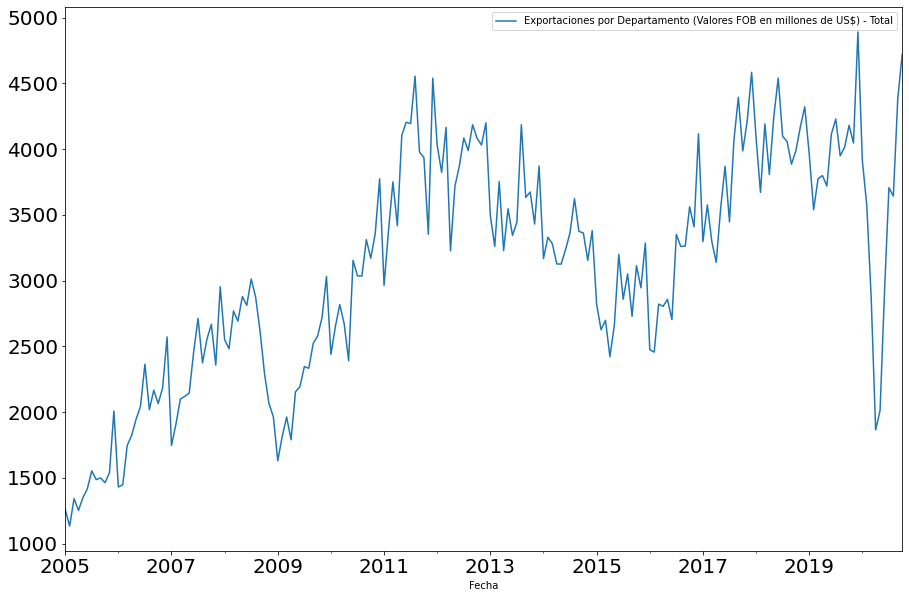

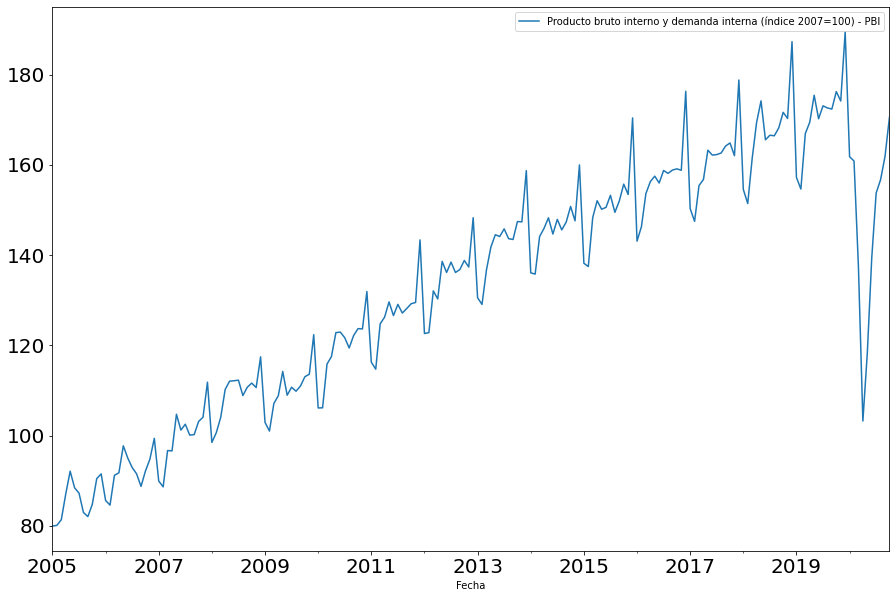

In [258]:
for i in range(2):
    dfmensual.iloc[:,[i]] = dfmensual.iloc[:,[i]].fillna(method='bfill')
    df_timeseriesdiaria = dfmensual.iloc[:,[i]] 
    fig = df_timeseriesdiaria.plot(figsize=(15, 10), fontsize=20, legend=dict_aux).get_figure()


# ARIMA

## ARIMA Forecast

A continuación empezamos con el modelo ARIMA. 

$ y_t^{d} = c + \phi_1 y_{t-1}^{d}+ \cdots + \phi_p y_{t-p}^{d} + \varepsilon_t+ \theta_1\varepsilon_{t-1} + \cdots + \theta_t \varepsilon_{t-q}$

donde $d$ es el número de veces que se sacan diferencias. El objetivo recordemos, es obtener el conjunto de parámetros $\{\{\phi_j\}_{j=1}^{p}, \{\theta_j\}_{j=1}^{q}, c\}$. Primero, se ejecuta la predicción para 2 meses a futuro usnado un loop sobre los parámetros. Dado que se observa una tendencia a la alza, se considera $d=1$. 

In [280]:
data_mensual_draft =   dfmensual.fillna(method='bfill')
data_mensual = dfmensual.fillna(method='ffill')

In [281]:
data_exportaciones   = data_mensual.iloc[:,[0]]
data_pbi =  data_mensual.iloc[:,[1]]

In [326]:
# Usando un modelo ARIMA con estacionalidad mensual, se presume de momento dada la forma de la data d=1, (P, S, Q, m)= (1, 1, 1, 12)
# especificar la variable a usar, se modifica el index, en este caso, exportaciones por dpto 

df_aux = data_exportaciones.reset_index()
df_aux = df_aux.drop(columns=['Fecha'])
df_    = df_aux.iloc[:,0].copy('deep')

# Definimos el tipo de estacionalidad (mensual : 12)
seasonal_order = (1, 1, 1, 12)

df_fct_exportaciones = pd.DataFrame()
# p entre 0 y 12 y q entre 0 y 7

for p in range(0,12,1):
    for q in range(0,7,1):
        
        arima_order = (p, 1, q)
        # define model
        model = SARIMAX(data_exportaciones, 
                        order=arima_order,
                        seasonal_order=seasonal_order)
        
        # fit model
        model_fit = model.fit()
        
            # Forecast de 2 meses tal y como se solicita
        yhat = model_fit.forecast(2)
        
        # Append
        
        df_0 = pd.concat([df_, yhat],ignore_index=True)
        df_fct_exportaciones = pd.concat([df_fct_exportaciones, df_0], axis=1)
        
        

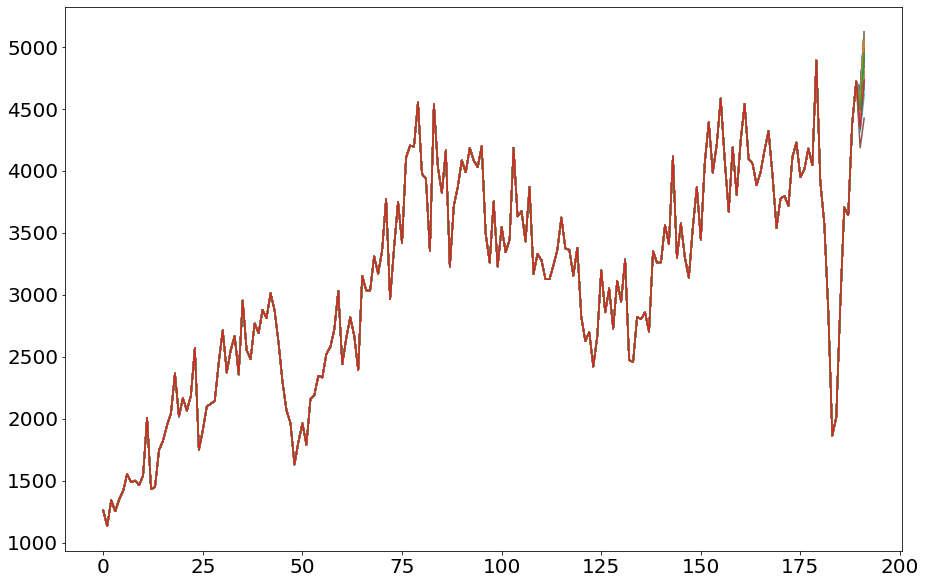

In [327]:
fig = df_fct_exportaciones.iloc[:,:].plot(figsize=(15, 10), fontsize=20, legend=False).get_figure()

In [ ]:
# Para el PBI

df_aux = data_pbi.reset_index()
df_aux = df_aux.drop(columns=['Fecha'])
df_    = df_aux.iloc[:,0].copy('deep')

# Definimos el tipo de estacionalidad (mensual)
seasonal_order = (1, 1, 1, 12)

df_fct_pbi = pd.DataFrame()
# p entre 0 y 12 y q entre 0 y 7

for p in range(0,12,1):
    for q in range(0,7,1):
        
        arima_order = (p, 1, q)
        # define model
        model = SARIMAX(data_pbi, 
                        order=arima_order,
                        seasonal_order=seasonal_order)
        
        # fit model
        model_fit = model.fit()
        
        # Forecast de 2 meses tal y como se solicita
        yhat = model_fit.forecast(2)
        
        # Append
        
        df_0 = pd.concat([df_, yhat],ignore_index=True)
        df_fct_pbi = pd.concat([df_fct_pbi, df_0], axis=1)

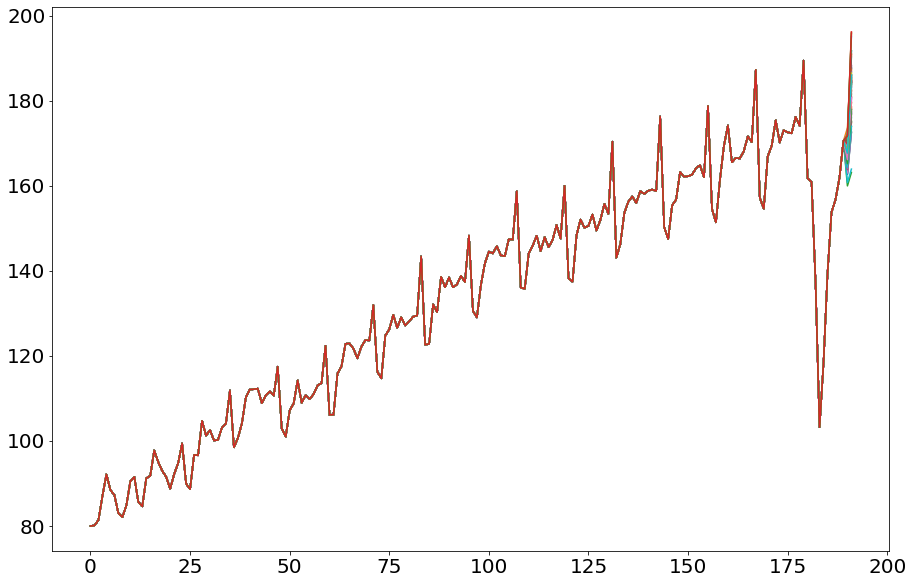

In [213]:
fig = df_fct_pbi .iloc[:,:].plot(figsize=(15, 10), fontsize=20, legend=False).get_figure()

## ARIMA Cross Validation
Ahora, vamos a realizar el Cross-Validation y computar el RMSE y MAPE para estas dos series de tiempo mensuales. Para el Cross-Validation se realiza lo siguiente (método más sencillo discutido en sesiones de teoría). Si $\{x_t\}_{t=t_0}^{T}$ es la data, se usa $\{x_t\}_{t=t_0}^{\lfloor 0.8T \rfloor}$ como data de entrenamiento y $\{x_t\}_{t=\lfloor 0.8T \rfloor+1}^{T}$ como data de prueba. Se compara entonces el RMSE

$$\sqrt{\frac{1}{k}\sum_{h=1}^{k}\varepsilon_{T+h}^2}$$

y MAPE 


  $$\frac{1}{|J|}\sum_{t\in J} \left |\frac{100 \varepsilon_t}{y_t} \right|= \frac{1}{|J|}\sum_{t\in J} \left |p_t\right|  , \ J \subset \mathbb{N}.$$

del error estimado relativo a $\{x_t\}_{t=\lfloor 0.8T \rfloor+1}^{T}$  y $\{\hat{x}_t\}_{t=\lfloor 0.8T \rfloor+1}^{T}$ .

In [220]:
# defino la funcion MAPE
def MAPE(y, yhat): 
    y, yhat = np.array(y), np.array(yhat)
    try:
        mape =  round(np.sum(np.abs(yhat - y)) / np.sum(y) * 100,2)
    except:
        print("Observed values are empty")
        mape = np.nan
    return mape

A continuación se obtienen los parámetros (modelo óptimo) según la minimización del RMSE/MAPE. No obstante, más adelante, usamos autoarima para obtener $\{p, d, q, P, D, Q, m\}$, variando sobre un conjunto mayor.

In [221]:
#Data de entrenamiento y de testeo Exportaciones por Departamento 

n = len(data_exportaciones)
display(n)
train_count = round(n * 0.8)
train, test = model_selection.train_test_split(data_exportaciones, train_size=train_count)

190

In [222]:
errorsrmse = []
errorsmape = []
models = []


##################


(1, 1, 1, 12)
for p in range(0,12,1):
    for q in range(0,7,1):
      
        arima_order = (p, 1, q)
        # define model
        model = SARIMAX(train, order=arima_order, seasonal_order=seasonal_order)
        
        model.initialize_approximate_diffuse()
        # fit model
        model_fit = model.fit()
        
        # Forecast
        yhat = model_fit.forecast(38)
         # Append
            
        rmse =  np.sqrt(mean_squared_error(test['Exportaciones por Departamento (Valores FOB en millones de US$) - Total'], yhat))
        mape =  MAPE(test['Exportaciones por Departamento (Valores FOB en millones de US$) - Total'], yhat)   
        
        # El modelo con parámetros p, q tiene puntuación
        print("Model p="  + str(p) + " and q = " + str(q) + "scores: ")
        print("RMSE")
        display(rmse)
        print("MAPE") 
        display(mape)
        

        errorsrmse.append(rmse)
        errorsmape.append(mape)
        models.append(model)
        
better_index = np.argmin(errorsrmse)  # type: int
better_index1 = np.argmin(errorsmape)  # type: int

print("MenorRMSE: {} (model {})".format(errorsrmse[better_index], better_index + 1))
print("MenorMAPE: {} (model {})".format(errorsmape[better_index], better_index + 1))
#con ctlf al valor numerico del RMSE y MAPE se obtiene el p, q respectivos
    

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=0 and q = 0scores: 
RMSE


624.4048687563951

MAPE


10.29

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=0 and q = 1scores: 
RMSE


606.6617302005712

MAPE


10.59

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=0 and q = 2scores: 
RMSE


607.133218140303

MAPE


10.83

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=0 and q = 3scores: 
RMSE


606.8608011760593

MAPE


10.96

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=0 and q = 4scores: 
RMSE


607.5198659450216

MAPE


10.95

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=0 and q = 5scores: 
RMSE


608.0948968869568

MAPE


11.5

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=0 and q = 6scores: 
RMSE


609.05195385594

MAPE


11.7

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=1 and q = 0scores: 
RMSE


608.8053097361372

MAPE


10.84

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=1 and q = 1scores: 
RMSE


608.1276024563089

MAPE


10.83

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=1 and q = 2scores: 
RMSE


607.6252731672964

MAPE


10.91

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=1 and q = 3scores: 
RMSE


606.8952812487438

MAPE


10.95

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=1 and q = 4scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


605.6490865536587

MAPE


10.99

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=1 and q = 5scores: 
RMSE


608.0282087679085

MAPE


11.48

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=1 and q = 6scores: 
RMSE


609.7567857868712

MAPE


11.76

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=2 and q = 0scores: 
RMSE


607.8721715075944

MAPE


10.85

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=2 and q = 1scores: 
RMSE


607.8175201912572

MAPE


10.88

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=2 and q = 2scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


633.5854339512045

MAPE


10.7

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=2 and q = 3scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


594.8126329744101

MAPE


12.58

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=2 and q = 4scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


606.055262289008

MAPE


10.9

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=2 and q = 5scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


607.382139809862

MAPE


10.5

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=2 and q = 6scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


609.5896029982857

MAPE


11.71

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=3 and q = 0scores: 
RMSE


607.5785837964956

MAPE


10.96

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=3 and q = 1scores: 
RMSE


607.5638987191519

MAPE


10.98

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=3 and q = 2scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


604.2398521783905

MAPE


10.85

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=3 and q = 3scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


601.91369677603

MAPE


11.57

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=3 and q = 4scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


615.6137891231139

MAPE


11.84

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=3 and q = 5scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


634.195024211049

MAPE


10.36

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=3 and q = 6scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


610.9101290484854

MAPE


10.73

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=4 and q = 0scores: 
RMSE


607.182959962143

MAPE


11.08

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=4 and q = 1scores: 
RMSE


607.1074785962657

MAPE


11.08

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=4 and q = 2scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


609.3342236363651

MAPE


10.33

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=4 and q = 3scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


651.8672840546463

MAPE


10.41

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=4 and q = 4scores: 
RMSE


611.1242381602641

MAPE


13.4

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=4 and q = 5scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


609.7024430801812

MAPE


11.38

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=4 and q = 6scores: 
RMSE


617.9521818518432

MAPE


11.42

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=5 and q = 0scores: 
RMSE


605.6974598431951

MAPE


11.04

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=5 and q = 1scores: 
RMSE


606.1781318134956

MAPE


10.96

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=5 and q = 2scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


634.5298776595042

MAPE


10.88

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=5 and q = 3scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


630.0626775389945

MAPE


10.87

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=5 and q = 4scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


614.7397411807295

MAPE


11.86

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=5 and q = 5scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


607.4425745662737

MAPE


11.57

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=5 and q = 6scores: 
RMSE


610.3663797065334

MAPE


11.9

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=6 and q = 0scores: 
RMSE


607.0503889011735

MAPE


11.11

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=6 and q = 1scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


607.2719484965356

MAPE


11.15

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=6 and q = 2scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


608.6537643228685

MAPE


10.41

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=6 and q = 3scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


622.6417888719784

MAPE


10.44

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=6 and q = 4scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


617.3690607046755

MAPE


10.67

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=6 and q = 5scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


607.9121853281567

MAPE


11.83

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=6 and q = 6scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


609.676495221214

MAPE


11.68

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=7 and q = 0scores: 
RMSE


606.4744412129465

MAPE


11.34

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=7 and q = 1scores: 
RMSE


606.3442324035803

MAPE


11.34

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=7 and q = 2scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


605.3116381227248

MAPE


11.23

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=7 and q = 3scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


604.8916645697589

MAPE


11.01

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=7 and q = 4scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


617.811608606039

MAPE


10.8

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=7 and q = 5scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


611.7970226150786

MAPE


12.13

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=7 and q = 6scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


656.4520790715793

MAPE


11.05

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=8 and q = 0scores: 
RMSE


606.0739200394748

MAPE


11.36

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=8 and q = 1scores: 
RMSE


606.0668229408898

MAPE


11.36

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=8 and q = 2scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


625.2036118435369

MAPE


11.17

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=8 and q = 3scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


609.368372386645

MAPE


11.3

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=8 and q = 4scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


610.1731834741054

MAPE


11.07

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=8 and q = 5scores: 
RMSE


609.2890744596006

MAPE


11.94

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=8 and q = 6scores: 
RMSE


558.0726367327107

MAPE


10.29

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=9 and q = 0scores: 
RMSE


606.1843208355331

MAPE


11.43

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=9 and q = 1scores: 
RMSE


606.03337823512

MAPE


11.36

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=9 and q = 2scores: 
RMSE


605.5640583391548

MAPE


10.53

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=9 and q = 3scores: 
RMSE


613.6669766336552

MAPE


11.34

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=9 and q = 4scores: 
RMSE


605.9998912689271

MAPE


11.22

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=9 and q = 5scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


607.2089239188498

MAPE


11.9

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=9 and q = 6scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


606.9500897156184

MAPE


11.76

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=10 and q = 0scores: 
RMSE


608.605286821975

MAPE


11.27

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=10 and q = 1scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


608.6824932903997

MAPE


11.31

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=10 and q = 2scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


655.9542436559004

MAPE


10.83

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=10 and q = 3scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


615.9453193161418

MAPE


10.54

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=10 and q = 4scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


610.2064286748367

MAPE


10.91

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=10 and q = 5scores: 
RMSE


608.2828338879832

MAPE


10.91

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=10 and q = 6scores: 
RMSE


647.4587062635894

MAPE


11.14

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=11 and q = 0scores: 
RMSE


610.2584982502706

MAPE


11.76

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=11 and q = 1scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


608.5761944601513

MAPE


11.31

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


Model p=11 and q = 2scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


609.0076612548553

MAPE


11.16

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=11 and q = 3scores: 
RMSE


610.3836815501002

MAPE


11.6

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=11 and q = 4scores: 
RMSE


628.0523355317065

MAPE


10.77

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=11 and q = 5scores: 
RMSE


608.7426422001921

MAPE


10.89

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=11 and q = 6scores: 
RMSE


613.737830866377

MAPE


10.66

MenorRMSE: 558.0726367327107 (model 63)
MenorMAPE: 10.29 (model 63)


In [253]:
# Analogamente para el PBI

n = len(dfmensual.iloc[:,[1]])
display(n)
train_count = round(n * 0.8)
#train = dfmensual.iloc[:,[0]].iloc[:train_count]
#test = dfmensual.iloc[:,[0]].iloc[train_count + 1:n]
train, test = model_selection.train_test_split(dfmensual.iloc[:,[1]], train_size=train_count)

##################

errorsrmse = []
errorsmape = []
models = []



##################


for p in range(0,12,1):
    for q in range(0,7,1):
      
        arima_order = (p, 1, q)
        # define model
        model = SARIMAX(train, order=arima_order, seasonal_order=seasonal_order)
        
        model.initialize_approximate_diffuse()
        # fit model
        model_fit = model.fit()
        
        # Forecast
        yhat = model_fit.forecast(38)
         # Append
            
        rmse =  np.sqrt(mean_squared_error(test['Producto bruto interno y demanda interna (índice 2007=100) - PBI'], yhat))
        mape =  MAPE(test['Producto bruto interno y demanda interna (índice 2007=100) - PBI'], yhat)   
        
        
        print("Model p="  + str(p) + " and q = " + str(q) + "scores: ")
        print("RMSE")
        display(rmse)
        print("MAPE") 
        display(mape)
        

        errorsrmse.append(rmse)
        errorsmape.append(mape)
        models.append(model)
    
better_index = np.argmin(errorsrmse)  # type: int
better_index1 = np.argmin(errorsmape)  # type: int

print("MenorRMSE: {} (model {})".format(errorsrmse[better_index], better_index + 1))
print("MenorMAPE: {} (model {})".format(errorsmape[better_index], better_index + 1))
#con ctlf al valor numerico del RMSE y MAPE se obtiene el p, q respectivos
  

190

Model p=0 and q = 0scores: 
RMSE


18.92133696958763

MAPE


5.61

Model p=0 and q = 1scores: 
RMSE


18.26029881037901

MAPE


5.19

Model p=0 and q = 2scores: 
RMSE


18.394402942788783

MAPE


5.26

Model p=0 and q = 3scores: 
RMSE


18.471234110848986

MAPE


5.31

Model p=0 and q = 4scores: 
RMSE


18.59801094820727

MAPE


5.39

Model p=0 and q = 5scores: 
RMSE


18.65114708184324

MAPE


5.42

Model p=0 and q = 6scores: 
RMSE


18.678973400678245

MAPE


5.45

Model p=1 and q = 0scores: 
RMSE


18.194562717409777

MAPE


5.18

Model p=1 and q = 1scores: 
RMSE


18.272947531500733

MAPE


5.2

Model p=1 and q = 2scores: 
RMSE


18.25071933014961

MAPE


5.19

Model p=1 and q = 3scores: 
RMSE


18.404225399088585

MAPE


5.27

Model p=1 and q = 4scores: 
RMSE


18.622363012061747

MAPE


5.41

Model p=1 and q = 5scores: 
RMSE


18.70775981092921

MAPE


5.46

Model p=1 and q = 6scores: 
RMSE


18.696359891692534

MAPE


5.45

Model p=2 and q = 0scores: 
RMSE


18.258869530372024

MAPE


5.2

Model p=2 and q = 1scores: 
RMSE


18.29016960249857

MAPE


5.2

Model p=2 and q = 2scores: 
RMSE


18.27315807491831

MAPE


5.2

Model p=2 and q = 3scores: 
RMSE


18.316156192188945

MAPE


5.22

Model p=2 and q = 4scores: 
RMSE


18.58973795003738

MAPE


5.39

Model p=2 and q = 5scores: 
RMSE


18.473008653114817

MAPE


5.32

Model p=2 and q = 6scores: 
RMSE


18.765258859060555

MAPE


5.5

Model p=3 and q = 0scores: 
RMSE


18.291104994408215

MAPE


5.21

Model p=3 and q = 1scores: 
RMSE


18.311221145431468

MAPE


5.21

Model p=3 and q = 2scores: 
RMSE


18.348737489698756

MAPE


5.23

Model p=3 and q = 3scores: 
RMSE


18.227243806876924

MAPE


5.19

Model p=3 and q = 4scores: 
RMSE


18.49595438142038

MAPE


5.33

Model p=3 and q = 5scores: 
RMSE


18.690932731113147

MAPE


5.45

Model p=3 and q = 6scores: 
RMSE


18.82043547654456

MAPE


5.54

Model p=4 and q = 0scores: 
RMSE


18.308862845518345

MAPE


5.22

Model p=4 and q = 1scores: 
RMSE


18.28809134407077

MAPE


5.21

Model p=4 and q = 2scores: 
RMSE


18.29097410568949

MAPE


5.21

Model p=4 and q = 3scores: 
RMSE


18.796224355254022

MAPE


5.53

Model p=4 and q = 4scores: 
RMSE


18.65019491639781

MAPE


5.44

Model p=4 and q = 5scores: 
RMSE


18.803550602728684

MAPE


5.54

Model p=4 and q = 6scores: 
RMSE


18.904300308480096

MAPE


5.6

Model p=5 and q = 0scores: 
RMSE


18.2604577369281

MAPE


5.19

Model p=5 and q = 1scores: 
RMSE


18.27892897926314

MAPE


5.2

Model p=5 and q = 2scores: 
RMSE


18.299044679727846

MAPE


5.21

Model p=5 and q = 3scores: 
RMSE


18.506702201983394

MAPE


5.33

Model p=5 and q = 4scores: 
RMSE


18.68332389554235

MAPE


5.45

Model p=5 and q = 5scores: 
RMSE


18.62888943763292

MAPE


5.41

Model p=5 and q = 6scores: 
RMSE


18.8700239096559

MAPE


5.55

Model p=6 and q = 0scores: 
RMSE


18.393665650268062

MAPE


5.26

Model p=6 and q = 1scores: 
RMSE


18.468299893751237

MAPE


5.31

Model p=6 and q = 2scores: 
RMSE


18.471412961552396

MAPE


5.31

Model p=6 and q = 3scores: 
RMSE


18.757987905586802

MAPE


5.5

Model p=6 and q = 4scores: 
RMSE


18.539438426385004

MAPE


5.36

Model p=6 and q = 5scores: 
RMSE


18.588755938392165

MAPE


5.38

Model p=6 and q = 6scores: 
RMSE


18.618362659400248

MAPE


5.41

Model p=7 and q = 0scores: 
RMSE


18.64931053632285

MAPE


5.42

Model p=7 and q = 1scores: 
RMSE


18.619939042705244

MAPE


5.4

Model p=7 and q = 2scores: 
RMSE


18.545355577137883

MAPE


5.35

Model p=7 and q = 3scores: 
RMSE


18.685310406239175

MAPE


5.45

Model p=7 and q = 4scores: 
RMSE


18.633670704163084

MAPE


5.41

Model p=7 and q = 5scores: 
RMSE


18.716465418628417

MAPE


5.47

Model p=7 and q = 6scores: 
RMSE


17.938476156783555

MAPE


5.09

Model p=8 and q = 0scores: 
RMSE


18.692043116938837

MAPE


5.44

Model p=8 and q = 1scores: 
RMSE


18.626095465873018

MAPE


5.4

Model p=8 and q = 2scores: 
RMSE


18.662505813694708

MAPE


5.43

Model p=8 and q = 3scores: 
RMSE


18.6887045243823

MAPE


5.44

Model p=8 and q = 4scores: 
RMSE


18.70435883308949

MAPE


5.46

Model p=8 and q = 5scores: 
RMSE


18.644712484894363

MAPE


5.42

Model p=8 and q = 6scores: 
RMSE


18.716637266144076

MAPE


5.48

Model p=9 and q = 0scores: 
RMSE


18.849399830464495

MAPE


5.57

Model p=9 and q = 1scores: 
RMSE


18.82624486384347

MAPE


5.55

Model p=9 and q = 2scores: 
RMSE


18.869843684251563

MAPE


5.6

Model p=9 and q = 3scores: 
RMSE


18.855873035176902

MAPE


5.59

Model p=9 and q = 4scores: 
RMSE


18.47233301711458

MAPE


5.33

Model p=9 and q = 5scores: 
RMSE


18.841963535188587

MAPE


5.58

Model p=9 and q = 6scores: 
RMSE


18.767599046868252

MAPE


5.52

Model p=10 and q = 0scores: 
RMSE


18.845517614040777

MAPE


5.54

Model p=10 and q = 1scores: 
RMSE


18.622079365010904

MAPE


5.4

Model p=10 and q = 2scores: 
RMSE


18.281559803336986

MAPE


5.21

Model p=10 and q = 3scores: 
RMSE


19.05436707620733

MAPE


5.71

Model p=10 and q = 4scores: 
RMSE


18.496583768883653

MAPE


5.32

Model p=10 and q = 5scores: 
RMSE


20.175405946185265

MAPE


6.58

Model p=10 and q = 6scores: 
RMSE


20.415799663593642

MAPE


6.79

Model p=11 and q = 0scores: 
RMSE


18.53498368310551

MAPE


5.36

Model p=11 and q = 1scores: 
RMSE


18.49644935410786

MAPE


5.33

Model p=11 and q = 2scores: 
RMSE


18.425744726366524

MAPE


5.27

Model p=11 and q = 3scores: 
RMSE


18.71197671429445

MAPE


5.51

Model p=11 and q = 4scores: 
RMSE


18.631503621137423

MAPE


5.46

Model p=11 and q = 5scores: 
RMSE


18.921258731074037

MAPE


5.62

Model p=11 and q = 6scores: 
RMSE


18.854139139357283

MAPE


5.59

MenorRMSE: 17.938476156783555 (model 56)
MenorMAPE: 5.09 (model 56)


Concluimos que el mejor fit (entre los probados, teniendo en cuenta que en todo momento $d=1$) en relación al $\textbf{RMSE}$, para las Exportaciones por Departamento $\{y_t\}$ es 

$$y_t^{1} = c+\sum_{j=1}^{p=8} \phi_{j}y_{t-j}^{1} + \sum_{j=1}^{q=6} \theta_{j}\varepsilon_{t-j},$$ 

mientras que, para el PBI  $\{z_t\}$, es 

$$z_t^{1} = c+\sum_{j=1}^{p=7} \phi_{j}z_{t-j}^{1} + \sum_{j=1}^{q=6} \theta_{j}\varepsilon_{t-j}.$$

In [223]:
autoarima = pmd.auto_arima(
        y = data_exportaciones,
        start_p=1,
        start_q=0,
        seasonal=True,
        max_p=12,
        max_d=1,
        max_q=6,
        max_P=12,
        max_D=1,
        max_Q=6,
        m=4,
        n_jobs=-1,
        suppress_warnings=True,
        )

display(autoarima.order)
display(autoarima.seasonal_order)

(0, 1, 1)

(2, 0, 2, 4)

In [224]:
# Finding the best SARIMA model
autoarima = pmd.auto_arima(
        y =  data_pbi,
        start_p=1,
        start_q=0,
        seasonal=True,
        max_p=12,
        max_d=1,
        max_q=6,
        max_P=12,
        max_D=1,
        max_Q=6,
        m=4,
        n_jobs=-1,
        suppress_warnings=True,
        )

display(autoarima.order)
display(autoarima.seasonal_order)

(2, 1, 1)

(3, 0, 3, 4)

Los resultados entre AUTOARIMA y Cross Validation difieren por lo siguiente: 
    
    - cuando se realizó el CV, se optimizó sobre el RMSE y el MAPE
    - el autorarima optimiza según el AIC
    - cuando se realizó el CV, no se hizo variar los parámetros 

$$(P, D, Q, m)$$

Por ende, vamos a usar para la pregunta 3: 
    
    - Exportaciones: (0, 1, 1) (2, 0, 2, 4)
    - PBI: (2, 1, 1)(3, 0, 3, 4)
    

# ETS: Exponential Smoothing 

Empecemos con el ETS(A, N, N) simple. La predicción de este modelo funciona de la siguiente manera: $\hat{y}_{T+1|T} = \alpha y_T + \alpha (1-\alpha)y_{T-1} + \alpha (1-\alpha)^2y_{T-2} + ... \ \alpha \in (0, 1)$. El parámetro $\alpha$ es el parámetro de suavizamiento. De forma recursiva, este forecat se puede definir de manera análoga como sigue: $\hat{y}_{T+1|T} = \alpha y_T + (1-\alpha)\hat{y}_{T|T-1}.$ Estos modelos en general consisten en suavizar la data, disminuyendo el peso de observaciones "muy" anteriores.

## Exportaciones por departamento forecast


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


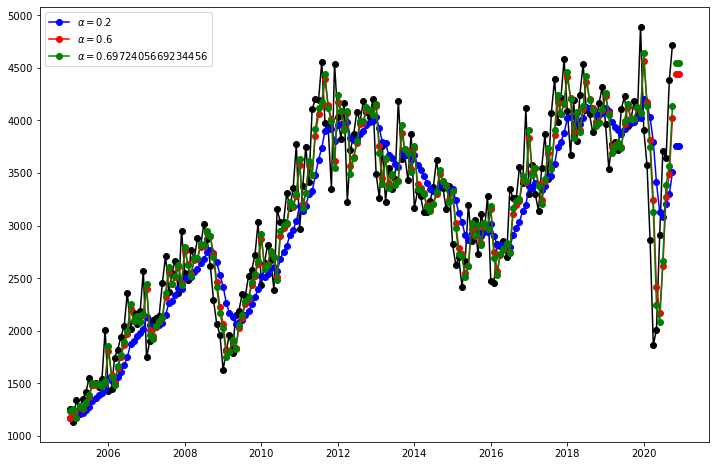

In [226]:
# Empecemos con las exportaciones: dfmensual.iloc[:,[0]]
exportaciones_mensuales = dfmensual.iloc[:,[0]]

fit1 = SimpleExpSmoothing(exportaciones_mensuales, initialization_method="heuristic").fit(
    smoothing_level=0.2, optimized=False
)
# 2 meses prediccion
fcast1 = fit1.forecast(2).rename(r"$\alpha=0.2$")
fit2 = SimpleExpSmoothing(exportaciones_mensuales, initialization_method="heuristic").fit(
    smoothing_level=0.6, optimized=False
)
fcast2 = fit2.forecast(2).rename(r"$\alpha=0.6$")
fit3 = SimpleExpSmoothing(exportaciones_mensuales, initialization_method="estimated").fit()
fcast3 = fit3.forecast(2).rename(r"$\alpha=%s$" % fit3.model.params["smoothing_level"])

plt.figure(figsize=(12, 8))
plt.plot(exportaciones_mensuales, marker="o", color="black")
plt.plot(fit1.fittedvalues, marker="o", color="blue")
(line1,) = plt.plot(fcast1, marker="o", color="blue")
plt.plot(fit2.fittedvalues, marker="o", color="red")
(line2,) = plt.plot(fcast2, marker="o", color="red")
plt.plot(fit3.fittedvalues, marker="o", color="green")
(line3,) = plt.plot(fcast3, marker="o", color="green")
plt.legend([line1, line2, line3], [fcast1.name, fcast2.name, fcast3.name])


La optimización conduce a $\hat{\alpha}\simeq 0.7$. Dado que la serie de tiempo de las exportaciones podría (parece que en efecto lo hace) poseer una tendencia lineal, se trabaja ahora con el método de la tendencia lineal de Holt ETS(A, A, N) 

$\hat{y}_{t+h|t}  = \ell_t + hb_t$

$\ell_t  = \alpha y_t + (1-\alpha)(\ell_{t-1} + b_{t-1})$

$b_t  = \beta^{*}(\ell_t-\ell_{t-1})+ (1-\beta^{*})b_{t-1}.$ 

y el amortiguado 

$\hat{y}_{t+h|t}  = \ell_t + (\phi+\phi^2+ \cdots + \phi^h)b_t$
  
$\ell_t  = \alpha y_t + (1-\alpha)(\ell_{t-1} + \phi b_{t-1})$
  
$b_t  = \beta^{*}(\ell_t-\ell_{t-1})+ (1-\beta^{*})\phi b_{t-1}.$

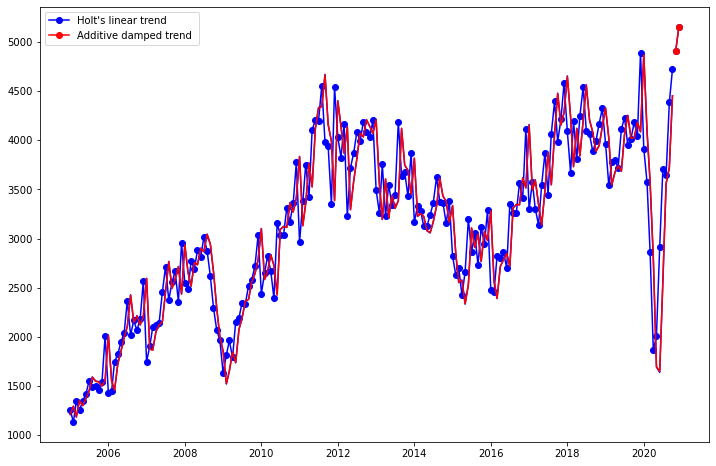

In [274]:
# recordemos que son 2 meses de prediccion a futuro

exportaciones_mensuales = dfmensual.iloc[:,[0]]

fit1 = Holt(exportaciones_mensuales, initialization_method="estimated").fit(
    smoothing_level=0.8, smoothing_trend=0.2, optimized=False
)
fcast1 = fit1.forecast(2).rename("Holt's linear trend ")

# se optimiza en phi fijando alpha y beta

fit2 = Holt(exportaciones_mensuales, damped_trend=True, initialization_method="estimated").fit(
    smoothing_level=0.8, smoothing_trend=0.2
)
fcast2 = fit2.forecast(2).rename("Additive damped trend ")



plt.figure(figsize=(12, 8))
plt.plot(exportaciones_mensuales, marker="o", color="blue")
plt.plot(fit1.fittedvalues, color="blue")
(line1,) = plt.plot(fcast1, marker="o", color="blue")
plt.plot(fit2.fittedvalues, color="red")
(line2,) = plt.plot(fcast2, marker="o", color="red")

plt.legend([line1, line2], [fcast1.name, fcast2.name])

Bonus: comparacion de varios modelos, escogiendo algunos parametros (libre de modificarse el set $\{\alpha, \beta, \phi, b_0, \ell_0\}$).

In [281]:
# los 3 modelos para comparar
fit1 = SimpleExpSmoothing(exportaciones_mensuales , initialization_method="estimated").fit()
fit2 = Holt(exportaciones_mensuales , initialization_method="estimated").fit()
fit3 = Holt(exportaciones_mensuales , damped_trend=True, initialization_method="estimated").fit(
    damping_trend=0.98
)
fit4 = Holt(
   exportaciones_mensuales , exponential=True, damped_trend=True, initialization_method="estimated"
).fit()

params = [
    "smoothing_level",
    "smoothing_trend",
    "damping_trend",
    "initial_level",
    "initial_trend",
]

results = pd.DataFrame(
    index=[r"$\alpha$", r"$\beta$", r"$\phi$", r"$l_0$", "$b_0$", "SSE"],
    columns=["ETS", "Holt's", "Additive", "Multiplicative"],
)
results["ETS"] = [fit1.params[p] for p in params] + [fit1.sse]
results["Holt's"] = [fit2.params[p] for p in params] + [fit2.sse]
results["Additive"] = [fit3.params[p] for p in params] + [fit3.sse]
results["Multiplicative"] = [fit4.params[p] for p in params] + [fit4.sse]
results

,ETS,Holt's,Additive,Multiplicative
$\alpha$,6.972406e-01,6.916139e-01,6.885714e-01,7.121429e-01
$\beta$,NaN,9.482780e-05,1.000000e-04,1.000000e-04
$\phi$,NaN,NaN,9.800000e-01,9.900000e-01
$l_0$,1.239768e+03,1.213998e+03,1.173387e+03,1.173387e+03
$b_0$,NaN,1.779861e+01,3.688043e+01,1.041527e+00
SSE,2.433214e+07,2.421429e+07,2.421675e+07,2.464760e+07


## ETS Cross Validation Exportaciones por departamento

A continuación realizamos diversas simulaciones (sobre los parámetros e incluso formas funcionales) para encontrar la que reduce el MAPE y/o el RMSE, usando simple cross-validation (primeros 4/5 de la data train y el restante train).

In [282]:
display(exportaciones_mensuales)

,Exportaciones por Departamento (Valores FOB en millones de US$) - Total
Fecha,
2005-01-01,1260.352460
2005-02-01,1133.709115
2005-03-01,1343.020060
2005-04-01,1253.014325
2005-05-01,1349.999845
...,...
2020-06-01,2910.042383
2020-07-01,3706.534050
2020-08-01,3643.429016


In [289]:
n = len(exportaciones_mensuales)
train_count = round(n * 0.75)
train = exportaciones_mensuales.iloc[:train_count]
test = exportaciones_mensuales.iloc[train_count + 1:n]

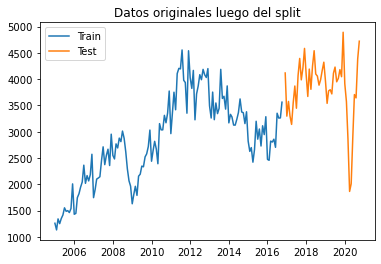

In [290]:
#fig = plt.figure()
plt.plot(train.index, train['Exportaciones por Departamento (Valores FOB en millones de US$) - Total'], label='Train')
plt.plot(test.index, test['Exportaciones por Departamento (Valores FOB en millones de US$) - Total'], label='Test')
# Grafico la parte de entrenamiento y la de test
plt.legend(loc = 'best')
plt.title('Datos originales luego del split')
plt.show()

For alpha = 0.10,  RMSE is 971.8050 MAPE is 23.18


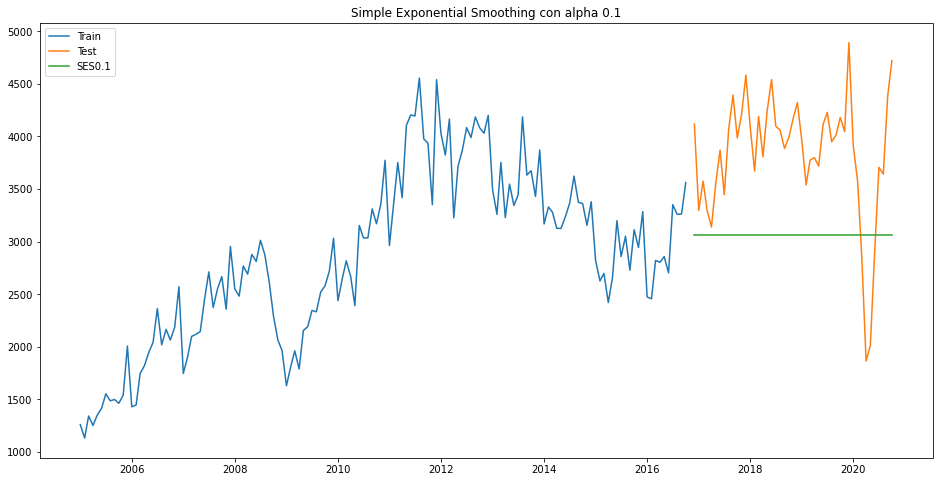

For alpha = 0.20,  RMSE is 906.9971 MAPE is 21.40


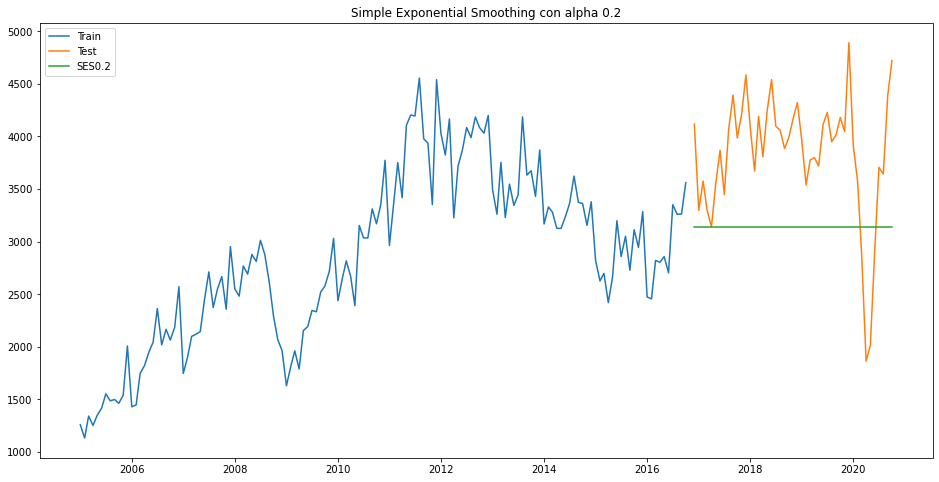

For alpha = 0.30,  RMSE is 830.7441 MAPE is 19.29


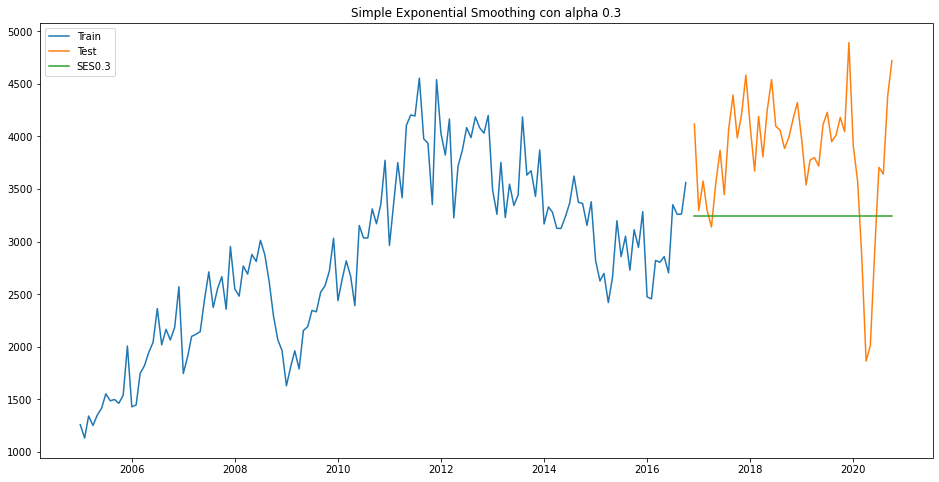

For alpha = 0.40,  RMSE is 774.7342 MAPE is 17.69


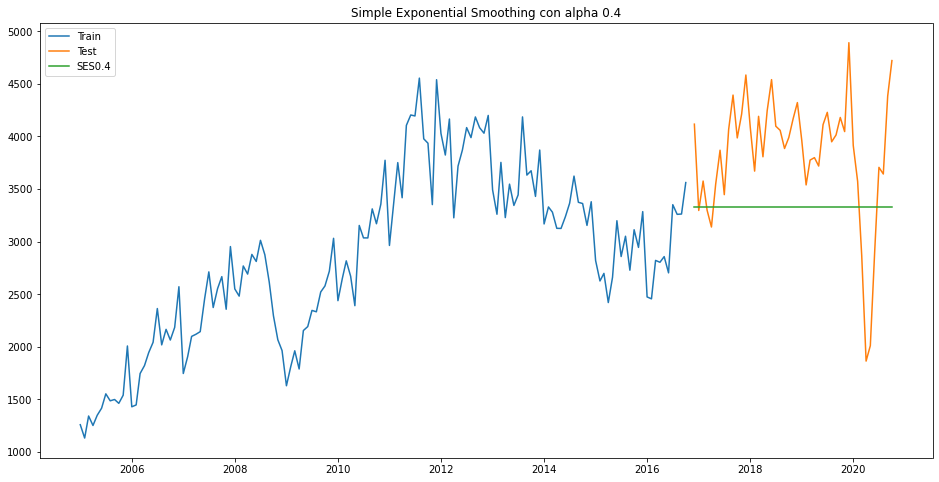

For alpha = 0.50,  RMSE is 735.7141 MAPE is 16.57


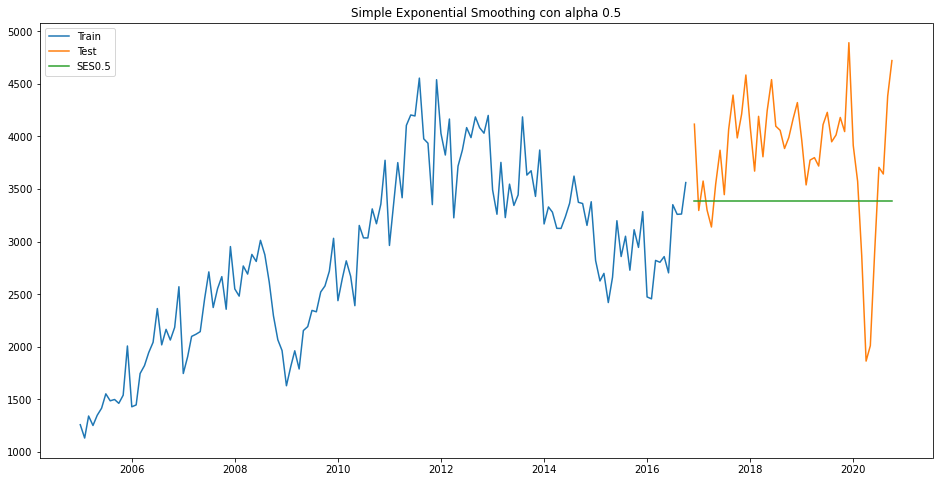

For alpha = 0.60,  RMSE is 708.1396 MAPE is 15.73


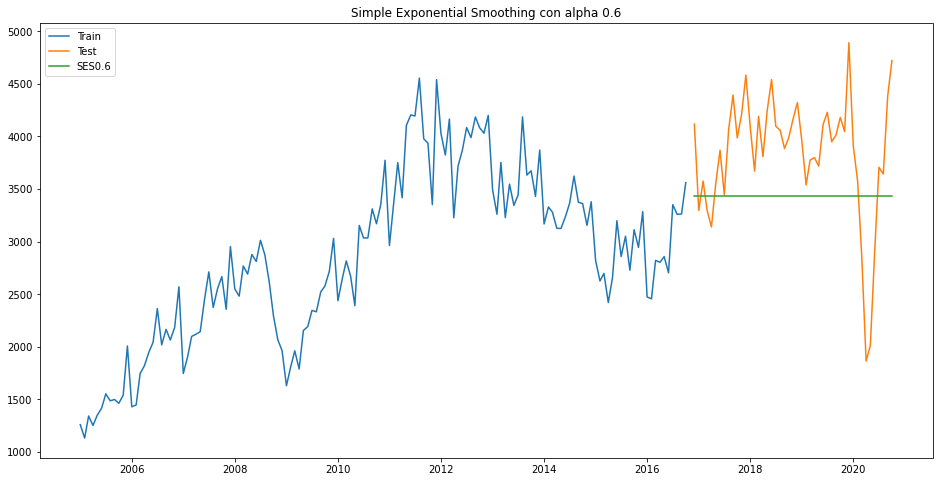

For alpha = 0.70,  RMSE is 687.4953 MAPE is 15.07


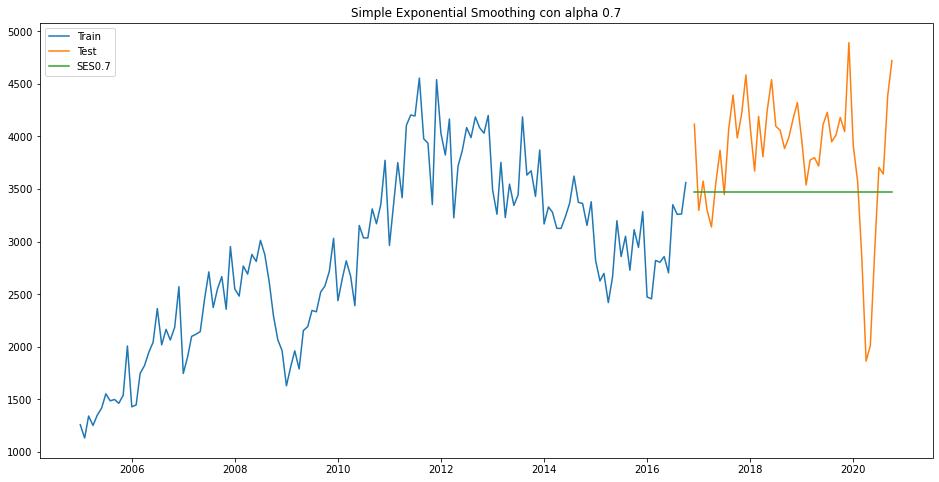

For alpha = 0.80,  RMSE is 670.7303 MAPE is 14.52


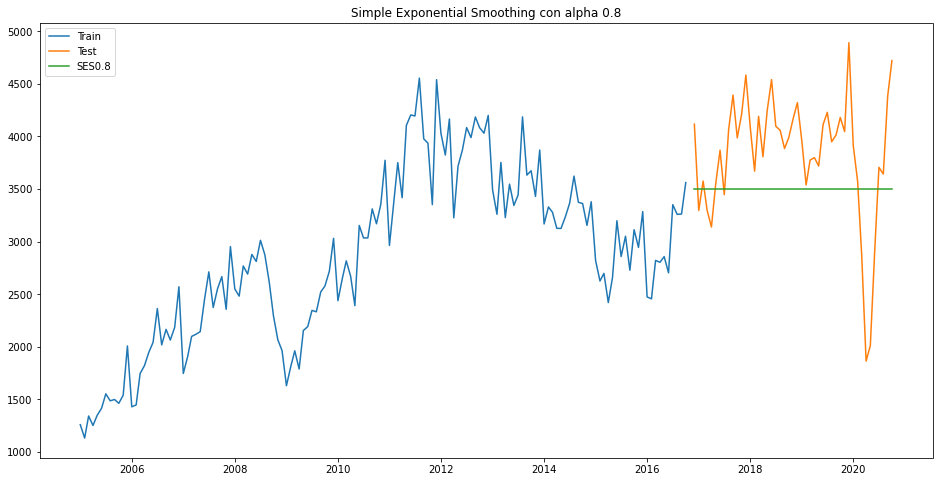

For alpha = 0.90,  RMSE is 656.0412 MAPE is 14.00


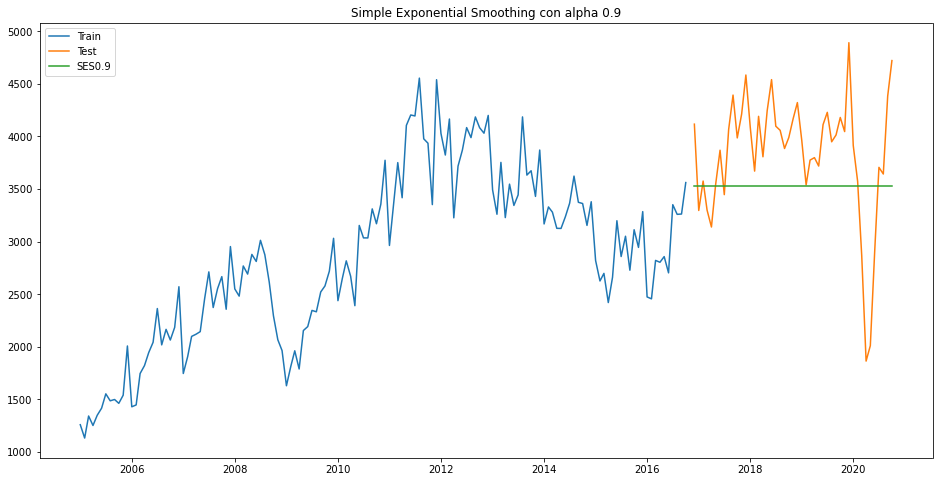

In [291]:
model = SimpleExpSmoothing(np.asarray(train['Exportaciones por Departamento (Valores FOB en millones de US$) - Total']))

alpha_list = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
#SES=ETS simple
pred_SES = test.copy()
for alpha_value in alpha_list:

    alpha_str =  "SES" + str(alpha_value)
    mode_fit_i  =  model.fit(smoothing_level = alpha_value, optimized=False)
    pred_SES[alpha_str]  =  mode_fit_i.forecast(len(test['Exportaciones por Departamento (Valores FOB en millones de US$) - Total']))
    rmse =  np.sqrt(mean_squared_error(test['Exportaciones por Departamento (Valores FOB en millones de US$) - Total'], pred_SES[alpha_str]))
    mape =  MAPE(test['Exportaciones por Departamento (Valores FOB en millones de US$) - Total'],pred_SES[alpha_str])
    
    print("For alpha = %1.2f,  RMSE is %3.4f MAPE is %3.2f" %(alpha_value, rmse, mape))
    plt.figure(figsize=(16,8))
    plt.plot(train.index, train['Exportaciones por Departamento (Valores FOB en millones de US$) - Total'], label ='Train')
    plt.plot(test.index, test['Exportaciones por Departamento (Valores FOB en millones de US$) - Total'], label  ='Test')
    plt.plot(test.index, pred_SES[alpha_str], label  = alpha_str)
    plt.title('Simple Exponential Smoothing con alpha ' + str(alpha_value))
    plt.legend(loc='best') 
    plt.show()



C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)



== Simple Exponential Smoothing 


Smoothing Level 0.5345
Initial Level 1260.3525

For alpha = 0.53,  RMSE is 725.1573 MAPE is 16.26


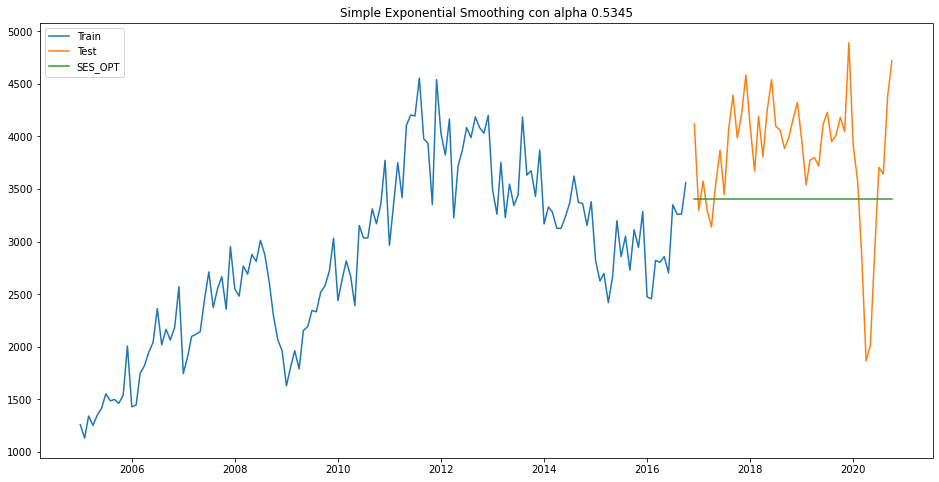

        2016-11-01   2016-12-01   2017-01-01   2017-02-01   2017-03-01
Y_hat  3403.492410  3403.492410  3403.492410  3403.492410  3403.492410
Y      4117.222385  3296.827026  3576.413941  3300.159278  3139.652786


In [292]:
pred_opt   =  SimpleExpSmoothing(train['Exportaciones por Departamento (Valores FOB en millones de US$) - Total']).fit(optimized = True)

# si se cambia test por train se obtiene 0.99 que es el valor que empiricamente se muestra es mejor 

print('')
print('== Simple Exponential Smoothing ')
print('')

print('')
print('Smoothing Level', np.round(pred_opt.params['smoothing_level'], 4))
print('Initial Level',   np.round(pred_opt.params['initial_level'], 4))
print('')

#len(test)=47 
y_pred_opt           = pred_opt.forecast(steps = 47)
df_pred_opt          = pd.DataFrame({'Y_hat':y_pred_opt,'Y':test['Exportaciones por Departamento (Valores FOB en millones de US$) - Total'].values})

rmse_opt             =  np.sqrt(mean_squared_error(test['Exportaciones por Departamento (Valores FOB en millones de US$) - Total'], y_pred_opt))
mape_opt             =  MAPE(test['Exportaciones por Departamento (Valores FOB en millones de US$) - Total'], y_pred_opt)

alpha_value          = np.round(pred_opt.params['smoothing_level'], 4)

print("For alpha = %1.2f,  RMSE is %3.4f MAPE is %3.2f" %(alpha_value, rmse_opt, mape_opt))
plt.figure(figsize=(16,8))
plt.plot(train.index, train['Exportaciones por Departamento (Valores FOB en millones de US$) - Total'], label = 'Train')
plt.plot(test.index, test['Exportaciones por Departamento (Valores FOB en millones de US$) - Total'],  label = 'Test')
plt.plot(test.index, y_pred_opt,           label = 'SES_OPT')
plt.title('Simple Exponential Smoothing con alpha ' + str(alpha_value))
plt.legend(loc='best') 
plt.show()

print(df_pred_opt.head().T)

Es posible identificar una diferencia entre $\hat{\alpha}_{test}$ y $\hat{\alpha}_{train}$. En efecto, la predicción del  $\alpha$ óptimo se ejecuta usando la data train mientras que su performance es evaluado en el data test. Viendo las figuras es posible percibir que existe una tendencia (creciente), lo cual distorsiona el resultado y causa la diferencia. Es por ello, que utilizamos ahora el modelo Holt: ETS(A, A, N).


==Holt model Exponential Smoothing Parameters ==

Smoothing Level 0.5805
Smoothing Trend 0.0841
Initial Level 1260.1588



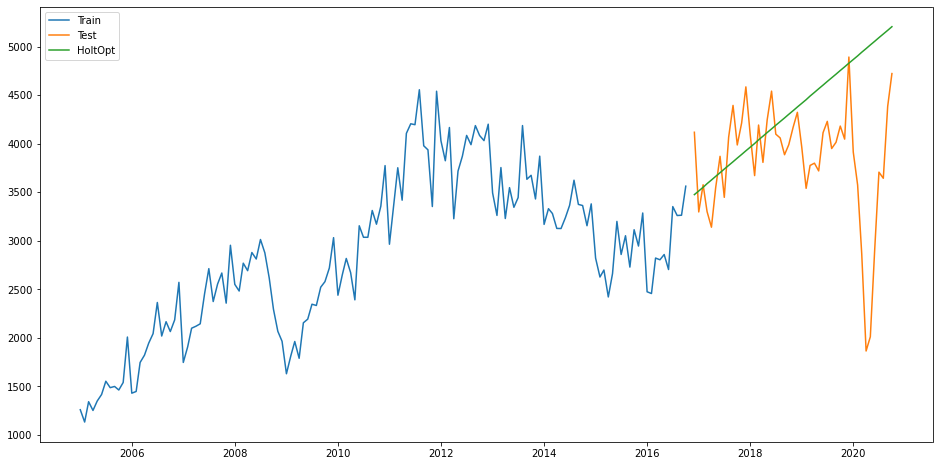

In [280]:
model_fit = Holt(np.asarray(train['Exportaciones por Departamento (Valores FOB en millones de US$) - Total'])).fit()

#model_fit = model.fit()

print('')
print('==Holt model Exponential Smoothing Parameters ==')
print('')
alpha_value = np.round(model_fit.params['smoothing_level'], 4)
print('Smoothing Level', alpha_value )
beta_value= np.round(model_fit.params['smoothing_trend'], 4)
print('Smoothing Trend', beta_value)
print('Initial Level',   np.round(model_fit.params['initial_level'], 4))
print('')



Pred_Holt = test.copy()

Pred_Holt['Opt'] = model_fit.forecast(len(test['Exportaciones por Departamento (Valores FOB en millones de US$) - Total']))
plt.figure(figsize=(16,8))
plt.plot(train['Exportaciones por Departamento (Valores FOB en millones de US$) - Total'], label='Train')
plt.plot(test['Exportaciones por Departamento (Valores FOB en millones de US$) - Total'], label='Test')
plt.plot(Pred_Holt['Opt'], label='HoltOpt')
plt.legend(loc='best')
plt.show()


==Holt model Exponential Smoothing Parameters ==

Smoothing Level 0.5805
Smoothing Trend 0.0841
Initial Level 1260.1588



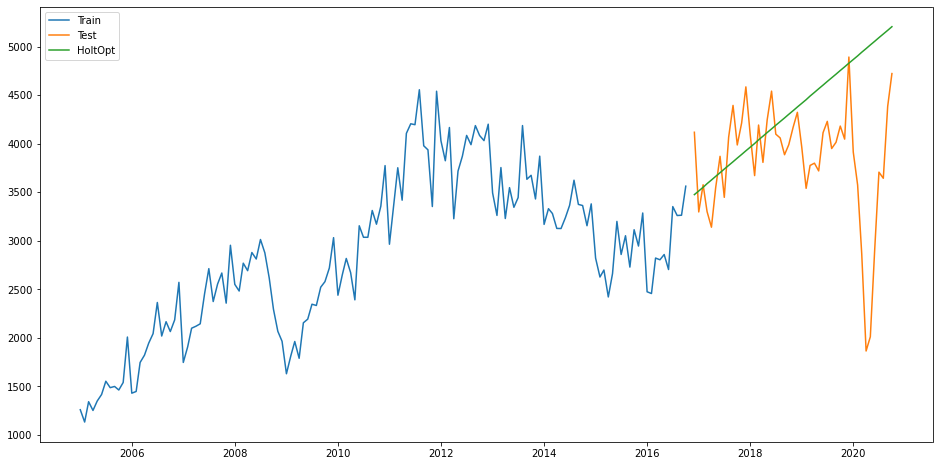

For alpha = 0.58,  RMSE is 955.9974 MAPE is 17.13
{'smoothing_level': 0.5804973226511355, 'smoothing_trend': 0.08413755303405185, 'smoothing_seasonal': nan, 'damping_trend': nan, 'initial_level': 1260.15875304634, 'initial_trend': 34.1280943613846, 'initial_seasons': array([], dtype=float64), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


In [267]:
model_fit = Holt(np.asarray(train['Exportaciones por Departamento (Valores FOB en millones de US$) - Total'])).fit()

#model_fit = model.fit()

print('')
print('==Holt model Exponential Smoothing Parameters ==')
print('')
alpha_value = np.round(model_fit.params['smoothing_level'], 4)
print('Smoothing Level', alpha_value )
beta_value= np.round(model_fit.params['smoothing_trend'], 4)
print('Smoothing Trend', beta_value)
print('Initial Level',   np.round(model_fit.params['initial_level'], 4))
print('')



Pred_Holt = test.copy()

Pred_Holt['Opt'] = model_fit.forecast(len(test['Exportaciones por Departamento (Valores FOB en millones de US$) - Total']))
plt.figure(figsize=(16,8))
plt.plot(train['Exportaciones por Departamento (Valores FOB en millones de US$) - Total'], label='Train')
plt.plot(test['Exportaciones por Departamento (Valores FOB en millones de US$) - Total'], label='Test')
plt.plot(Pred_Holt['Opt'], label='HoltOpt')
plt.legend(loc='best')
plt.show()


df_pred_opt =  pd.DataFrame({'Y_hat':Pred_Holt['Opt'] ,'Y':test['Exportaciones por Departamento (Valores FOB en millones de US$) - Total'].values})
rmse_opt =  np.sqrt(mean_squared_error(df_pred_opt.Y, df_pred_opt.Y_hat))
mape_opt =  MAPE(df_pred_opt.Y, df_pred_opt.Y_hat)

print("For alpha = %1.2f,  RMSE is %3.4f MAPE is %3.2f" %(alpha_value, rmse_opt, mape_opt))

print(model_fit.params)

Conclusiones (ETS time series con frecuencia mensuales): se han analizado dos modelos esencialmente, el exponential smoothing simple y el de tendencia lineal Holt. Según las métricas: RMSE y MAPE, se obtiene, luego de estimar usando la data set y comparar usando el training set, los parámetros $\hat{\alpha}$ y $\hat{\beta}$. Los resultados señalan que el modelo ETS simple tiene menor MAPE y RMSE para el $\hat{\alpha}$ obtenido luego de la optimización. Este resultado puede parecer irreal dado que, si se observan en las gráficas, el método de Holt (linear trend), parece ser más preciso. No obstante, se observa que en el 2020 $t^{*}$ (muy posiblemente debido a la crisis sanitaria), las exportaciones por departamente caen abrutmanete (outlier). Dado que el método de Holt realiza estimaciones "a la alza", cuando se computan las medidas de desviación, RMSE o MAPE, la diferencia es muy grande para ese $t^{*}$, y el RMSE o MAPE resultan siendo mayores al final (comprando con el ETS simple que provee valores constantes menores).

## PBI forecast ETS

In [302]:
# Forecast PBI

display(pbi)

# Empecemos con las exportaciones: dfmensual.iloc[:,[0]]
pbi = dfmensual.iloc[:,[1]]

fit1 = SimpleExpSmoothing(exportaciones_mensuales, initialization_method="heuristic").fit(
    smoothing_level=0.2, optimized=False
)
# 2 meses prediccion
fcast1 = fit1.forecast(2).rename(r"$\alpha=0.2$")
fit2 = SimpleExpSmoothing(exportaciones_mensuales, initialization_method="heuristic").fit(
    smoothing_level=0.6, optimized=False
)
fcast2 = fit2.forecast(2).rename(r"$\alpha=0.6$")
fit3 = SimpleExpSmoothing(exportaciones_mensuales, initialization_method="estimated").fit()
fcast3 = fit3.forecast(2).rename(r"$\alpha=%s$" % fit3.model.params["smoothing_level"])

plt.figure(figsize=(12, 8))
plt.plot(exportaciones_mensuales, marker="o", color="black")
plt.plot(fit1.fittedvalues, marker="o", color="blue")
(line1,) = plt.plot(fcast1, marker="o", color="blue")
plt.plot(fit2.fittedvalues, marker="o", color="red")
(line2,) = plt.plot(fcast2, marker="o", color="red")
plt.plot(fit3.fittedvalues, marker="o", color="green")
(line3,) = plt.plot(fcast3, marker="o", color="green")
plt.legend([line1, line2, line3], [fcast1.name, fcast2.name, fcast3.name])

,Producto bruto interno y demanda interna (índice 2007=100) - PBI
Fecha,
2005-01-01,79.979161
2005-02-01,80.134460
2005-03-01,81.396413
2005-04-01,87.073447
2005-05-01,92.141455
...,...
2020-06-01,139.338017
2020-07-01,153.762995
2020-08-01,156.724587


IndexError: positional indexers are out-of-bounds

## PBI Cross Validation

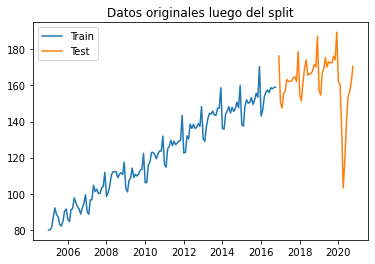

In [304]:
n = len(pbi)
train_count = round(n * 0.75)
train = pbi.iloc[:train_count]
test = pbi.iloc[train_count + 1:n]


#fig = plt.figure()
plt.plot(train.index, train['Producto bruto interno y demanda interna (índice 2007=100) - PBI'], label='Train')
plt.plot(test.index, test['Producto bruto interno y demanda interna (índice 2007=100) - PBI'], label='Test')
# Grafico la parte de entrenamiento y la de test
plt.legend(loc = 'best')
plt.title('Datos originales luego del split')
plt.show()

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)



== Simple Exponential Smoothing 


Smoothing Level 0.3338
Initial Level 82.6063

For alpha = 0.33,  RMSE is 15.6560 MAPE is 7.24


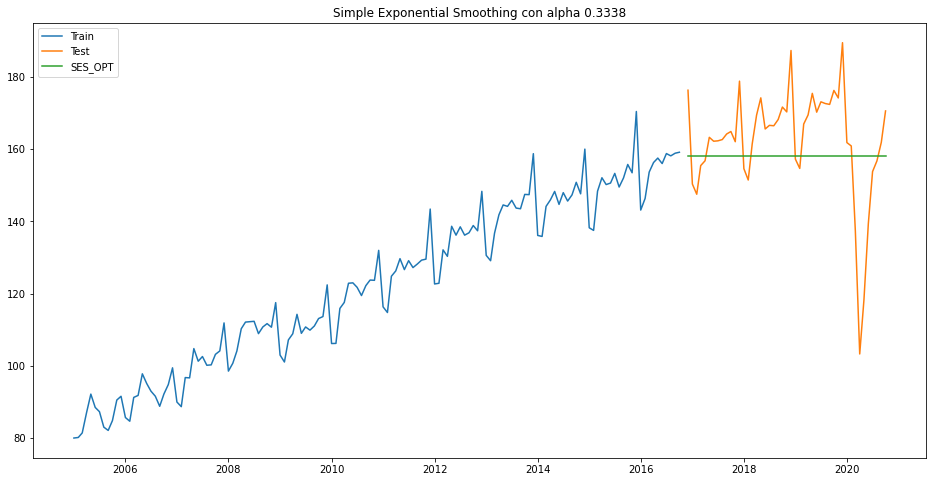

       2016-11-01  2016-12-01  2017-01-01  2017-02-01  2017-03-01
Y_hat  158.094137  158.094137  158.094137  158.094137  158.094137
Y      176.292989  150.313227  147.488327  155.417625  156.758948


In [305]:
# Ahora optimizamos para obtener el ETS(A, N, N) para el PBI

pred_opt   =  SimpleExpSmoothing(train['Producto bruto interno y demanda interna (índice 2007=100) - PBI']).fit(optimized = True)


print('')
print('== Simple Exponential Smoothing ')
print('')

print('')
print('Smoothing Level', np.round(pred_opt.params['smoothing_level'], 4))
print('Initial Level',   np.round(pred_opt.params['initial_level'], 4))
print('')

#len(test)=47 
y_pred_opt           = pred_opt.forecast(steps = 47)
df_pred_opt          = pd.DataFrame({'Y_hat':y_pred_opt,'Y':test['Producto bruto interno y demanda interna (índice 2007=100) - PBI'].values})

rmse_opt             =  np.sqrt(mean_squared_error(test['Producto bruto interno y demanda interna (índice 2007=100) - PBI'], y_pred_opt))
mape_opt             =  MAPE(test['Producto bruto interno y demanda interna (índice 2007=100) - PBI'], y_pred_opt)

alpha_value          = np.round(pred_opt.params['smoothing_level'], 4)

print("For alpha = %1.2f,  RMSE is %3.4f MAPE is %3.2f" %(alpha_value, rmse_opt, mape_opt))
plt.figure(figsize=(16,8))
plt.plot(train.index, train['Producto bruto interno y demanda interna (índice 2007=100) - PBI'], label = 'Train')
plt.plot(test.index, test['Producto bruto interno y demanda interna (índice 2007=100) - PBI'],  label = 'Test')
plt.plot(test.index, y_pred_opt,           label = 'SES_OPT')
plt.title('Simple Exponential Smoothing con alpha ' + str(alpha_value))
plt.legend(loc='best') 
plt.show()

print(df_pred_opt.head().T)


==Holt model Exponential Smoothing Parameters ==

Smoothing Level 0.0
Smoothing Trend 0.0
Initial Level 82.8331



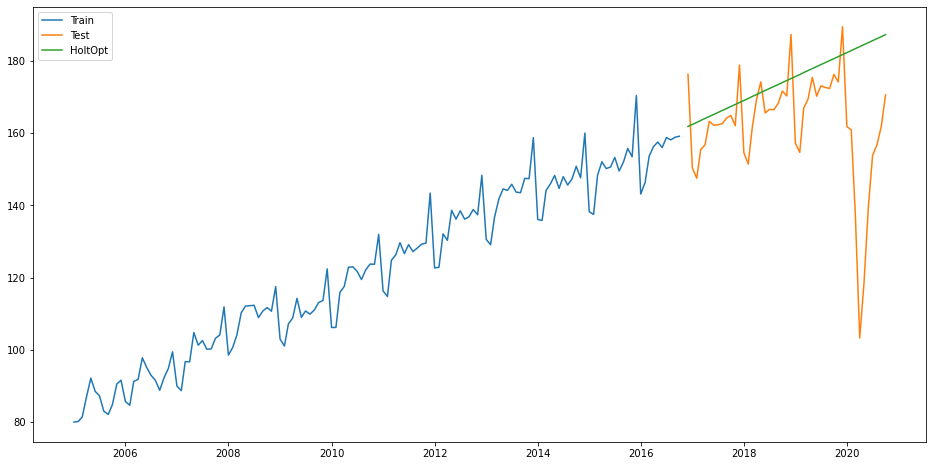

For alpha = 0.00,  RMSE is 21.5962 MAPE is 8.78
{'smoothing_level': 1.4901161193847656e-08, 'smoothing_trend': 9.82990124030106e-10, 'smoothing_seasonal': nan, 'damping_trend': nan, 'initial_level': 82.83306209541531, 'initial_trend': 0.5524536834687974, 'initial_seasons': array([], dtype=float64), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


In [306]:
# optimizamos nuevamente para el PBI pero usando la metodologia Holt linear trend


model_fit = Holt(np.asarray(train['Producto bruto interno y demanda interna (índice 2007=100) - PBI'])).fit()

#model_fit = model.fit()

print('')
print('==Holt model Exponential Smoothing Parameters ==')
print('')
alpha_value = np.round(model_fit.params['smoothing_level'], 4)
print('Smoothing Level', alpha_value )
beta_value= np.round(model_fit.params['smoothing_trend'], 4)
print('Smoothing Trend', beta_value)
print('Initial Level',   np.round(model_fit.params['initial_level'], 4))
print('')



Pred_Holt = test.copy()

Pred_Holt['Opt'] = model_fit.forecast(len(test['Producto bruto interno y demanda interna (índice 2007=100) - PBI']))
plt.figure(figsize=(16,8))
plt.plot(train['Producto bruto interno y demanda interna (índice 2007=100) - PBI'], label='Train')
plt.plot(test['Producto bruto interno y demanda interna (índice 2007=100) - PBI'], label='Test')
plt.plot(Pred_Holt['Opt'], label='HoltOpt')
plt.legend(loc='best')
plt.show()


df_pred_opt =  pd.DataFrame({'Y_hat':Pred_Holt['Opt'] ,'Y':test['Producto bruto interno y demanda interna (índice 2007=100) - PBI'].values})
rmse_opt =  np.sqrt(mean_squared_error(df_pred_opt.Y, df_pred_opt.Y_hat))
mape_opt =  MAPE(df_pred_opt.Y, df_pred_opt.Y_hat)

print("For alpha = %1.2f,  RMSE is %3.4f MAPE is %3.2f" %(alpha_value, rmse_opt, mape_opt))

print(model_fit.params)

Conslusiones: análisis similar al caso de las Exportaciones. Concluimos que lo óptimo será un ETS(A, N, N) donde $\hat{\alpha}= 1/3$ y $\hat{\ell_0} = 82.6065$.

# Series de tiempo trimestrales

In [396]:

#Venta de energía eléctrica total (gwh)
#Producción de energía eléctrica total (gwh)

url_base  = 'https://estadisticas.bcrp.gob.pe/estadisticas/series/api/'
cod_var   = ['RD14428DQ', 'RD14378DQ'] 
form_out  = '/json'
#
period    = '/2000-T1/2021-T3'


# dejamos la nomenclatura T.

#crear la mega tabla
df_trimestral_primaria = pd.DataFrame()

#Transformando los datos a formato de base de datos Pandas. 

for j in cod_var:
    url_aux   = url_base + j + form_out + period
    resp      = requests.get(url_aux)
    resp_json = resp.json()
    periods   = resp_json['periods']
    
    value = []
    dates = []
    
    for i in periods:
        aux_dat = i['name']
        aux_val = i['values']
        dates.append(aux_dat)
        value.append(float(aux_val[0]))
    
    dict_aux = {'Fecha' : dates, 
                 resp_json['config']['series'][0]['name'] : value}
    df_aux = pd.DataFrame(dict_aux)
    df_aux.set_index(df_aux['Fecha'], inplace=True)
    df_aux = df_aux.drop(columns=['Fecha'])
    df_trimestral_primaria   = pd.concat([df_trimestral_primaria, df_aux], axis=1)

display(df_trimestral_primaria)

,Venta de energía eléctrica por departamento - Total (gwh),Producción de electricidad por departamento - Total (gwh)
Fecha,,
T1.04,4805.392031,NaN
T2.04,4884.910355,NaN
T3.04,4912.572435,NaN
T4.04,5052.286200,NaN
T1.05,5011.985074,6204.779219
...,...,...
T4.20,NaN,4892.713096
T1.21,NaN,4931.805628
T2.21,NaN,4700.398841


In [397]:
#for missings
df_trimestral_draft=df_trimestral_primaria.fillna(method='bfill')
df_trimestral=df_trimestral_draft.fillna(method='ffill')


In [398]:
display(df_trimestral)

,Venta de energía eléctrica por departamento - Total (gwh),Producción de electricidad por departamento - Total (gwh)
Fecha,,
T1.04,4805.392031,6204.779219
T2.04,4884.910355,6204.779219
T3.04,4912.572435,6204.779219
T4.04,5052.286200,6204.779219
T1.05,5011.985074,6204.779219
...,...,...
T4.20,3848.828329,4892.713096
T1.21,3848.828329,4931.805628
T2.21,3848.828329,4700.398841


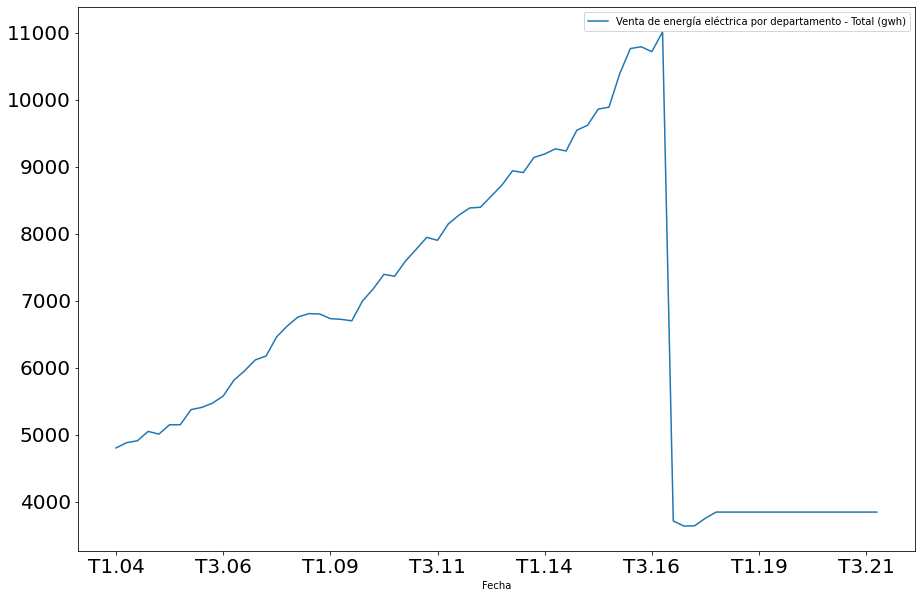

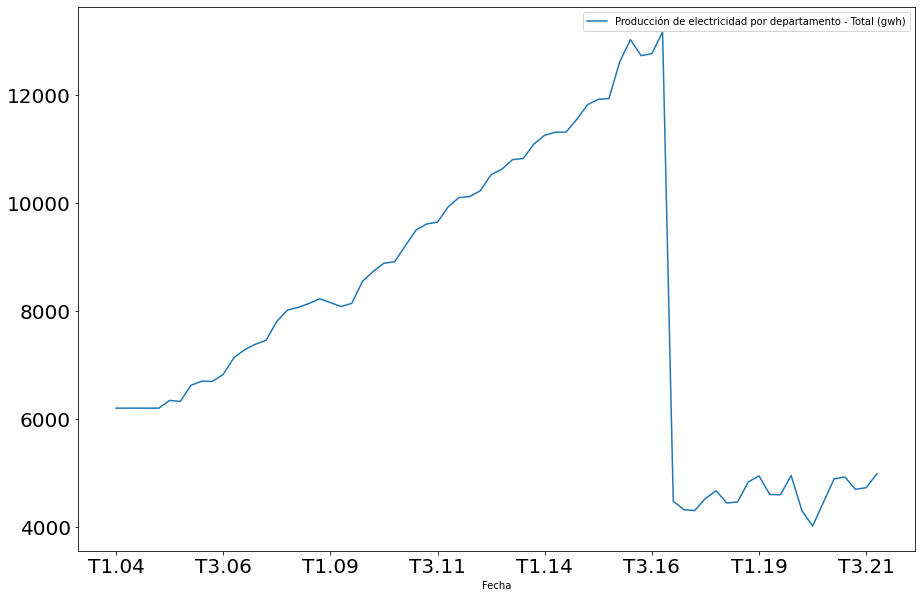

In [383]:
for i in range(2):
    df_timeseriesdiaria = df_trimestral.iloc[:,[i]] 
    fig = df_timeseriesdiaria.plot(figsize=(15, 10), fontsize=20, legend=dict_aux).get_figure()


# ARIMA forecast para series trimestrales 
Forecast de la venta de energía eléctrica 2 trimestres en adelante, usando la metodología ARIMA.

In [399]:
data_venta   = df_trimestral.iloc[:,[0]]

In [407]:
# iloc 0, primera columna: venta


df_aux = data_venta.reset_index()
df_aux = df_aux.drop(columns=['Fecha'])
df_    = df_aux.iloc[:,0].copy('deep')

# Definimos el tipo de estacionalidad (trimestral)


df_fct_venta = pd.DataFrame()
# p entre 0 y 3 y q entre 0 y 3 dado que la data es trimestral

for p in range(0,3,1):
    for q in range(0,3,1):
        
        arima_order = (p, 1, q)
        seasonal_order = (1, 1, 1, 4)
        # define model
        model = SARIMAX(data_venta, 
                        order=arima_order,
                        seasonal_order=seasonal_order)
        
        # fit model
        model_fit = model.fit()
        
        # Forecast 2 trimestres
        yhat = model_fit.forecast(2)
        
        # Append
        
        df_0 = pd.concat([df_, yhat],ignore_index=True)
        df_fct_venta = pd.concat([df_fct_venta, df_0], axis=1)
        

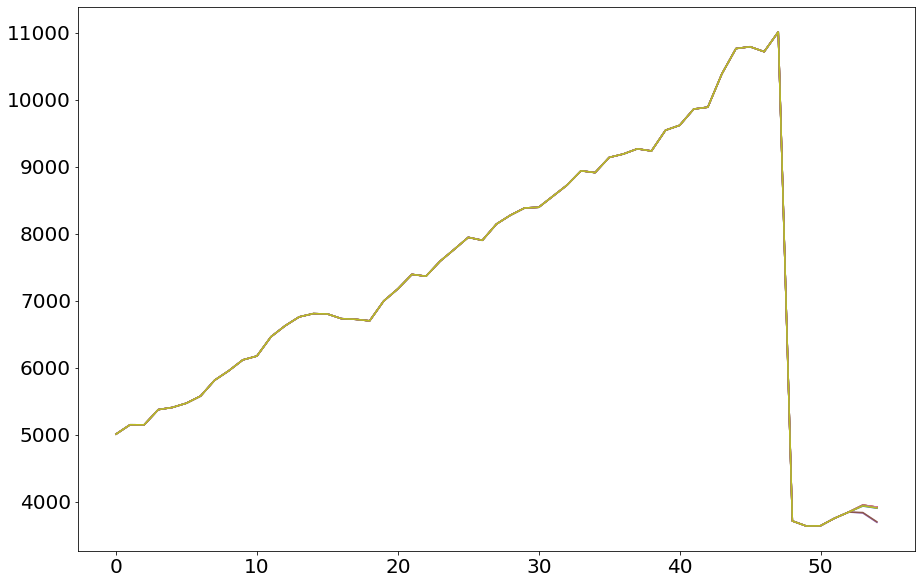

In [408]:
fig = df_fct_venta.iloc[:,:].plot(figsize=(15, 10), fontsize=20, legend=False).get_figure()

In [400]:
data_produccion   = df_trimestral.iloc[:,[1]]

In [409]:
# iloc 1, segunda columna: produccion


df_aux = data_produccion.reset_index()
df_aux = df_aux.drop(columns=['Fecha'])
df_    = df_aux.iloc[:,[0]].copy('deep')

# Definimos el tipo de estacionalidad (trimestral)


df_fct_produccion = pd.DataFrame()
# p entre 0 y 3 y q entre 0 y 3 dado que la data es trimestral

for p in range(0,3,1):
    for q in range(0,3,1):
        
        arima_order = (p, 1, q)
        seasonal_order = (1, 1, 1, 4)
        # define model
        model = SARIMAX(data, 
                        order=arima_order,
                        seasonal_order=seasonal_order)
        
        # fit model
        model_fit = model.fit()
        
        # Forecast 2 trimestres
        yhat = model_fit.forecast(2)
        
        # Append
        
        df_0 = pd.concat([df_, yhat],ignore_index=True)
        df_fct_produccion = pd.concat([df_fct_produccion, df_0], axis=1)
        

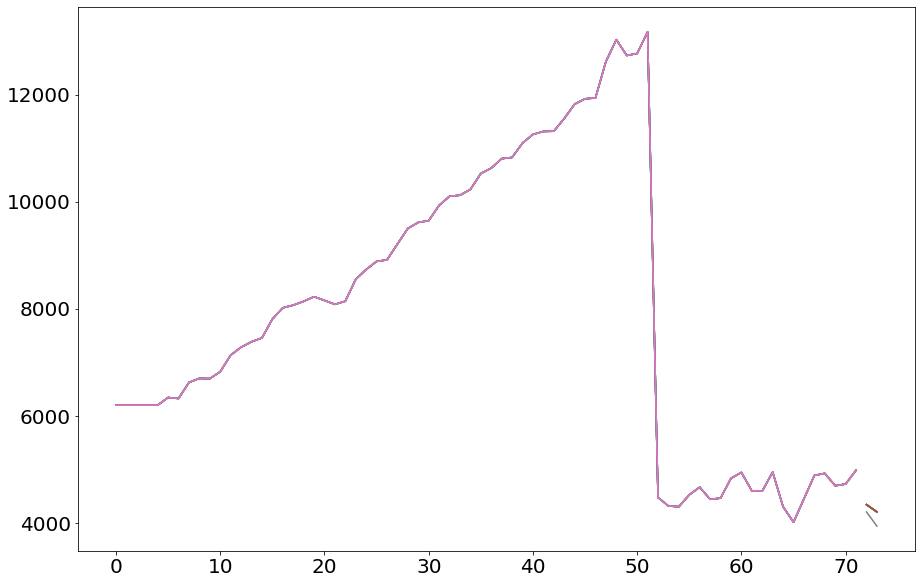

In [410]:
fig = df_fct.iloc[:,:].plot(figsize=(15, 10), fontsize=20, legend=False).get_figure()

# ARIMA cross validation, MAPE y RMSE

In [411]:

n = len(df_trimestral.iloc[:,[0]])
display(n)
train_count = round(n * 0.8)
#train = dfmensual.iloc[:,[0]].iloc[:train_count]
#test = dfmensual.iloc[:,[0]].iloc[train_count + 1:n]
train, test = model_selection.train_test_split(df_trimestral.iloc[:,[0]], train_size=train_count)
display(train_count)


53

42

In [412]:
errorsrmse = []
errorsmape = []
models = []
seasonal_order = (1, 1, 1, 4)


for p in range(0,3,1):
    for q in range(0,3,1):
      
        arima_order = (p, 1, q)
        # define model
        model = SARIMAX(train, order=arima_order, seasonal_order=seasonal_order)
        
        model.initialize_approximate_diffuse()
        # fit model
        model_fit = model.fit()
        
        # Forecast: 72-58
        yhat = model_fit.forecast(11)
         # Append
            
        rmse =  np.sqrt(mean_squared_error(test['Venta de energía eléctrica por departamento - Total (gwh)'], yhat))
        mape =  MAPE(test['Venta de energía eléctrica por departamento - Total (gwh)'], yhat)   
        
        
        print("Model p="  + str(p) + " and q = " + str(q) + "scores: ")
        print("RMSE")
        display(rmse)
        print("MAPE") 
        display(mape)
        

        errorsrmse.append(rmse)
        errorsmape.append(mape)
        models.append(model)
        
better_index = np.argmin(errorsrmse)  # type: int
better_index1 = np.argmin(errorsmape)  # type: int

print("MenorRMSE: {} (model {})".format(errorsrmse[better_index], better_index + 1))
print("MenorMAPE: {} (model {})".format(errorsmape[better_index], better_index + 1))
#con ctlf al valor numerico del RMSE y MAPE se obtiene el p, q respectivos

Model p=0 and q = 0scores: 
RMSE


4849.429730008474

MAPE


46.32

Model p=0 and q = 1scores: 
RMSE


4872.557044748721

MAPE


46.32

Model p=0 and q = 2scores: 
RMSE


4881.75719941692

MAPE


46.35

Model p=1 and q = 0scores: 
RMSE


4847.547286121013

MAPE


46.3

Model p=1 and q = 1scores: 
RMSE


4887.680470504174

MAPE


46.37

Model p=1 and q = 2scores: 
RMSE


4886.52793297537

MAPE


46.43

Model p=2 and q = 0scores: 
RMSE


4891.976332445973

MAPE


46.39

Model p=2 and q = 1scores: 
RMSE


4891.443680382222

MAPE


46.39

Model p=2 and q = 2scores: 
RMSE


4884.9792739889135

MAPE


46.43

MenorRMSE: 4847.547286121013 (model 4)
MenorMAPE: 46.3 (model 4)


In [413]:
n = len(df_trimestral.iloc[:,[1]])
train_count = round(n * 0.8)
#train = dfmensual.iloc[:,[0]].iloc[:train_count]
#test = dfmensual.iloc[:,[0]].iloc[train_count + 1:n]
train, test = model_selection.train_test_split(df_trimestral.iloc[:,[1]], train_size=train_count)

In [414]:
errorsrmse = []
errorsmape = []
models = []
seasonal_order = (1, 1, 1, 4)


for p in range(0,3,1):
    for q in range(0,3,1):
      
        arima_order = (p, 1, q)
        # define model
        model = SARIMAX(train, order=arima_order, seasonal_order=seasonal_order)
        
        model.initialize_approximate_diffuse()
        # fit model
        model_fit = model.fit()
        
        # Forecast: 72-58
        yhat = model_fit.forecast(11)
         # Append
            
        rmse =  np.sqrt(mean_squared_error(test['Producción de electricidad por departamento - Total (gwh)'], yhat))
        mape =  MAPE(test['Producción de electricidad por departamento - Total (gwh)'], yhat)   
        
        
        print("Model p="  + str(p) + " and q = " + str(q) + "scores: ")
        print("RMSE")
        display(rmse)
        print("MAPE") 
        display(mape)
        

        errorsrmse.append(rmse)
        errorsmape.append(mape)
        models.append(model)
        
better_index = np.argmin(errorsrmse)  # type: int
better_index1 = np.argmin(errorsmape)  # type: int

print("MenorRMSE: {} (model {})".format(errorsrmse[better_index], better_index + 1))
print("MenorMAPE: {} (model {})".format(errorsmape[better_index], better_index + 1))
#con ctlf al valor numerico del RMSE y MAPE se obtiene el p, q respectivos

Model p=0 and q = 0scores: 
RMSE


5916.124464134588

MAPE


46.29

Model p=0 and q = 1scores: 
RMSE


5900.901159009076

MAPE


46.23

Model p=0 and q = 2scores: 
RMSE


5899.252534824468

MAPE


46.24

Model p=1 and q = 0scores: 
RMSE


5906.877265580332

MAPE


46.24

Model p=1 and q = 1scores: 
RMSE


5889.630986066884

MAPE


46.18

Model p=1 and q = 2scores: 
RMSE


5909.552560878435

MAPE


46.27

Model p=2 and q = 0scores: 
RMSE


5927.3580345158025

MAPE


46.32

Model p=2 and q = 1scores: 
RMSE


5910.641519870264

MAPE


46.28

Model p=2 and q = 2scores: 
RMSE


5900.033914554276

MAPE


46.23

MenorRMSE: 5889.630986066884 (model 5)
MenorMAPE: 46.18 (model 5)


In [255]:
# Finding the best SARIMA model
autoarima = pmd.auto_arima(
        y = data_venta ,
        start_p=1,
        start_q=0,
        seasonal=True,
        max_p=12,
        max_d=1,
        max_q=6,
        max_P=12,
        max_D=1,
        max_Q=6,
        m=4,
        n_jobs=-1,
        suppress_warnings=True,
        )

display(autoarima.order)
display(autoarima.seasonal_order)

(1, 0, 0)

(0, 0, 0, 4)

In [256]:
# Finding the best SARIMA model
autoarima = pmd.auto_arima(
        y = data_produccion ,
        start_p=1,
        start_q=0,
        seasonal=True,
        max_p=12,
        max_d=1,
        max_q=6,
        max_P=12,
        max_D=1,
        max_Q=6,
        m=4,
        n_jobs=-1,
        suppress_warnings=True,
        )

display(autoarima.order)
display(autoarima.seasonal_order)

(1, 0, 0)

(0, 0, 0, 4)

Conclusiones: basándonos en el método CV (minimización del MAPE o RMSE), en relación a la Venta de energía eléctrica por departamento - Total (gwh) $y$, de acuerdo con las simulaciones para $q, p \in [0, 3]$, manteniendo $(P, D, Q, m)= (1, 1, 1, 4)$ conducen a un modelo ARIMA(1, 1, 0). En cuanto a la Producción de electricidad por departamento - Total (gwh) $z$, el fit provee un ARIMA(1, 1, 1). Así,

$$ y_t^{1} = \phi_1y_{t-1}^{1}+  \varepsilon_{t}$$

$$ z_t^{1} = \phi_1z_{t-1}^{1}+ \theta_1 \varepsilon_{t-1}+ \varepsilon_{t}$$

Sin embargo, dado que el método autorima que minimiza el AIC optimiza sobre un conjunto mayor, se usará para la última pregunta las especificaciones ARIMA:

- Venta de energía eléctrica: (1, 0, 0) (0, 0, 0, 4)
- Producción de energía eléctrica: (1, 0, 0) (0, 0, 0, 4)



# ETS Series de tiempo trimestrales

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: An unsupported index

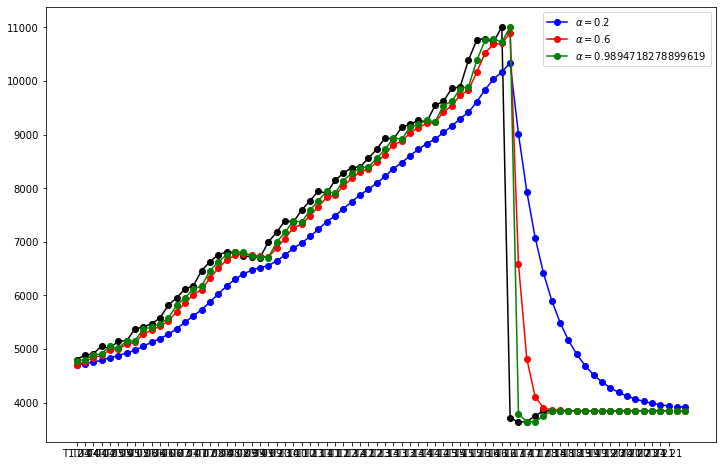

In [257]:

# Empecemos con las ventas: dfmensual.iloc[:,[0]]
venta_energia = df_trimestral.iloc[:,[0]]

fit1 = SimpleExpSmoothing(venta_energia, initialization_method="heuristic").fit(
    smoothing_level=0.2, optimized=False
)
# 2 meses prediccion
fcast1 = fit1.forecast(2).rename(r"$\alpha=0.2$")
fit2 = SimpleExpSmoothing(venta_energia, initialization_method="heuristic").fit(
    smoothing_level=0.6, optimized=False
)
fcast2 = fit2.forecast(2).rename(r"$\alpha=0.6$")
fit3 = SimpleExpSmoothing(venta_energia, initialization_method="estimated").fit()
fcast3 = fit3.forecast(2).rename(r"$\alpha=%s$" % fit3.model.params["smoothing_level"])

plt.figure(figsize=(12, 8))
plt.plot(venta_energia, marker="o", color="black")
plt.plot(fit1.fittedvalues, marker="o", color="blue")
(line1,) = plt.plot(fcast1, marker="o", color="blue")
plt.plot(fit2.fittedvalues, marker="o", color="red")
(line2,) = plt.plot(fcast2, marker="o", color="red")
plt.plot(fit3.fittedvalues, marker="o", color="green")
(line3,) = plt.plot(fcast3, marker="o", color="green")
plt.legend([line1, line2, line3], [fcast1.name, fcast2.name, fcast3.name])

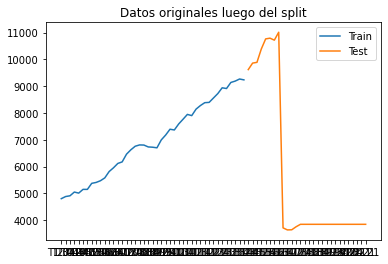

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(



== Simple Exponential Smoothing 


Smoothing Level 0.995
Initial Level 4805.392

For alpha = 0.99,  RMSE is 4628.5533 MAPE is 73.75


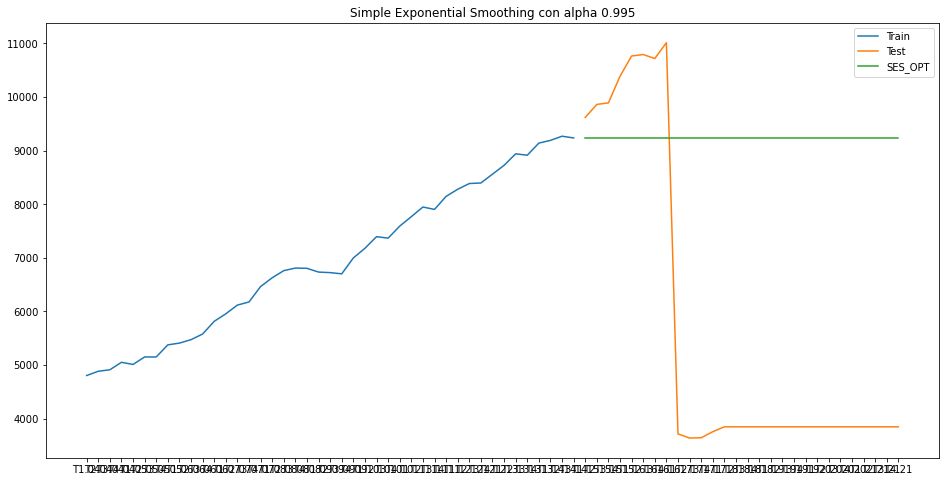

                43           44           45            46            47
Y_hat  9236.281525  9236.281525  9236.281525   9236.281525   9236.281525
Y      9618.767910  9861.567507  9889.474061  10387.696320  10764.364061


In [310]:
# Ahora optimizamos para obtener el ETS(A, N, N) para la venta de energia

# en vez de 0.75 le pongo 0.6 porque hay un periodo de outliers

n = len(venta_energia )
train_count = round(n * 0.6)
train = venta_energia .iloc[:train_count]
test = venta_energia .iloc[train_count + 1:n]


#fig = plt.figure()
plt.plot(train.index, train['Venta de energía eléctrica por departamento - Total (gwh)'], label='Train')
plt.plot(test.index, test['Venta de energía eléctrica por departamento - Total (gwh)'], label='Test')
# Grafico la parte de entrenamiento y la de test
plt.legend(loc = 'best')
plt.title('Datos originales luego del split')
plt.show()

pred_opt   =  SimpleExpSmoothing(train['Venta de energía eléctrica por departamento - Total (gwh)']).fit(optimized = True)


print('')
print('== Simple Exponential Smoothing ')
print('')

print('')
print('Smoothing Level', np.round(pred_opt.params['smoothing_level'], 4))
print('Initial Level',   np.round(pred_opt.params['initial_level'], 4))
print('')

#len(test)=47 
y_pred_opt           = pred_opt.forecast(steps = 28)
df_pred_opt          = pd.DataFrame({'Y_hat':y_pred_opt,'Y':test['Venta de energía eléctrica por departamento - Total (gwh)'].values})

rmse_opt             =  np.sqrt(mean_squared_error(test['Venta de energía eléctrica por departamento - Total (gwh)'], y_pred_opt))
mape_opt             =  MAPE(test['Venta de energía eléctrica por departamento - Total (gwh)'], y_pred_opt)

alpha_value          = np.round(pred_opt.params['smoothing_level'], 4)

print("For alpha = %1.2f,  RMSE is %3.4f MAPE is %3.2f" %(alpha_value, rmse_opt, mape_opt))
plt.figure(figsize=(16,8))
plt.plot(train.index, train['Venta de energía eléctrica por departamento - Total (gwh)'], label = 'Train')
plt.plot(test.index, test['Venta de energía eléctrica por departamento - Total (gwh)'],  label = 'Test')
plt.plot(test.index, y_pred_opt,           label = 'SES_OPT')
plt.title('Simple Exponential Smoothing con alpha ' + str(alpha_value))
plt.legend(loc='best') 
plt.show()

print(df_pred_opt.head().T)


==Holt model Exponential Smoothing Parameters ==

Smoothing Level 0.8684
Smoothing Trend 0.0325
Initial Level 4742.152



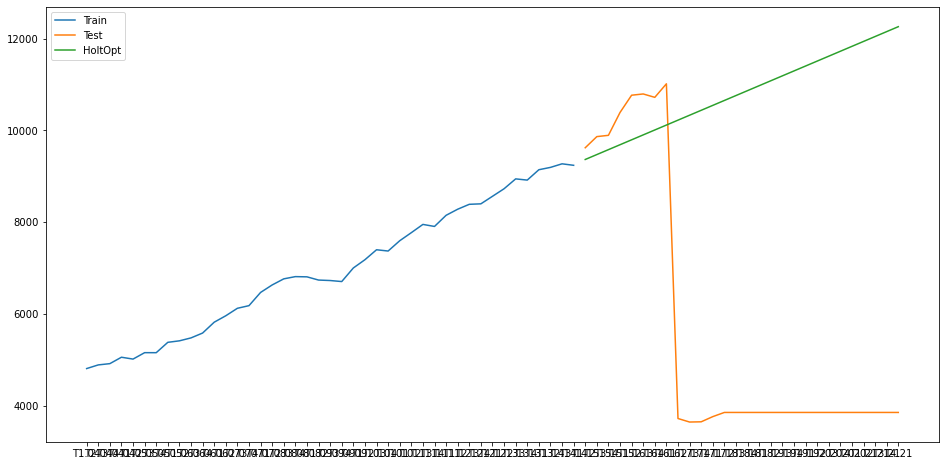

For alpha = 0.87,  RMSE is 6302.7958 MAPE is 96.36
{'smoothing_level': 0.8684285564215202, 'smoothing_trend': 0.032547320327486466, 'smoothing_seasonal': nan, 'damping_trend': nan, 'initial_level': 4742.151954378128, 'initial_trend': 110.27389699176157, 'initial_seasons': array([], dtype=float64), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


In [311]:
# optimizamos usando la metodologia Holt linear trend


model_fit = Holt(np.asarray(train['Venta de energía eléctrica por departamento - Total (gwh)'])).fit()

#model_fit = model.fit()

print('')
print('==Holt model Exponential Smoothing Parameters ==')
print('')
alpha_value = np.round(model_fit.params['smoothing_level'], 4)
print('Smoothing Level', alpha_value )
beta_value= np.round(model_fit.params['smoothing_trend'], 4)
print('Smoothing Trend', beta_value)
print('Initial Level',   np.round(model_fit.params['initial_level'], 4))
print('')



Pred_Holt = test.copy()

Pred_Holt['Opt'] = model_fit.forecast(len(test['Venta de energía eléctrica por departamento - Total (gwh)']))
plt.figure(figsize=(16,8))
plt.plot(train['Venta de energía eléctrica por departamento - Total (gwh)'], label='Train')
plt.plot(test['Venta de energía eléctrica por departamento - Total (gwh)'], label='Test')
plt.plot(Pred_Holt['Opt'], label='HoltOpt')
plt.legend(loc='best')
plt.show()


df_pred_opt =  pd.DataFrame({'Y_hat':Pred_Holt['Opt'] ,'Y':test['Venta de energía eléctrica por departamento - Total (gwh)'].values})
rmse_opt =  np.sqrt(mean_squared_error(df_pred_opt.Y, df_pred_opt.Y_hat))
mape_opt =  MAPE(df_pred_opt.Y, df_pred_opt.Y_hat)

print("For alpha = %1.2f,  RMSE is %3.4f MAPE is %3.2f" %(alpha_value, rmse_opt, mape_opt))

print(model_fit.params)

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: An unsupported index

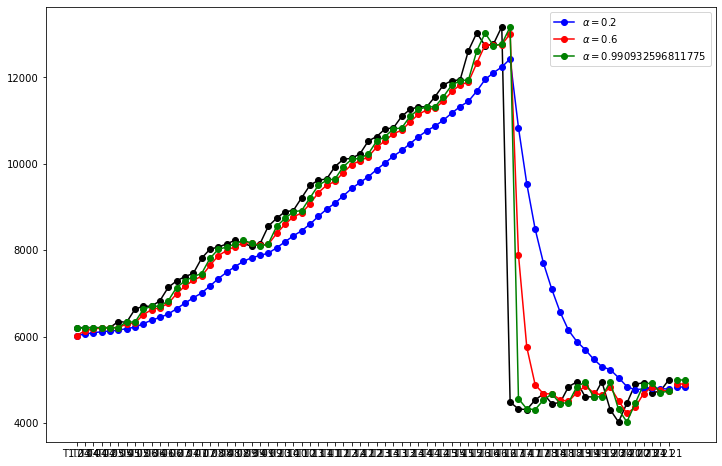

In [313]:
# Ahora seguimos con la produccion: df_trimestral.iloc[:,[0]]
produccion_energia = df_trimestral.iloc[:,[1]]

fit1 = SimpleExpSmoothing(produccion_energia, initialization_method="heuristic").fit(
    smoothing_level=0.2, optimized=False
)
# 2 meses prediccion
fcast1 = fit1.forecast(2).rename(r"$\alpha=0.2$")
fit2 = SimpleExpSmoothing(produccion_energia, initialization_method="heuristic").fit(
    smoothing_level=0.6, optimized=False
)
fcast2 = fit2.forecast(2).rename(r"$\alpha=0.6$")
fit3 = SimpleExpSmoothing(produccion_energia, initialization_method="estimated").fit()
fcast3 = fit3.forecast(2).rename(r"$\alpha=%s$" % fit3.model.params["smoothing_level"])

plt.figure(figsize=(12, 8))
plt.plot(produccion_energia, marker="o", color="black")
plt.plot(fit1.fittedvalues, marker="o", color="blue")
(line1,) = plt.plot(fcast1, marker="o", color="blue")
plt.plot(fit2.fittedvalues, marker="o", color="red")
(line2,) = plt.plot(fcast2, marker="o", color="red")
plt.plot(fit3.fittedvalues, marker="o", color="green")
(line3,) = plt.plot(fcast3, marker="o", color="green")
plt.legend([line1, line2, line3], [fcast1.name, fcast2.name, fcast3.name])

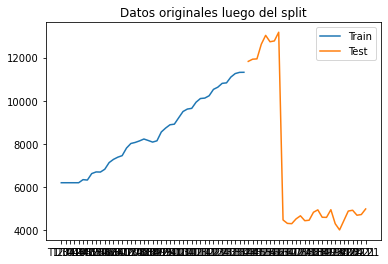

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(



== Simple Exponential Smoothing 


Smoothing Level 0.995
Initial Level 6204.7792

For alpha = 0.99,  RMSE is 5713.5420 MAPE is 74.70


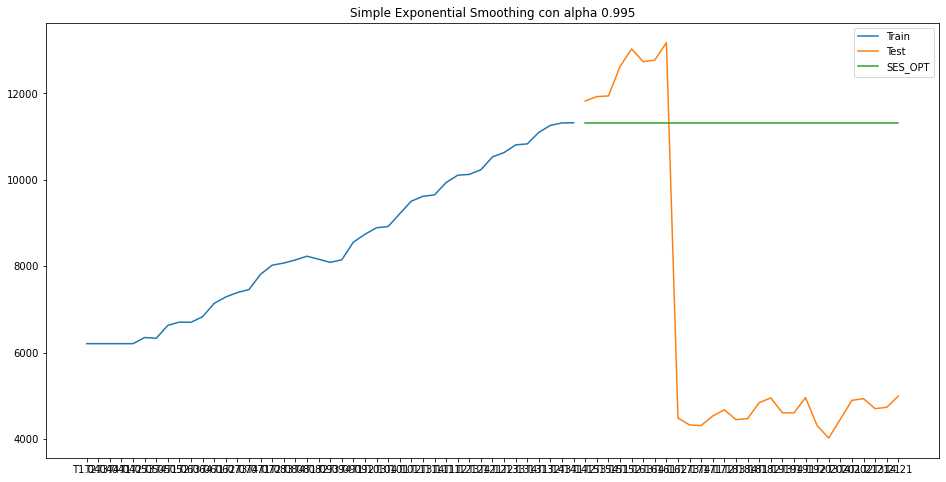

                 43            44            45            46            47
Y_hat  11317.435232  11317.435232  11317.435232  11317.435232  11317.435232
Y      11822.559515  11923.391361  11938.581456  12617.496073  13027.746381


In [315]:
# Ahora optimizamos para obtener el ETS(A, N, N) para la produccion de energia


n = len(produccion_energia )
train_count = round(n * 0.6)
train = produccion_energia.iloc[:train_count]
test = produccion_energia.iloc[train_count + 1:n]


#fig = plt.figure()
plt.plot(train.index, train['Producción de electricidad por departamento - Total (gwh)'], label='Train')
plt.plot(test.index, test['Producción de electricidad por departamento - Total (gwh)'], label='Test')
# Grafico la parte de entrenamiento y la de test
plt.legend(loc = 'best')
plt.title('Datos originales luego del split')
plt.show()
#optimizamos
pred_opt   =  SimpleExpSmoothing(train['Producción de electricidad por departamento - Total (gwh)']).fit(optimized = True)


print('')
print('== Simple Exponential Smoothing ')
print('')

print('')
print('Smoothing Level', np.round(pred_opt.params['smoothing_level'], 4))
print('Initial Level',   np.round(pred_opt.params['initial_level'], 4))
print('')

#len(test)=47 
y_pred_opt           = pred_opt.forecast(steps = 28)
df_pred_opt          = pd.DataFrame({'Y_hat':y_pred_opt,'Y':test['Producción de electricidad por departamento - Total (gwh)'].values})

rmse_opt             =  np.sqrt(mean_squared_error(test['Producción de electricidad por departamento - Total (gwh)'], y_pred_opt))
mape_opt             =  MAPE(test['Producción de electricidad por departamento - Total (gwh)'], y_pred_opt)

alpha_value          = np.round(pred_opt.params['smoothing_level'], 4)

print("For alpha = %1.2f,  RMSE is %3.4f MAPE is %3.2f" %(alpha_value, rmse_opt, mape_opt))
plt.figure(figsize=(16,8))
plt.plot(train.index, train['Producción de electricidad por departamento - Total (gwh)'], label = 'Train')
plt.plot(test.index, test['Producción de electricidad por departamento - Total (gwh)'],  label = 'Test')
plt.plot(test.index, y_pred_opt,           label = 'SES_OPT')
plt.title('Simple Exponential Smoothing con alpha ' + str(alpha_value))
plt.legend(loc='best') 
plt.show()

print(df_pred_opt.head().T)


==Holt model Exponential Smoothing Parameters ==

Smoothing Level 0.9954
Smoothing Trend 0.0011
Initial Level 6174.8335



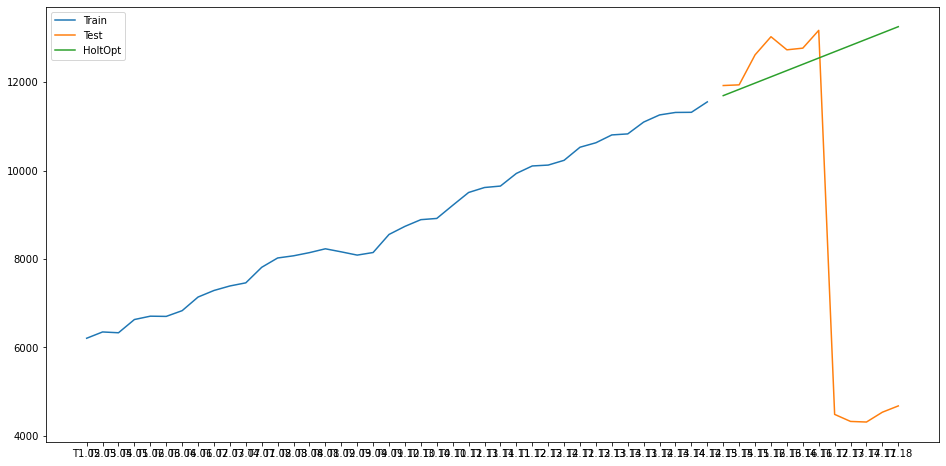

For alpha = 1.00,  RMSE is 5507.8528 MAPE is 41.52
{'smoothing_level': 0.9954330738059195, 'smoothing_trend': 0.0010841164140744596, 'smoothing_seasonal': nan, 'damping_trend': nan, 'initial_level': 6174.833467868915, 'initial_trend': 142.13520494956254, 'initial_seasons': array([], dtype=float64), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


In [426]:
# optimizamos usando la metodologia Holt linear trend


model_fit = Holt(np.asarray(train['Producción de electricidad por departamento - Total (gwh)'])).fit()

#model_fit = model.fit()

print('')
print('==Holt model Exponential Smoothing Parameters ==')
print('')
alpha_value = np.round(model_fit.params['smoothing_level'], 4)
print('Smoothing Level', alpha_value )
beta_value= np.round(model_fit.params['smoothing_trend'], 4)
print('Smoothing Trend', beta_value)
print('Initial Level',   np.round(model_fit.params['initial_level'], 4))
print('')



Pred_Holt = test.copy()

Pred_Holt['Opt'] = model_fit.forecast(len(test['Producción de electricidad por departamento - Total (gwh)']))
plt.figure(figsize=(16,8))
plt.plot(train['Producción de electricidad por departamento - Total (gwh)'], label='Train')
plt.plot(test['Producción de electricidad por departamento - Total (gwh)'], label='Test')
plt.plot(Pred_Holt['Opt'], label='HoltOpt')
plt.legend(loc='best')
plt.show()


df_pred_opt =  pd.DataFrame({'Y_hat':Pred_Holt['Opt'] ,'Y':test['Producción de electricidad por departamento - Total (gwh)'].values})
rmse_opt =  np.sqrt(mean_squared_error(df_pred_opt.Y, df_pred_opt.Y_hat))
mape_opt =  MAPE(df_pred_opt.Y, df_pred_opt.Y_hat)

print("For alpha = %1.2f,  RMSE is %3.4f MAPE is %3.2f" %(alpha_value, rmse_opt, mape_opt))

print(model_fit.params)

Conclusiones: nuevamente el ETS(A, N, N) se desempeña mejor que el Holt linear trend. Esto se debe nuevamente a la presencia de outliers (caíd abrupta del 2017). Para la venta de energía por departamento, se estima $\hat{\alpha}= 0.995$ mientras que para la producción  $\hat{\alpha}= 0.99$, donde, respectivamente para cada serie,

$$ \hat{y}_{t+1|t} = \alpha y_t + (1-\alpha)\hat{y}_{t|t-1}, \ t=1, ..., T. $$



# Series de tiempo cuya frecuencia es diaria

In [260]:

#Cobre y oil

url_base  = 'https://estadisticas.bcrp.gob.pe/estadisticas/series/api/'
cod_var   = ['PD04701XD', 'PD04705XD'] 
form_out  = '/json'
#
period    = '/2000-1-1/2022-12-1'



#crear la mega tabla
df_diaria_pregunta_3 = pd.DataFrame()

month_s = ['Ene','Feb','Mar','Abr','May','Jun','Jul','Ago','Set','Oct','Nov','Dic']
month_d = ['01','02','03','04','05','06','07','08','09','10','11','12']


#Transformando los datos a formato de base de datos Pandas. 
"""

for j in cod_var:
    url_aux   = url_base + j + form_out + period
    resp      = requests.get(url_aux)
    resp_json = resp.json()
    periods   = resp_json['periods']
    
    value = []
    dates = []
    
    for i in periods:
        aux_dat = i['name']
        aux_val = i['values']
        dates.append(aux_dat)
        value.append(float(aux_val[0]))
    
    dict_aux = {'Fecha' : dates, 
                 resp_json['config']['series'][0]['name'] : value}
    df_aux = pd.DataFrame(dict_aux)
    df_aux.set_index(df_aux['Fecha'], inplace=True)
    df_aux = df_aux.drop(columns=['Fecha'])
    df1    = pd.concat([df1, df_aux], axis=1)
"""

for j in cod_var:
    url_aux   = url_base + j + form_out + period
    resp      = requests.get(url_aux)
    resp_json = resp.json()
    periods   = resp_json['periods']
    
    value = []
    dates = []
    
    for i in periods:
        aux_dat = i['name']
        aux_val = i['values']
        dates.append(aux_dat)
        value.append(float(aux_val[0]))
    
    dict_aux = {'Fecha' : dates, 
                 resp_json['config']['series'][0]['name'] : value}
    df_aux = pd.DataFrame(dict_aux)


    for (s,d) in zip(month_s,month_d):
        df_aux['Fecha'] = df_aux['Fecha'].str.replace(s,d)
    df_aux['Fecha'] = pd.to_datetime(df_aux['Fecha'])
    
    df_aux.set_index(df_aux['Fecha'], inplace=True)
    df_aux = df_aux.drop(columns=['Fecha'])
    df_diaria_pregunta_3   = pd.concat([df_diaria_pregunta_3, df_aux], axis=1)

display(df_diaria_pregunta_3)

,"Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)","Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)"
Fecha,,
2000-01-02,83.483676,28.22
2000-01-03,78.607558,31.77
2000-01-05,NaN,25.89
2000-01-06,78.698276,30.14
2000-01-08,83.778511,27.79
...,...,...
2022-12-05,409.072279,106.15
2022-12-07,334.320256,97.69
2022-12-08,365.822246,94.86


In [262]:
data_diaria_pregunta_3_draft =   df_diaria_pregunta_3.fillna(method='bfill')
data_diaria_p3 = data_diaria_pregunta_3_draft .fillna(method='ffill')

In [272]:
display(data_diaria_p3)
# revisando
data_diaria_p3.to_excel("output.xlsx")

,"Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)","Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)"
Fecha,,
2000-01-02,83.483676,28.22
2000-01-03,78.607558,31.77
2000-01-05,78.698276,25.89
2000-01-06,78.698276,30.14
2000-01-08,83.778511,27.79
...,...,...
2022-12-05,409.072279,106.15
2022-12-07,334.320256,97.69
2022-12-08,365.822246,94.86


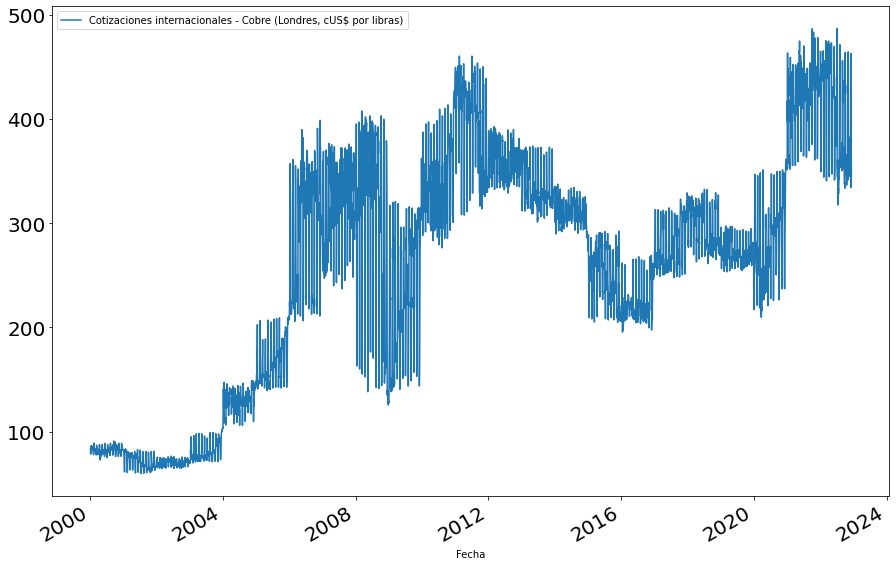

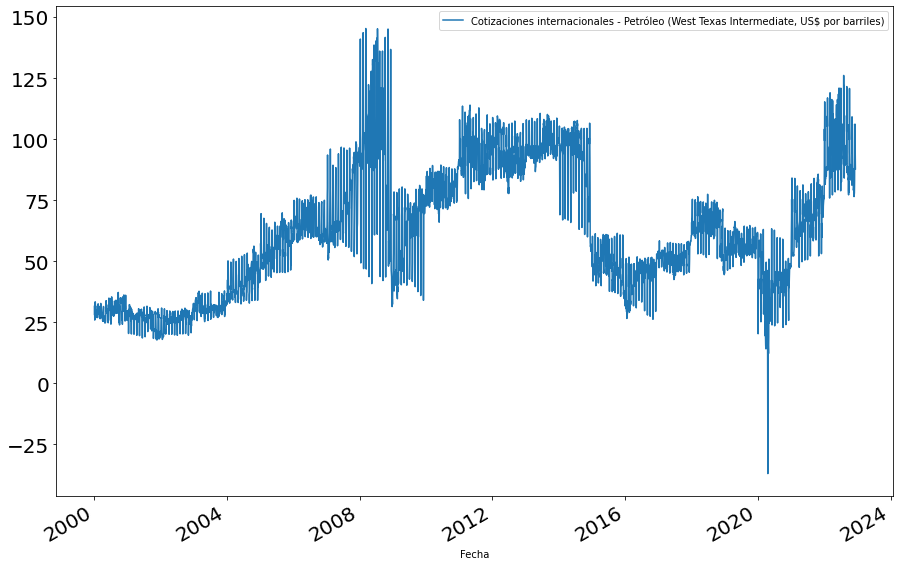

In [264]:
for i in range(2):
    df_time_seriesdiaria = data_diaria_p3.iloc[:,[i]] 
    fig = df_time_seriesdiaria.plot(figsize=(15, 10), fontsize=20, legend=dict_aux).get_figure()


In [266]:
data_cobre = data_diaria_p3.iloc[:,[0]]
data_oil = data_diaria_p3.iloc[:,[1]]


In [269]:
df_aux = data_cobre.reset_index()
df_aux = df_aux.drop(columns=['Fecha'])
df_    = df_aux.iloc[:,0].copy('deep')

# Definimos el tipo de estacionalidad (diaria : 7)
seasonal_order = (1, 1, 1, 7)

df_fct_cobre = pd.DataFrame()
# p entre 0 y 6 y q entre 0 y 6

for p in range(0,6,1):
    for q in range(0,6,1):
        
        arima_order = (p, 1, q)
        # define model
        model = SARIMAX(data_cobre, 
                        order=arima_order,
                        seasonal_order=seasonal_order)
        
        # fit model
        model_fit = model.fit()
        
        # Forecast
        yhat = model_fit.forecast(2)
        
        # Append
        
        df_0 = pd.concat([df_, yhat],ignore_index=True)
        df_fct_cobre = pd.concat([df_fct_cobre, df_0], axis=1)
        

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\U

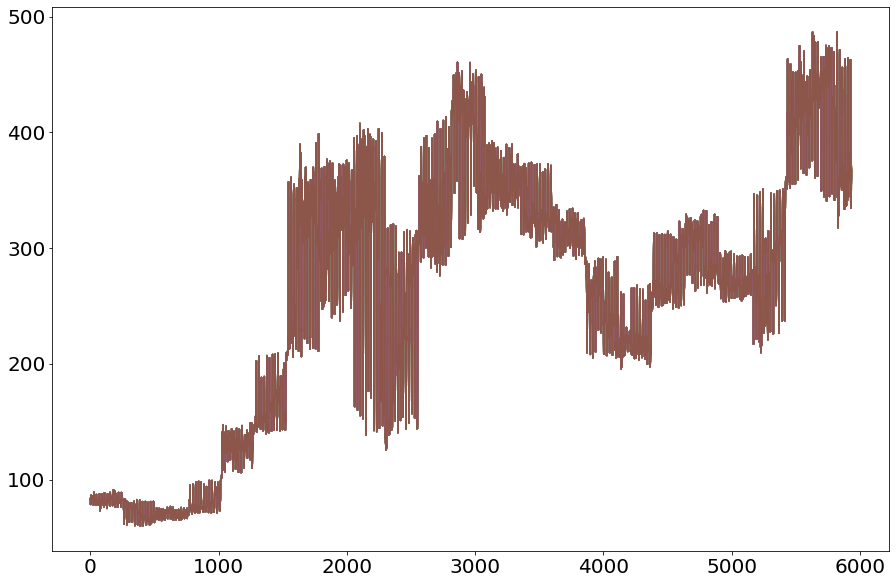

In [270]:
fig = df_fct_cobre.iloc[:,:].plot(figsize=(15, 10), fontsize=20, legend=False).get_figure()

In [ ]:
df_aux = data_oil.reset_index()
df_aux = df_aux.drop(columns=['Fecha'])
df_    = df_aux.iloc[:,0].copy('deep')

# Definimos el tipo de estacionalidad (diaria : 7)
seasonal_order = (1, 1, 1, 7)

df_fct_oil = pd.DataFrame()
# p entre 0 y 12 y q entre 0 y 7

for p in range(0,6,1):
    for q in range(0,6,1):
        
        arima_order = (p, 1, q)
        # define model
        model = SARIMAX(data_oil, 
                        order=arima_order,
                        seasonal_order=seasonal_order)
        
        # fit model
        model_fit = model.fit()
        
        # Forecast
        yhat = model_fit.forecast(2)
        
        # Append
        
        df_0 = pd.concat([df_, yhat],ignore_index=True)
        df_fct_oil = pd.concat([df_fct_cobre, df_0], axis=1)

In [ ]:
fig = df_fct_oil.iloc[:,:].plot(figsize=(15, 10), fontsize=20, legend=False).get_figure()

In [274]:
#Data de entrenamiento y de testeo Ecobre

n = len(data_cobre)
display(n)
train_count = round(n * 0.8)
train, test = model_selection.train_test_split(data_cobre, train_size=train_count)
display(len(test))

5932

1186

In [275]:
errorsrmse = []
errorsmape = []
models = []


##################


(1, 1, 1, 7)
# solo hasta 6, m=7
for p in range(0,6,1):
    for q in range(0,6,1):
      
        arima_order = (p, 1, q)
        # define model
        model = SARIMAX(train, order=arima_order, seasonal_order=seasonal_order)
        
        model.initialize_approximate_diffuse()
        # fit model
        model_fit = model.fit()
        
        # Forecast
        yhat = model_fit.forecast(1186)
         # Append
            
        rmse =  np.sqrt(mean_squared_error(test['Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)'], yhat))
        mape =  MAPE(test['Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)'], yhat)   
        
        # El modelo con parámetros p, q tiene puntuación
        print("Model p="  + str(p) + " and q = " + str(q) + "scores: ")
        print("RMSE")
        display(rmse)
        print("MAPE") 
        display(mape)
        

        errorsrmse.append(rmse)
        errorsmape.append(mape)
        models.append(model)
        
better_index = np.argmin(errorsrmse)  # type: int
better_index1 = np.argmin(errorsmape)  # type: int

print("MenorRMSE: {} (model {})".format(errorsrmse[better_index], better_index + 1))
print("MenorMAPE: {} (model {})".format(errorsmape[better_index], better_index + 1))
#con ctlf al valor numerico del RMSE y MAPE se obtiene el p, q respectivos
    

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=0 and q = 0scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


62.513604114649794

MAPE


16.2

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=0 and q = 1scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


62.299535450711666

MAPE


16.17

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=0 and q = 2scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


62.506887681793316

MAPE


15.94

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=0 and q = 3scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


62.75447829526979

MAPE


15.84

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=0 and q = 4scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


62.699979422981656

MAPE


15.86

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=0 and q = 5scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


62.67713017813477

MAPE


15.87

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=1 and q = 0scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


66.09976347777423

MAPE


16.71

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=1 and q = 1scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


62.58969665075321

MAPE


15.89

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=1 and q = 2scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


65.860664862985

MAPE


16.38

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=1 and q = 3scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


62.2387370952421

MAPE


15.82

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=1 and q = 4scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


63.91644075317737

MAPE


16.06

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=1 and q = 5scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


63.53601436485147

MAPE


16.0

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=2 and q = 0scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


64.32086419227487

MAPE


16.4

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=2 and q = 1scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


62.64456230185832

MAPE


15.88

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=2 and q = 2scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


70.47565869343185

MAPE


17.17

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=2 and q = 3scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


68.75864570712658

MAPE


16.87

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=2 and q = 4scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


70.2496232346111

MAPE


17.15

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=2 and q = 5scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


67.97955124727889

MAPE


16.71

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=3 and q = 0scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


64.48951649924787

MAPE


16.4

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=3 and q = 1scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


64.92204474774475

MAPE


16.21

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=3 and q = 2scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


67.18372761989131

MAPE


16.61

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=3 and q = 3scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


68.82321190769622

MAPE


16.92

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=3 and q = 4scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


59.594451485614755

MAPE


15.85

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=3 and q = 5scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


68.37730265413012

MAPE


16.78

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=4 and q = 0scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


64.41716100351749

MAPE


16.37

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=4 and q = 1scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


65.1978072215209

MAPE


16.25

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=4 and q = 2scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


65.57066523983724

MAPE


16.32

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=4 and q = 3scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


63.84711155788711

MAPE


16.02

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=4 and q = 4scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


64.12903660037628

MAPE


16.05

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=4 and q = 5scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


63.10130295823462

MAPE


15.93

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=5 and q = 0scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


64.46634049057705

MAPE


16.26

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=5 and q = 1scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


64.42192355769606

MAPE


16.11

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=5 and q = 2scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


68.76618717513409

MAPE


16.88

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=5 and q = 3scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


66.97355170402086

MAPE


16.56

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=5 and q = 4scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


67.01416284127633

MAPE


16.58

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=5 and q = 5scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


61.917846209374716

MAPE


16.18

MenorRMSE: 59.594451485614755 (model 23)
MenorMAPE: 15.85 (model 23)


Según las estimaciones teniendo en cuenta el menor MAPE/RMSE, habiendo fijado la terna $(P, D, Q)$ y $m=7$

$$ \text{Cobre}_t = c + \sum_{j=1}^{p=3}\phi_j\text{Cobre}_{t-j} + \varepsilon_t + \sum_{j=1}^{q=4}\theta_j\varepsilon_{t-j}.$$

In [277]:
#Data de entrenamiento y de testeo Ecobre

n = len(data_oil)
display(n)
train_count = round(n * 0.8)
train, test = model_selection.train_test_split(data_oil, train_size=train_count)
display(len(test))

5932

1186

In [278]:
errorsrmse = []
errorsmape = []
models = []


##################


(1, 1, 1, 7)
# solo hasta 6, m=7
for p in range(0,6,1):
    for q in range(0,6,1):
      
        arima_order = (p, 1, q)
        # define model
        model = SARIMAX(train, order=arima_order, seasonal_order=seasonal_order)
        
        model.initialize_approximate_diffuse()
        # fit model
        model_fit = model.fit()
        
        # Forecast
        yhat = model_fit.forecast(1186)
         # Append
            
        rmse =  np.sqrt(mean_squared_error(test['Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)'], yhat))
        mape =  MAPE(test['Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)'], yhat)   
        
        # El modelo con parámetros p, q tiene puntuación
        print("Model p="  + str(p) + " and q = " + str(q) + "scores: ")
        print("RMSE")
        display(rmse)
        print("MAPE") 
        display(mape)
        

        errorsrmse.append(rmse)
        errorsmape.append(mape)
        models.append(model)
        
better_index = np.argmin(errorsrmse)  # type: int
better_index1 = np.argmin(errorsmape)  # type: int

print("MenorRMSE: {} (model {})".format(errorsrmse[better_index], better_index + 1))
print("MenorMAPE: {} (model {})".format(errorsmape[better_index], better_index + 1))
#con ctlf al valor numerico del RMSE y MAPE se obtiene el p, q respectivos
    

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=0 and q = 0scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


22.977377218067993

MAPE


28.92

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=0 and q = 1scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


22.88956727059122

MAPE


28.81

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=0 and q = 2scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


22.31764305643113

MAPE


27.86

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=0 and q = 3scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.40730452044844

MAPE


26.35

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=0 and q = 4scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.31958407368401

MAPE


26.21

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=0 and q = 5scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.281553176110826

MAPE


26.15

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=1 and q = 0scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


22.860106518058718

MAPE


28.77

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=1 and q = 1scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.236871952134454

MAPE


26.07

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=1 and q = 2scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.262742845143197

MAPE


26.11

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=1 and q = 3scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.25997533218178

MAPE


26.11

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=1 and q = 4scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.28150415319413

MAPE


26.15

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=1 and q = 5scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.278413454983625

MAPE


26.14

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=2 and q = 0scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


23.07556560625209

MAPE


29.06

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=2 and q = 1scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.267221627945798

MAPE


26.12

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=2 and q = 2scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.500068124931982

MAPE


26.5

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=2 and q = 3scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.23854583087965

MAPE


26.08

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=2 and q = 4scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.275375955728883

MAPE


26.14

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=2 and q = 5scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.255794320462954

MAPE


26.11

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=3 and q = 0scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


22.951166422196433

MAPE


28.9

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=3 and q = 1scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.259934471818806

MAPE


26.11

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=3 and q = 2scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.259087926541678

MAPE


26.11

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=3 and q = 3scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.32170950550551

MAPE


26.22

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=3 and q = 4scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.168256543282773

MAPE


25.96

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=3 and q = 5scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.233080212867765

MAPE


26.07

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=4 and q = 0scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


22.949933308284656

MAPE


28.89

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=4 and q = 1scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.254528074816346

MAPE


26.1

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=4 and q = 2scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.272125323443216

MAPE


26.13

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=4 and q = 3scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.253119954656373

MAPE


26.1

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=4 and q = 4scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.367072201879942

MAPE


26.3

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=4 and q = 5scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.465755447496548

MAPE


26.45

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


Model p=5 and q = 0scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


22.387800086212426

MAPE


27.97

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=5 and q = 1scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.273261222680414

MAPE


26.13

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=5 and q = 2scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.285909194774348

MAPE


26.15

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=5 and q = 3scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.26448140274005

MAPE


26.12

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=5 and q = 4scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.465098545542084

MAPE


26.46

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\base\model.py:604: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization failed to "


Model p=5 and q = 5scores: 
RMSE


C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(


21.091333599146324

MAPE


25.8

MenorRMSE: 21.091333599146324 (model 36)
MenorMAPE: 25.8 (model 36)


Según las estimaciones teniendo en cuenta el menor MAPE/RMSE, habiendo fijado la terna $(P, D, Q)$ y $m=7$

$$ \text{Oil}_t = c + \sum_{j=1}^{p=5}\phi_j\text{Oil}_{t-j} + \varepsilon_t + \sum_{j=1}^{q=5}\theta_j\varepsilon_{t-j}.$$

In [279]:
# Finding the best SARIMA model para el cobre
autoarima = pmd.auto_arima(
        y = data_cobre ,
        start_p=1,
        start_q=0,
        seasonal=True,
        max_p=12,
        max_d=1,
        max_q=6,
        max_P=12,
        max_D=1,
        max_Q=6,
        m=4,
        n_jobs=-1,
        suppress_warnings=True,
        )

display(autoarima.order)
display(autoarima.seasonal_order)

(3, 1, 3)

(2, 0, 6, 4)

In [282]:
# Finding the best SARIMA model para el petroleo
autoarima = pmd.auto_arima(
        y = data_oil ,
        start_p=1,
        start_q=0,
        seasonal=True,
        max_p=12,
        max_d=1,
        max_q=6,
        max_P=12,
        max_D=1,
        max_Q=6,
        m=4,
        n_jobs=-1,
        suppress_warnings=True,
        )

display(autoarima.order)
display(autoarima.seasonal_order)

(3, 1, 3)

(5, 0, 5, 4)

## ETS cobre

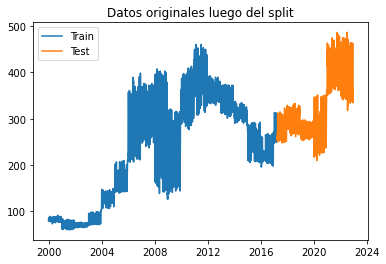

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(



== Simple Exponential Smoothing 


Smoothing Level 0.8473
Initial Level 82.7442

For alpha = 0.85,  RMSE is 92.8851 MAPE is 20.31


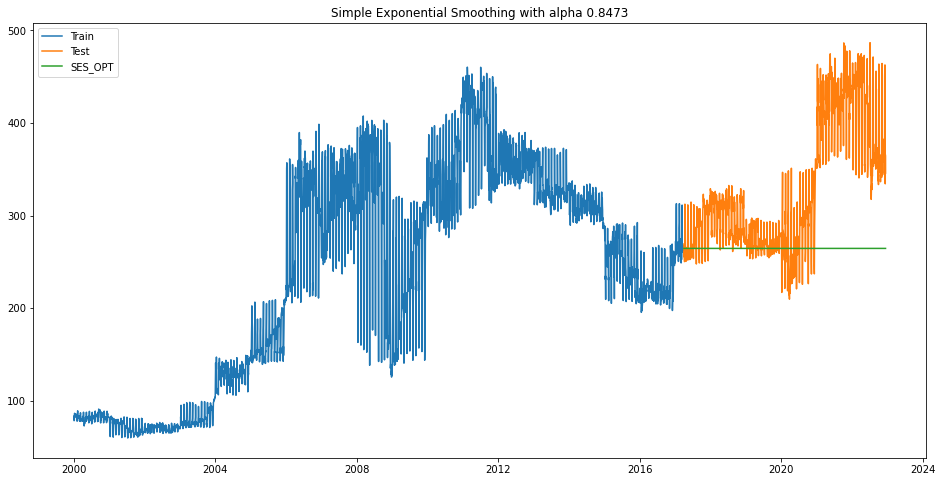

             4449        4450        4451        4452        4453
Y_hat  264.582165  264.582165  264.582165  264.582165  264.582165
Y      269.343152  263.809325  255.327148  260.940353  250.292272


In [284]:
n = len(data_cobre)
train_count = round(n * 0.75)
train = data_cobre.iloc[:train_count]
test =  data_cobre.iloc[train_count + 1:n]


#fig = plt.figure()
plt.plot(train.index, train['Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)'], label='Train')
plt.plot(test.index, test['Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)'], label='Test')
# Grafico la parte de entrenamiento y la de test
plt.legend(loc = 'best')
plt.title('Datos originales luego del split')
plt.show()

pred_opt   =  SimpleExpSmoothing(train['Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)']).fit(optimized = True)


print('')
print('== Simple Exponential Smoothing ')
print('')

print('')
# redondeo a 4 unidades
print('Smoothing Level', np.round(pred_opt.params['smoothing_level'], 4))
print('Initial Level',   np.round(pred_opt.params['initial_level'], 4))
print('')

#len(test)=47 
y_pred_opt           = pred_opt.forecast(steps =1482)
df_pred_opt          = pd.DataFrame({'Y_hat':y_pred_opt,'Y':test['Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)'].values})

rmse_opt             =  np.sqrt(mean_squared_error(test['Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)'], y_pred_opt))
mape_opt             =  MAPE(test['Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)'], y_pred_opt)

alpha_value          = np.round(pred_opt.params['smoothing_level'], 4)

print("For alpha = %1.2f,  RMSE is %3.4f MAPE is %3.2f" %(alpha_value, rmse_opt, mape_opt))
plt.figure(figsize=(16,8))
plt.plot(train.index, train['Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)'], label = 'Train')
plt.plot(test.index, test['Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)'],  label = 'Test')
plt.plot(test.index, y_pred_opt,           label = 'SES_OPT')
plt.title('Simple Exponential Smoothing with alpha ' + str(alpha_value))
plt.legend(loc='best') 
plt.show()

print(df_pred_opt.head().T)


==Holt model Exponential Smoothing Parameters ==

Smoothing Level 0.83
Smoothing Trend 0.0213
Initial Level 83.4837



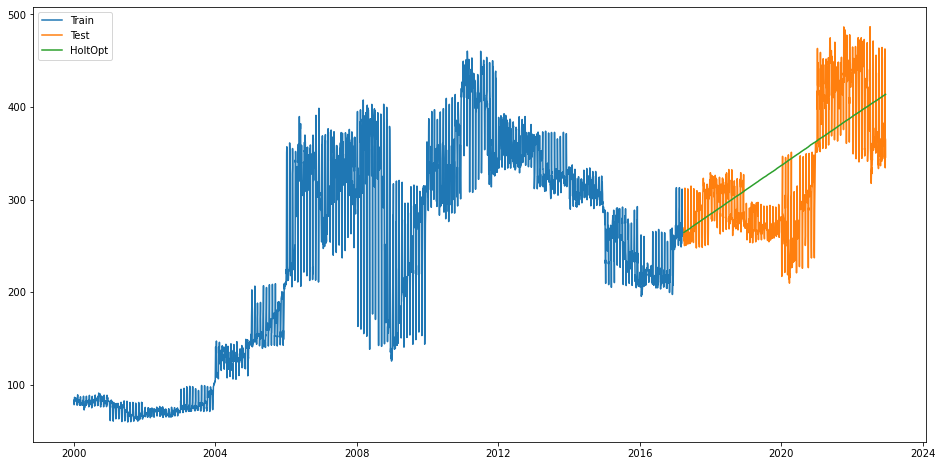

For alpha = 0.83,  RMSE is 51.5357 MAPE is 13.52
{'smoothing_level': 0.83, 'smoothing_trend': 0.02128205128205128, 'smoothing_seasonal': nan, 'damping_trend': nan, 'initial_level': 83.4836756927735, 'initial_trend': -4.8761179771655065, 'initial_seasons': array([], dtype=float64), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


In [285]:
# optimizamos usando la metodologia Holt linear trend


model_fit = Holt(np.asarray(train['Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)'])).fit()

#model_fit = model.fit()

print('')
print('==Holt model Exponential Smoothing Parameters ==')
print('')
alpha_value = np.round(model_fit.params['smoothing_level'], 4)
print('Smoothing Level', alpha_value )
beta_value= np.round(model_fit.params['smoothing_trend'], 4)
print('Smoothing Trend', beta_value)
print('Initial Level',   np.round(model_fit.params['initial_level'], 4))
print('')



Pred_Holt = test.copy()

Pred_Holt['Opt'] = model_fit.forecast(len(test['Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)']))
plt.figure(figsize=(16,8))
plt.plot(train['Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)'], label='Train')
plt.plot(test['Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)'], label='Test')
plt.plot(Pred_Holt['Opt'], label='HoltOpt')
plt.legend(loc='best')
plt.show()


df_pred_opt =  pd.DataFrame({'Y_hat':Pred_Holt['Opt'] ,'Y':test['Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)'].values})
rmse_opt =  np.sqrt(mean_squared_error(df_pred_opt.Y, df_pred_opt.Y_hat))
mape_opt =  MAPE(df_pred_opt.Y, df_pred_opt.Y_hat)

print("For alpha = %1.2f,  RMSE is %3.4f MAPE is %3.2f" %(alpha_value, rmse_opt, mape_opt))

print(model_fit.params)

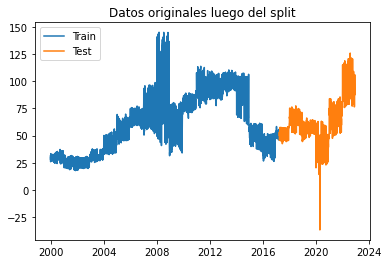

C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:471: ValueWarning: A date index has been provided, but it has no associated frequency information and so will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)
C:\Users\marce\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:834: ValueWarning: No supported index is available. Prediction results will be given with an integer index beginning at `start`.
  return get_prediction_index(



== Simple Exponential Smoothing 


Smoothing Level 0.8597
Initial Level 28.6134

For alpha = 0.86,  RMSE is 24.4106 MAPE is 29.10


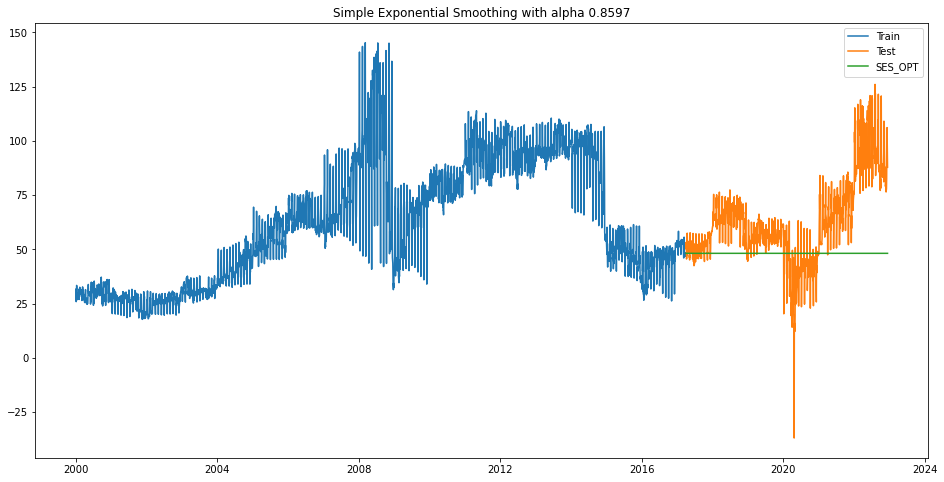

            4449       4450       4451       4452       4453
Y_hat  48.176808  48.176808  48.176808  48.176808  48.176808
Y      50.300000  50.540000  53.260000  50.990000  45.550000


In [287]:
n = len(data_oil)
train_count = round(n * 0.75)
train = data_oil.iloc[:train_count]
test =  data_oil.iloc[train_count + 1:n]


#fig = plt.figure()
plt.plot(train.index, train['Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)'], label='Train')
plt.plot(test.index, test['Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)'], label='Test')
# Grafico la parte de entrenamiento y la de test
plt.legend(loc = 'best')
plt.title('Datos originales luego del split')
plt.show()

pred_opt   =  SimpleExpSmoothing(train['Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)']).fit(optimized = True)


print('')
print('== Simple Exponential Smoothing ')
print('')

print('')
# redondeo a 4 unidades
print('Smoothing Level', np.round(pred_opt.params['smoothing_level'], 4))
print('Initial Level',   np.round(pred_opt.params['initial_level'], 4))
print('')

#len(test)=47 
y_pred_opt           = pred_opt.forecast(steps =1482)
df_pred_opt          = pd.DataFrame({'Y_hat':y_pred_opt,'Y':test['Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)'].values})

rmse_opt             =  np.sqrt(mean_squared_error(test['Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)'], y_pred_opt))
mape_opt             =  MAPE(test['Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)'], y_pred_opt)

alpha_value          = np.round(pred_opt.params['smoothing_level'], 4)

print("For alpha = %1.2f,  RMSE is %3.4f MAPE is %3.2f" %(alpha_value, rmse_opt, mape_opt))
plt.figure(figsize=(16,8))
plt.plot(train.index, train['Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)'], label = 'Train')
plt.plot(test.index, test['Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)'],  label = 'Test')
plt.plot(test.index, y_pred_opt,           label = 'SES_OPT')
plt.title('Simple Exponential Smoothing with alpha ' + str(alpha_value))
plt.legend(loc='best') 
plt.show()

print(df_pred_opt.head().T)


==Holt model Exponential Smoothing Parameters ==

Smoothing Level 0.8512
Smoothing Trend 0.0194
Initial Level 28.255



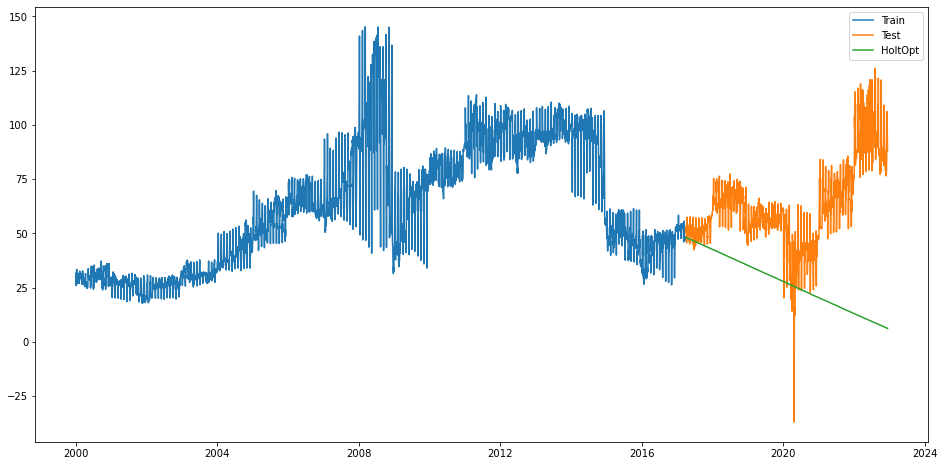

For alpha = 0.85,  RMSE is 45.2074 MAPE is 57.39
{'smoothing_level': 0.851163881711746, 'smoothing_trend': 0.019400033755377216, 'smoothing_seasonal': nan, 'damping_trend': nan, 'initial_level': 28.255044823043093, 'initial_trend': -1.6274202126917947, 'initial_seasons': array([], dtype=float64), 'use_boxcox': False, 'lamda': None, 'remove_bias': False}


In [288]:
# optimizamos usando la metodologia Holt linear trend


model_fit = Holt(np.asarray(train['Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)'])).fit()

#model_fit = model.fit()

print('')
print('==Holt model Exponential Smoothing Parameters ==')
print('')
alpha_value = np.round(model_fit.params['smoothing_level'], 4)
print('Smoothing Level', alpha_value )
beta_value= np.round(model_fit.params['smoothing_trend'], 4)
print('Smoothing Trend', beta_value)
print('Initial Level',   np.round(model_fit.params['initial_level'], 4))
print('')



Pred_Holt = test.copy()

Pred_Holt['Opt'] = model_fit.forecast(len(test['Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)']))
plt.figure(figsize=(16,8))
plt.plot(train['Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)'], label='Train')
plt.plot(test['Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)'], label='Test')
plt.plot(Pred_Holt['Opt'], label='HoltOpt')
plt.legend(loc='best')
plt.show()


df_pred_opt =  pd.DataFrame({'Y_hat':Pred_Holt['Opt'] ,'Y':test['Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)'].values})
rmse_opt =  np.sqrt(mean_squared_error(df_pred_opt.Y, df_pred_opt.Y_hat))
mape_opt =  MAPE(df_pred_opt.Y, df_pred_opt.Y_hat)

print("For alpha = %1.2f,  RMSE is %3.4f MAPE is %3.2f" %(alpha_value, rmse_opt, mape_opt))

print(model_fit.params)

# Pregunta 3

A partir de la pregunta 2, se ha concluido, teniendo en cuenta las limitaciones de las simulaciones (valores de $p, q$ etc) lo siguiente: 


Series mensuales:

- Exportaciones por departamento: ARIMA$(0, 1, 1)(2, 0, 2, 4)$, ETS simple $\hat{\alpha}= 0.5345$ y $\hat{\ell}_0 = 1260.3525$. 

- PBI: ARIMA$(2, 1, 1)(3, 0, 3, 4)$, ETS simple $\hat{\alpha}=0.3338$ y $\hat{\ell}_0 = 82.6063$.


Series trimestrales:

- Venta energía: ARIMA$(1, 0, 0)(0, 0, 0, 4)$ y ETS simple con $\hat{\alpha}=0.995$ y $\hat{\ell}_0 = 4805.392$.

- Producción energía: ARIMA$(1, 0, 0)(0, 0, 0, 4)$ y ETS simple con $\hat{\alpha}=0.995$ y $\hat{\ell}_0 =6204.7792$.

Series diarias

- Cobre: ARIMA(3, 1, 3)(2, 0, 6, 4) y  Holt tendencia lineal con $\hat{\alpha}=0.83$, $\hat{\beta}=0.0213$ y $\hat{\ell}_0 = 83.4837$.

- Oil: ARIMA(3, 1, 3)(5, 0, 5, 4) y ETS simple con $\hat{\alpha}=0.8597$ y $\hat{\ell}_0 = 28.6134$.

Para los modelos seleccionados en la pregunta 2, genere una predicción de la distribución usando el método de Bootstrap discutido en clase. Genere por lo menos 1,000 sendas diferentes y grafique los percentiles 10,20,30,40,50 (mediana).



Es importante diferenciar entre la predicción por intervalos, la cual asume normalidad en los residuos, y el método que vamos a usar. El primero, establece que el IC de confianza, a cierto nivel, para un forecast $h$ pasos en el futuro es

$$ \hat{y}_{T+h|T} \pm c \hat{\sigma}_h$$

donde $c$ es una constante que depende del nivel de confianza y 

$$\hat{\sigma}_h = f_h\left( \frac{1}{T-K-M} \sum_{t=1}^{T}e_t^2\right)$$
    
con $K$ el número de prámetros estimaods y $M$ el número de n.a. en los residuos.  }


Ahora, el método que nos interesa es el $\textbf{Prediction intervals from bootstrapped residuals}$.

https://otexts.com/fpp3/prediction-intervals.html


Un error de predicción de un paso $e_t$ está dado por

$e_t = y_t-\hat{y}_{t|t-1}.$

Por ende,

$y_t=\hat{y}_{t|t-1}+e_t .$

Podemos así simular la siguiente observación de la siguiente manera

$y_{T+1} = \hat{y}_{T+1|T}+e_{T+1}.$

No obstante, no conocemos $e_{T+1}$. Sin embargo, podemos reemplazar $e_{T+1}$ por un error en $\{e_1, ..., e_T\}$ (escogido aleatoriamente), y de este modo sucesivamente.


Observación adicional: vamos a considerar $\{y_1, ..., y_T\}$ no hasta $T = \sup\{t_{disponibles}\}$, pero hasta $T=\sup\{t_{train}\}$. Esto pues, se quiere no solamente plotear el forecast, pero también data real, para así ver el perfor
mance de nuestro modelo.

De este modo, se fitea el modelo usando la data tain. Luego, se predice $h$ pasos adelante siendo $h = len(test)$. Estos valores se guardan en forecast. Se calculan los residuos. Luego se aplica el bootstrap escogiendo residuos aleatoriamente y se ejecuta el forecast (1000 veces). Finalmente, los percentiles se grafican, indicando la distribución.

In [401]:
display(data_exportaciones)
display(pbi)
display(data_venta)
display(data_produccion)
display(data_cobre)
display(data_oil)


,Exportaciones por Departamento (Valores FOB en millones de US$) - Total
Fecha,
2005-01-01,1260.352460
2005-02-01,1133.709115
2005-03-01,1343.020060
2005-04-01,1253.014325
2005-05-01,1349.999845
...,...
2020-06-01,2910.042383
2020-07-01,3706.534050
2020-08-01,3643.429016


,Producto bruto interno y demanda interna (índice 2007=100) - PBI
Fecha,
2005-01-01,79.979161
2005-02-01,80.134460
2005-03-01,81.396413
2005-04-01,87.073447
2005-05-01,92.141455
...,...
2020-06-01,139.338017
2020-07-01,153.762995
2020-08-01,156.724587


,Venta de energía eléctrica por departamento - Total (gwh)
Fecha,
T1.04,4805.392031
T2.04,4884.910355
T3.04,4912.572435
T4.04,5052.286200
T1.05,5011.985074
...,...
T4.20,3848.828329
T1.21,3848.828329
T2.21,3848.828329


,Producción de electricidad por departamento - Total (gwh)
Fecha,
T1.04,6204.779219
T2.04,6204.779219
T3.04,6204.779219
T4.04,6204.779219
T1.05,6204.779219
...,...
T4.20,4892.713096
T1.21,4931.805628
T2.21,4700.398841


,"Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)"
Fecha,
2000-01-02,83.483676
2000-01-03,78.607558
2000-01-05,78.698276
2000-01-06,78.698276
2000-01-08,83.778511
...,...
2022-12-05,409.072279
2022-12-07,334.320256
2022-12-08,365.822246


,"Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)"
Fecha,
2000-01-02,28.22
2000-01-03,31.77
2000-01-05,25.89
2000-01-06,30.14
2000-01-08,27.79
...,...
2022-12-05,106.15
2022-12-07,97.69
2022-12-08,94.86


In [325]:

#Verifico que no existan n.a. en las bases de datos finales, esto se anticipaba pues se completaron con metodos fillna()
"""
data_exportaciones.isnull().sum()
pbi.isnull().sum()
venta_energia.isnull().sum()
produccion_energia.isnull().sum()
data_cobre.isnull().sum()
data_oil.isnull().sum()
"""

Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)    0
dtype: int64

## ARIMA fits

Se va a realizar el procedimiento descrito previamente, usando CV simple para entrenar y testear la data. 

## Exportaciones 

190
142


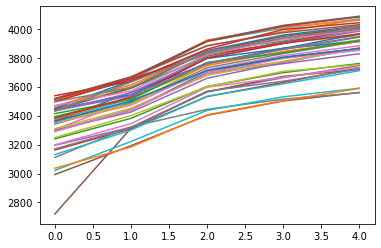

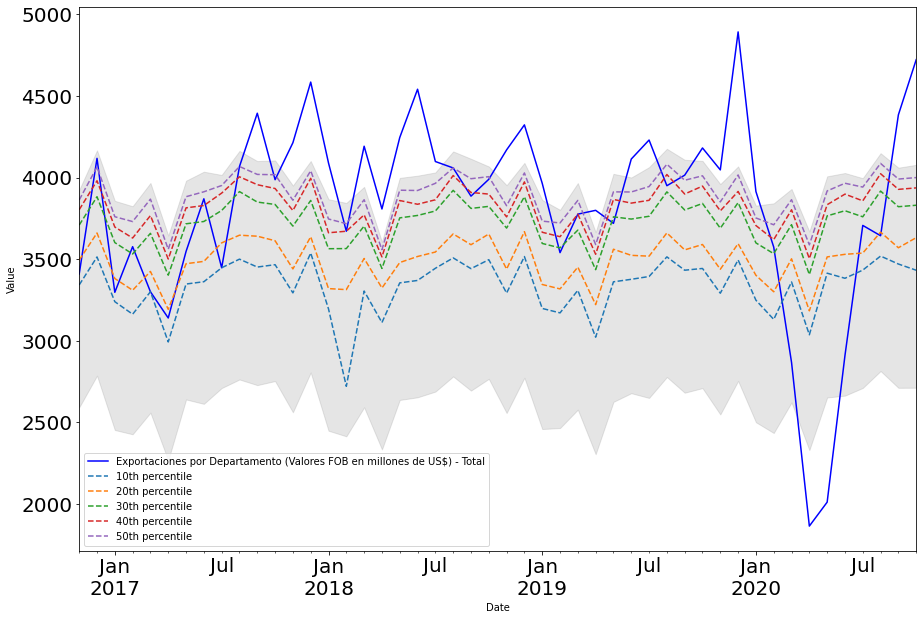

In [351]:
# training data y data original

n = len(data_exportaciones)
train_count = round(n * 0.75)
train = data_exportaciones.iloc[:train_count]
valid = data_exportaciones.iloc[train_count :n]
print(n)
print(train_count)

# fit del modelo ARIMA(0, 1, 1)(2, 0, 2, 4)

model = SARIMAX(train,
                order=(0, 1, 1),
                seasonal_order=(2, 0, 2, 4),
                enforce_stationarity = False,
                enforce_invertibility = False)

model_fit = model.fit()

#  forecast para 48  steps
forecast_values = model_fit.get_forecast(steps=48)
predictions = forecast_values.predicted_mean

# extraigo los residuos
valid, predictions = valid.align(predictions, join='inner', axis=0)
residuals = valid.sub(predictions, axis=0)

# lista para bootrsrap forecast
bootstrap_forecasts = []

residuals_1d = residuals.values.reshape(-1)

# 1000 sendas
for i in range(1000):
    sample = np.random.choice(residuals_1d, size=len(residuals), replace=True)
    bootstrap_forecasts.append(predictions + sample)

# percentiles
percentiles = [10, 20, 30, 40, 50]
percentile_values = np.percentile(bootstrap_forecasts, percentiles, axis=0)

# plot  percentiles

plt.plot(percentile_values)
plt.show()

#print( valid )
#print(predictions)
#print(residuals)
percentile_df = pd.DataFrame(percentile_values.T, columns=percentiles, index=valid.index)

# Plot
ax = valid.plot(figsize=(15, 10), fontsize=20, color='b')

for p in percentiles:
    percentile_df[p].plot(ax=ax, label=f'{p}th percentile', linestyle='--')

lower_bound = predictions - 1.28 * (np.std(bootstrap_forecasts, axis=0))
upper_bound = predictions + 1.28 * (np.std(bootstrap_forecasts, axis=0))
ax.fill_between(percentile_df.index, lower_bound, upper_bound, color='gray', alpha=0.2)

ax.set_xlabel('Date')
ax.set_ylabel('Value')
plt.legend()

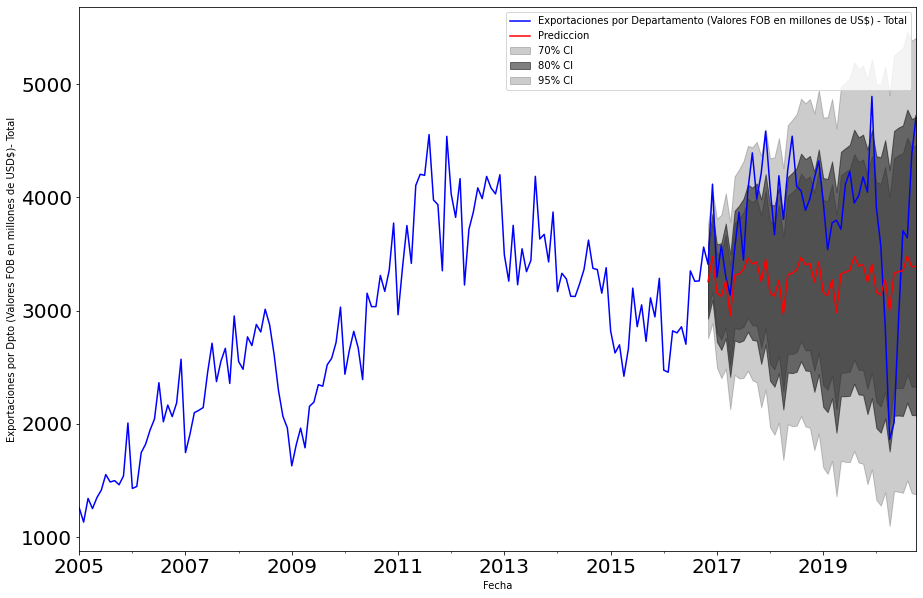

In [352]:

# para obtener IC segun el metodo usual y siguiendo el codigo del profesor

ax = data_exportaciones.plot(figsize=(15, 10), fontsize=20, color='b')
predictions.plot(ax=ax, label='Prediccion', color='r', alpha=1.0)



ax.fill_between(forecast_values.conf_int(alpha=0.30).index,
                forecast_values.conf_int(alpha=0.30).iloc[:, 0],
                forecast_values.conf_int(alpha=0.30).iloc[:, 1], color='k', alpha=.2, label='70% CI')


ax.fill_between(forecast_values.conf_int(alpha=0.20).index,
                forecast_values.conf_int(alpha=0.20).iloc[:, 0],
                forecast_values.conf_int(alpha=0.20).iloc[:, 1], color='k', alpha=.5, label='80% CI')

ax.fill_between(forecast_values.conf_int(alpha=0.05).index,
                forecast_values.conf_int(alpha=0.05).iloc[:, 0],
                forecast_values.conf_int(alpha=0.05).iloc[:, 1], color='k', alpha=.2, label='95% CI')



ax.set_xlabel('Fecha')
ax.set_ylabel('Exportaciones por Dpto (Valores FOB en millones de USD$)- Total')
plt.legend()

## PBI

190
142


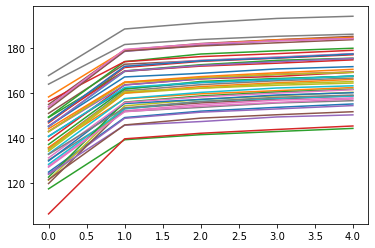

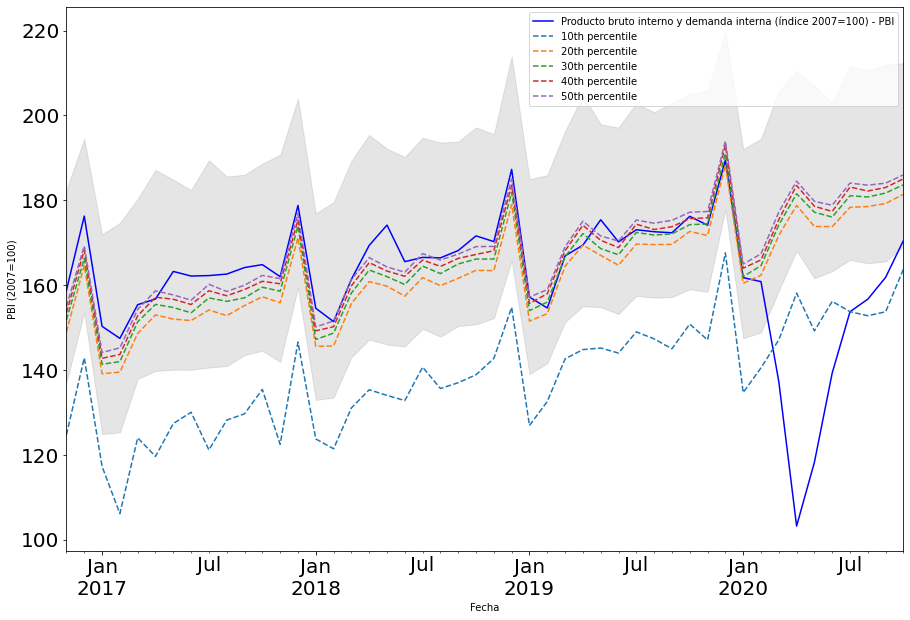

In [358]:
# training data y data original

n = len(pbi)
train_count = round(n * 0.75)
train = pbi.iloc[:train_count]
valid = pbi.iloc[train_count :n]
print(n)
print(train_count)

# fit del modelo ARIMA(2, 1, 1)(3, 0, 3, 4)

model = SARIMAX(train,
                order=(2, 1, 1),
                seasonal_order=(3, 0, 3, 4),
                enforce_stationarity = False,
                enforce_invertibility = False)

model_fit = model.fit()

#  forecast para 48  steps
forecast_values = model_fit.get_forecast(steps=48)
predictions = forecast_values.predicted_mean

# extraigo los residuos
valid, predictions = valid.align(predictions, join='inner', axis=0)
residuals = valid.sub(predictions, axis=0)

# lista para bootrsrap forecast
bootstrap_forecasts = []

residuals_1d = residuals.values.reshape(-1)

# 1000 sendas
for i in range(1000):
    sample = np.random.choice(residuals_1d, size=len(residuals), replace=True)
    bootstrap_forecasts.append(predictions + sample)

# percentiles
percentiles = [10, 20, 30, 40, 50]
percentile_values = np.percentile(bootstrap_forecasts, percentiles, axis=0)

# plot  percentiles

plt.plot(percentile_values)
plt.show()

#print( valid )
#print(predictions)
#print(residuals)
percentile_df = pd.DataFrame(percentile_values.T, columns=percentiles, index=valid.index)

# Plot
ax = valid.plot(figsize=(15, 10), fontsize=20, color='b')

for p in percentiles:
    percentile_df[p].plot(ax=ax, label=f'{p}th percentile', linestyle='--')

lower_bound = predictions - 1.28 * (np.std(bootstrap_forecasts, axis=0))
upper_bound = predictions + 1.28 * (np.std(bootstrap_forecasts, axis=0))
ax.fill_between(percentile_df.index, lower_bound, upper_bound, color='gray', alpha=0.2)


ax.set_xlabel('Fecha')
ax.set_ylabel('PBI (2007=100)')
plt.legend()

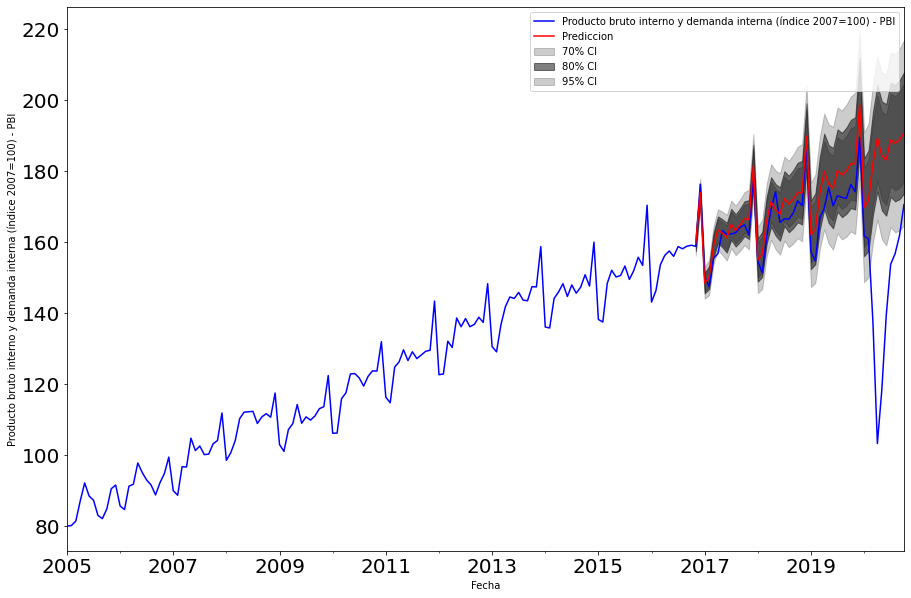

In [359]:

# para obtener IC segun el metodo usual y siguiendo el codigo del profesor

ax = pbi.plot(figsize=(15, 10), fontsize=20, color='b')
predictions.plot(ax=ax, label='Prediccion', color='r', alpha=1.0)



ax.fill_between(forecast_values.conf_int(alpha=0.30).index,
                forecast_values.conf_int(alpha=0.30).iloc[:, 0],
                forecast_values.conf_int(alpha=0.30).iloc[:, 1], color='k', alpha=.2, label='70% CI')


ax.fill_between(forecast_values.conf_int(alpha=0.20).index,
                forecast_values.conf_int(alpha=0.20).iloc[:, 0],
                forecast_values.conf_int(alpha=0.20).iloc[:, 1], color='k', alpha=.5, label='80% CI')

ax.fill_between(forecast_values.conf_int(alpha=0.05).index,
                forecast_values.conf_int(alpha=0.05).iloc[:, 0],
                forecast_values.conf_int(alpha=0.05).iloc[:, 1], color='k', alpha=.2, label='95% CI')



ax.set_xlabel('Fecha')
ax.set_ylabel('Producto bruto interno y demanda interna (índice 2007=100) - PBI')
plt.legend()

## Venta energía

In [402]:
display(data_venta)

,Venta de energía eléctrica por departamento - Total (gwh)
Fecha,
T1.04,4805.392031
T2.04,4884.910355
T3.04,4912.572435
T4.04,5052.286200
T1.05,5011.985074
...,...
T4.20,3848.828329
T1.21,3848.828329
T2.21,3848.828329


In [418]:
# para indexear
data_venta.to_csv('venta.csv')

In [424]:
venta_energia= pd.read_csv('venta.csv')
display(venta_energia)
venta_energia_final = venta_energia.loc[:, 'Venta de energía eléctrica por departamento - Total (gwh)']
display(venta_energia_final)

,Fecha,Venta de energía eléctrica por departamento - Total (gwh)
0,T1.04,4805.392031
1,T2.04,4884.910355
2,T3.04,4912.572435
3,T4.04,5052.286200
4,T1.05,5011.985074
...,...,...
67,T4.20,3848.828329
68,T1.21,3848.828329
69,T2.21,3848.828329
70,T3.21,3848.828329


0     4805.392031
1     4884.910355
2     4912.572435
3     5052.286200
4     5011.985074
         ...     
67    3848.828329
68    3848.828329
69    3848.828329
70    3848.828329
71    3848.828329
Name: Venta de energía eléctrica por departamento - Total (gwh), Length: 72, dtype: float64

72
54


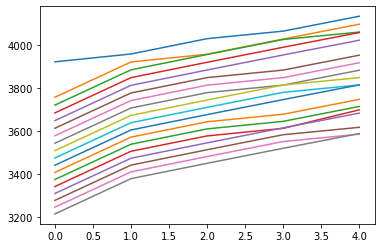

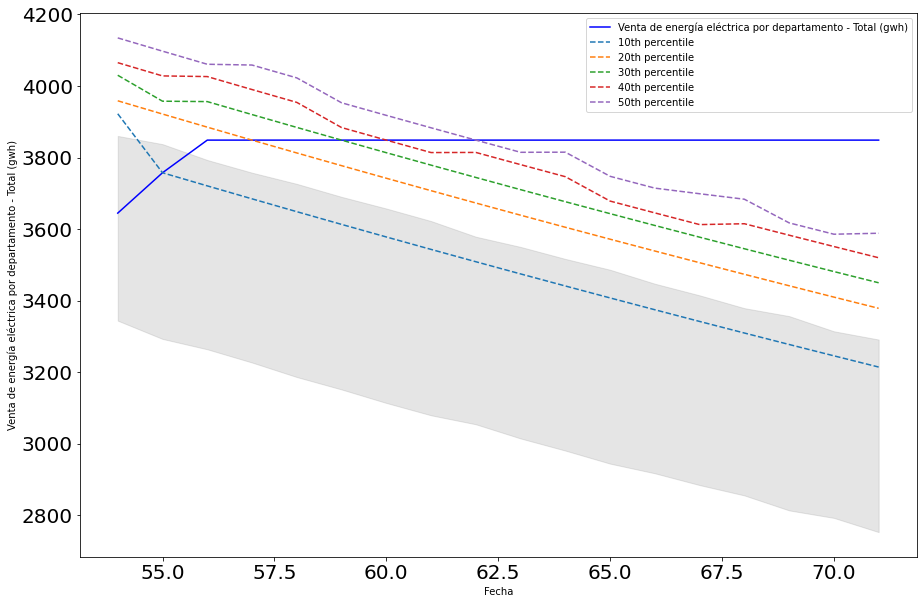

In [429]:
# training data y data original

n = len(venta_energia_final)
train_count = round(n * 0.75)
train = venta_energia_final.iloc[:train_count]
valid = venta_energia_final.iloc[train_count:n]
print(n)
print(train_count)

# fit del modelo ARIMA(1, 0, 0)(0, 0, 0, 4)

model = SARIMAX(train,
                order=(1, 0, 0),
                seasonal_order=(0, 0, 0, 4),
                enforce_stationarity = False,
                enforce_invertibility = False)

model_fit = model.fit()

#  forecast para 18  steps
forecast_values = model_fit.get_forecast(steps=18)
predictions = forecast_values.predicted_mean

# extraigo los residuos


valid, predictions = valid.align(predictions, join='inner', axis=0)

residuals = valid.sub(predictions, axis=0)

# lista para bootrsrap forecast
bootstrap_forecasts = []

residuals_1d = residuals.values.reshape(-1)

# 1000 sendas
for i in range(1000):
    sample = np.random.choice(residuals_1d, size=len(residuals), replace=True)
    bootstrap_forecasts.append(predictions + sample)

# percentiles
percentiles = [10, 20, 30, 40, 50]
percentile_values = np.percentile(bootstrap_forecasts, percentiles, axis=0)

# plot  percentiles

plt.plot(percentile_values)
plt.show()


percentile_df = pd.DataFrame(percentile_values.T, columns=percentiles, index=valid.index)

# Plot
ax = valid.plot(figsize=(15, 10), fontsize=20, color='b')

for p in percentiles:
    percentile_df[p].plot(ax=ax, label=f'{p}th percentile', linestyle='--')

lower_bound = predictions - 1.28 * (np.std(bootstrap_forecasts, axis=0))
upper_bound = predictions + 1.28 * (np.std(bootstrap_forecasts, axis=0))
ax.fill_between(percentile_df.index, lower_bound, upper_bound, color='gray', alpha=0.2)

ax.set_xlabel('Fecha')
ax.set_ylabel('Venta de energía eléctrica por departamento - Total (gwh)')
plt.legend()


Notemos que la data contiene el bfill y por ende la recta azul debe tomar con precuación.

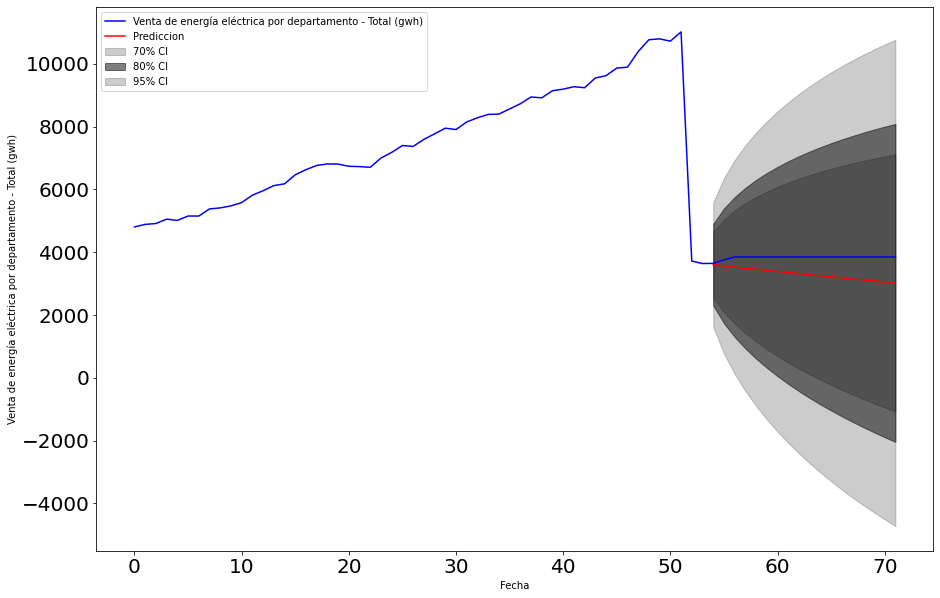

In [430]:

# para obtener IC segun el metodo usual y siguiendo el codigo del profesor

ax = venta_energia_final.plot(figsize=(15, 10), fontsize=20, color='b')
predictions.plot(ax=ax, label='Prediccion', color='r', alpha=1.0)



ax.fill_between(forecast_values.conf_int(alpha=0.30).index,
                forecast_values.conf_int(alpha=0.30).iloc[:, 0],
                forecast_values.conf_int(alpha=0.30).iloc[:, 1], color='k', alpha=.2, label='70% CI')


ax.fill_between(forecast_values.conf_int(alpha=0.20).index,
                forecast_values.conf_int(alpha=0.20).iloc[:, 0],
                forecast_values.conf_int(alpha=0.20).iloc[:, 1], color='k', alpha=.5, label='80% CI')

ax.fill_between(forecast_values.conf_int(alpha=0.05).index,
                forecast_values.conf_int(alpha=0.05).iloc[:, 0],
                forecast_values.conf_int(alpha=0.05).iloc[:, 1], color='k', alpha=.2, label='95% CI')



ax.set_xlabel('Fecha')
ax.set_ylabel('Venta de energía eléctrica por departamento - Total (gwh)')
plt.legend()

## Producción energía

In [431]:
display(data_produccion)

,Producción de electricidad por departamento - Total (gwh)
Fecha,
T1.04,6204.779219
T2.04,6204.779219
T3.04,6204.779219
T4.04,6204.779219
T1.05,6204.779219
...,...
T4.20,4892.713096
T1.21,4931.805628
T2.21,4700.398841


In [433]:
data_produccion.to_csv('produccion.csv')

In [435]:
produccion_energia= pd.read_csv('produccion.csv')
display(produccion_energia)
produccion_energia_final = produccion_energia.loc[:, 'Producción de electricidad por departamento - Total (gwh)']
display(produccion_energia_final)

,Fecha,Producción de electricidad por departamento - Total (gwh)
0,T1.04,6204.779219
1,T2.04,6204.779219
2,T3.04,6204.779219
3,T4.04,6204.779219
4,T1.05,6204.779219
...,...,...
67,T4.20,4892.713096
68,T1.21,4931.805628
69,T2.21,4700.398841
70,T3.21,4732.084868


0     6204.779219
1     6204.779219
2     6204.779219
3     6204.779219
4     6204.779219
         ...     
67    4892.713096
68    4931.805628
69    4700.398841
70    4732.084868
71    4990.963119
Name: Producción de electricidad por departamento - Total (gwh), Length: 72, dtype: float64

72
54


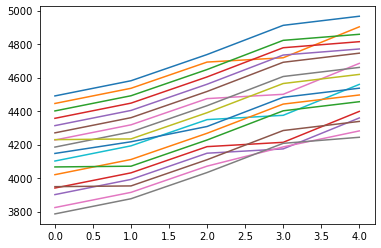

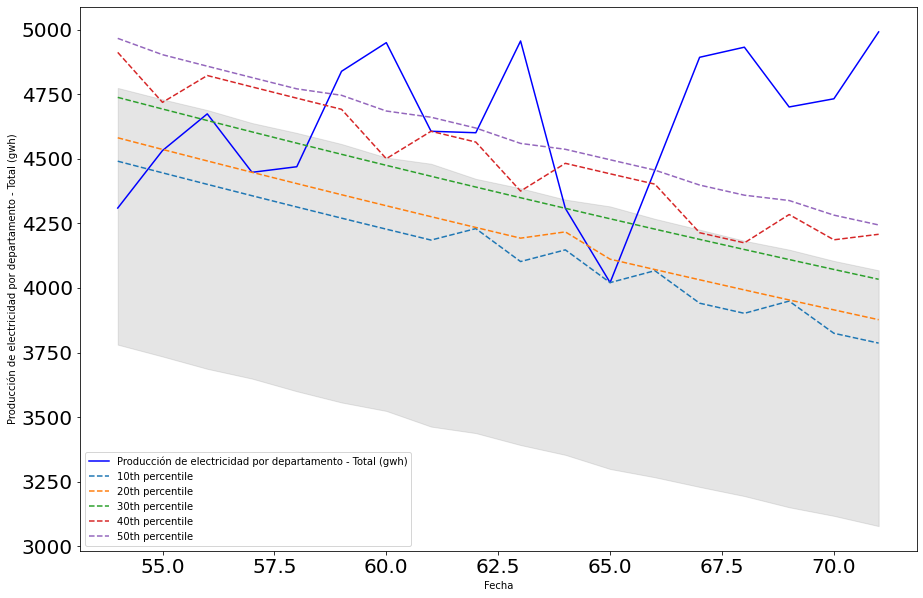

In [436]:
# training data y data original

n = len(produccion_energia_final)
train_count = round(n * 0.75)
train = produccion_energia_final.iloc[:train_count]
valid = produccion_energia_final.iloc[train_count:n]
print(n)
print(train_count)

# fit del modelo ARIMA(1, 0, 0)(0, 0, 0, 4)

model = SARIMAX(train,
                order=(1, 0, 0),
                seasonal_order=(0, 0, 0, 4),
                enforce_stationarity = False,
                enforce_invertibility = False)

model_fit = model.fit()

#  forecast para 18  steps
forecast_values = model_fit.get_forecast(steps=18)
predictions = forecast_values.predicted_mean

# extraigo los residuos


valid, predictions = valid.align(predictions, join='inner', axis=0)

residuals = valid.sub(predictions, axis=0)

# lista para bootrsrap forecast
bootstrap_forecasts = []

residuals_1d = residuals.values.reshape(-1)

# 1000 sendas
for i in range(1000):
    sample = np.random.choice(residuals_1d, size=len(residuals), replace=True)
    bootstrap_forecasts.append(predictions + sample)

# percentiles
percentiles = [10, 20, 30, 40, 50]
percentile_values = np.percentile(bootstrap_forecasts, percentiles, axis=0)

# plot  percentiles

plt.plot(percentile_values)
plt.show()


percentile_df = pd.DataFrame(percentile_values.T, columns=percentiles, index=valid.index)

# Plot
ax = valid.plot(figsize=(15, 10), fontsize=20, color='b')

for p in percentiles:
    percentile_df[p].plot(ax=ax, label=f'{p}th percentile', linestyle='--')

lower_bound = predictions - 1.28 * (np.std(bootstrap_forecasts, axis=0))
upper_bound = predictions + 1.28 * (np.std(bootstrap_forecasts, axis=0))
ax.fill_between(percentile_df.index, lower_bound, upper_bound, color='gray', alpha=0.2)

ax.set_xlabel('Fecha')
ax.set_ylabel('Producción de electricidad por departamento - Total (gwh)')
plt.legend()


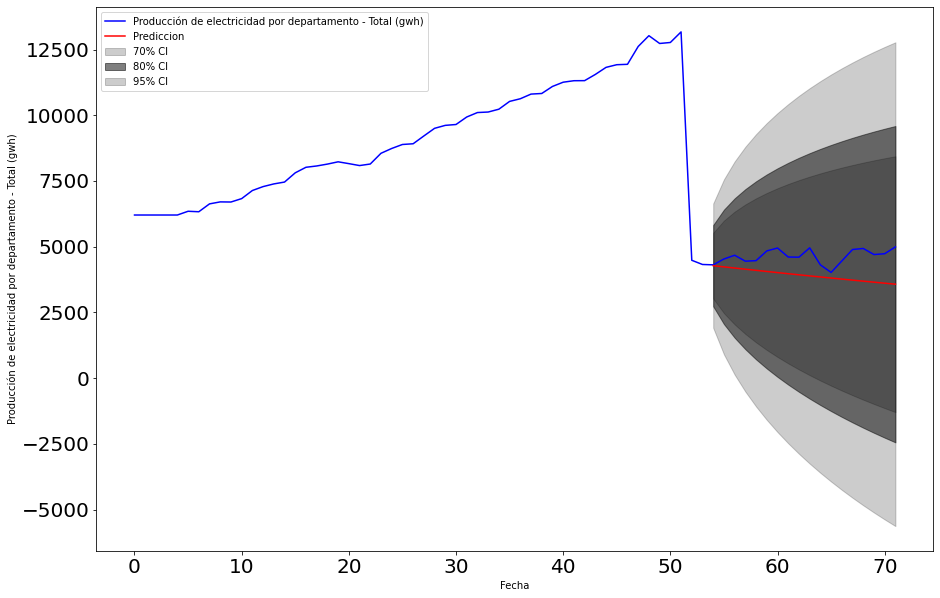

In [439]:

# para obtener IC segun el metodo usual y siguiendo el codigo del profesor

ax = produccion_energia_final.plot(figsize=(15, 10), fontsize=20, color='b')
predictions.plot(ax=ax, label='Prediccion', color='r', alpha=1.0)



ax.fill_between(forecast_values.conf_int(alpha=0.30).index,
                forecast_values.conf_int(alpha=0.30).iloc[:, 0],
                forecast_values.conf_int(alpha=0.30).iloc[:, 1], color='k', alpha=.2, label='70% CI')


ax.fill_between(forecast_values.conf_int(alpha=0.20).index,
                forecast_values.conf_int(alpha=0.20).iloc[:, 0],
                forecast_values.conf_int(alpha=0.20).iloc[:, 1], color='k', alpha=.5, label='80% CI')

ax.fill_between(forecast_values.conf_int(alpha=0.05).index,
                forecast_values.conf_int(alpha=0.05).iloc[:, 0],
                forecast_values.conf_int(alpha=0.05).iloc[:, 1], color='k', alpha=.2, label='95% CI')



ax.set_xlabel('Fecha')
ax.set_ylabel('Producción de electricidad por departamento - Total (gwh)')
plt.legend()

## Cobre 

In [448]:
# esto es para mandarlo nuevamente a csv y obtener index 1, 2...
display(data_cobre)
data_cobre.to_csv('cobre.csv')
datacobre= pd.read_csv('cobre.csv')
datacobre_final = datacobre.loc[:, 'Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)']
display(datacobre_final )

,"Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)"
Fecha,
2000-01-02,83.483676
2000-01-03,78.607558
2000-01-05,78.698276
2000-01-06,78.698276
2000-01-08,83.778511
...,...
2022-12-05,409.072279
2022-12-07,334.320256
2022-12-08,365.822246


0        83.483676
1        78.607558
2        78.698276
3        78.698276
4        83.778511
           ...    
5927    409.072279
5928    334.320256
5929    365.822246
5930    364.053236
5931    345.886862
Name: Cotizaciones internacionales - Cobre (Londres, cUS$ por libras), Length: 5932, dtype: float64

In [449]:
# training data y data original

n = len(datacobre_final )
train_count = round(n * 0.75)
train = datacobre_final.iloc[:train_count]
valid = datacobre_final.iloc[train_count :n]
print(n-train_count)


1483


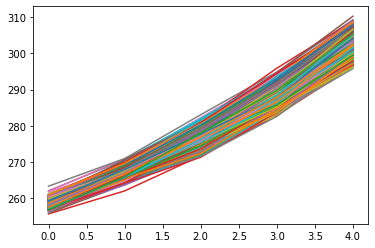

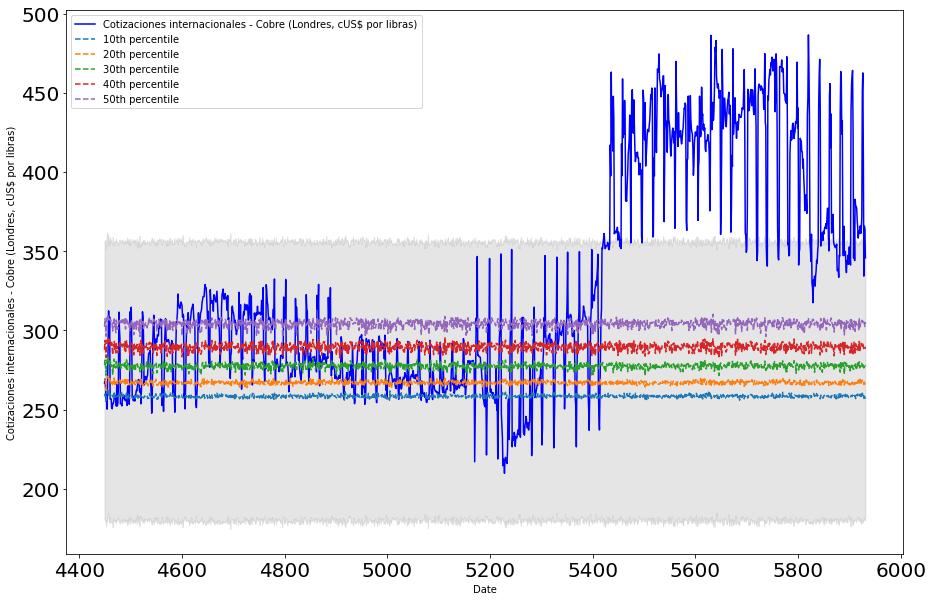

In [450]:

# fit del modelo ARIMA(3, 1, 3)(2, 0, 6, 4)

model = SARIMAX(train,
                order=(3, 1, 3),
                seasonal_order=(2, 0, 6, 4),
                enforce_stationarity = False,
                enforce_invertibility = False)

model_fit = model.fit()

#  forecast sobre el lapso del train para comparar
forecast_values = model_fit.get_forecast(steps=1483)
predictions = forecast_values.predicted_mean

# extraigo los residuos
valid, predictions = valid.align(predictions, join='inner', axis=0)
residuals = valid.sub(predictions, axis=0)

# lista para bootrsrap forecast
bootstrap_forecasts = []

residuals_1d = residuals.values.reshape(-1)

# 1000 sendas
for i in range(1000):
    sample = np.random.choice(residuals_1d, size=len(residuals), replace=True)
    bootstrap_forecasts.append(predictions + sample)

# percentiles
percentiles = [10, 20, 30, 40, 50]
percentile_values = np.percentile(bootstrap_forecasts, percentiles, axis=0)

# plot  percentiles

plt.plot(percentile_values)
plt.show()

#print( valid )
#print(predictions)
#print(residuals)
percentile_df = pd.DataFrame(percentile_values.T, columns=percentiles, index=valid.index)

# Plot
ax = valid.plot(figsize=(15, 10), fontsize=20, color='b')

for p in percentiles:
    percentile_df[p].plot(ax=ax, label=f'{p}th percentile', linestyle='--')

lower_bound = predictions - 1.28 * (np.std(bootstrap_forecasts, axis=0))
upper_bound = predictions + 1.28 * (np.std(bootstrap_forecasts, axis=0))
ax.fill_between(percentile_df.index, lower_bound, upper_bound, color='gray', alpha=0.2)

ax.set_xlabel('Date')
ax.set_ylabel('Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)')
3plt.legend()

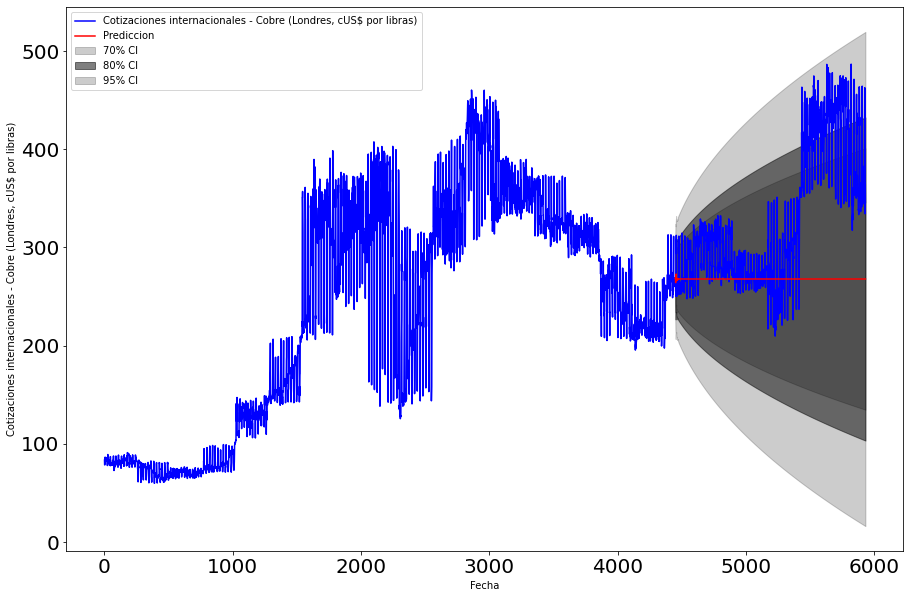

In [451]:

# para obtener IC segun el metodo usual y siguiendo el codigo del profesor
ax = datacobre_final.plot(figsize=(15, 10), fontsize=20, color='b')
predictions.plot(ax=ax, label='Prediccion', color='r', alpha=1.0)



ax.fill_between(forecast_values.conf_int(alpha=0.30).index,
                forecast_values.conf_int(alpha=0.30).iloc[:, 0],
                forecast_values.conf_int(alpha=0.30).iloc[:, 1], color='k', alpha=.2, label='70% CI')


ax.fill_between(forecast_values.conf_int(alpha=0.20).index,
                forecast_values.conf_int(alpha=0.20).iloc[:, 0],
                forecast_values.conf_int(alpha=0.20).iloc[:, 1], color='k', alpha=.5, label='80% CI')

ax.fill_between(forecast_values.conf_int(alpha=0.05).index,
                forecast_values.conf_int(alpha=0.05).iloc[:, 0],
                forecast_values.conf_int(alpha=0.05).iloc[:, 1], color='k', alpha=.2, label='95% CI')



ax.set_xlabel('Fecha')
ax.set_ylabel('Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)')
plt.legend()

In [452]:
display(data_oil)
data_oil.to_csv('oil.csv')
dataoil= pd.read_csv('oil.csv')
dataoil_final = dataoil.loc[:, 'Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)']
display(dataoil_final )

,"Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)"
Fecha,
2000-01-02,28.22
2000-01-03,31.77
2000-01-05,25.89
2000-01-06,30.14
2000-01-08,27.79
...,...
2022-12-05,106.15
2022-12-07,97.69
2022-12-08,94.86


0        28.22
1        31.77
2        25.89
3        30.14
4        27.79
         ...  
5927    106.15
5928     97.69
5929     94.86
5930     88.18
5931     87.83
Name: Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles), Length: 5932, dtype: float64

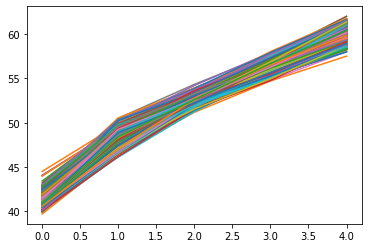

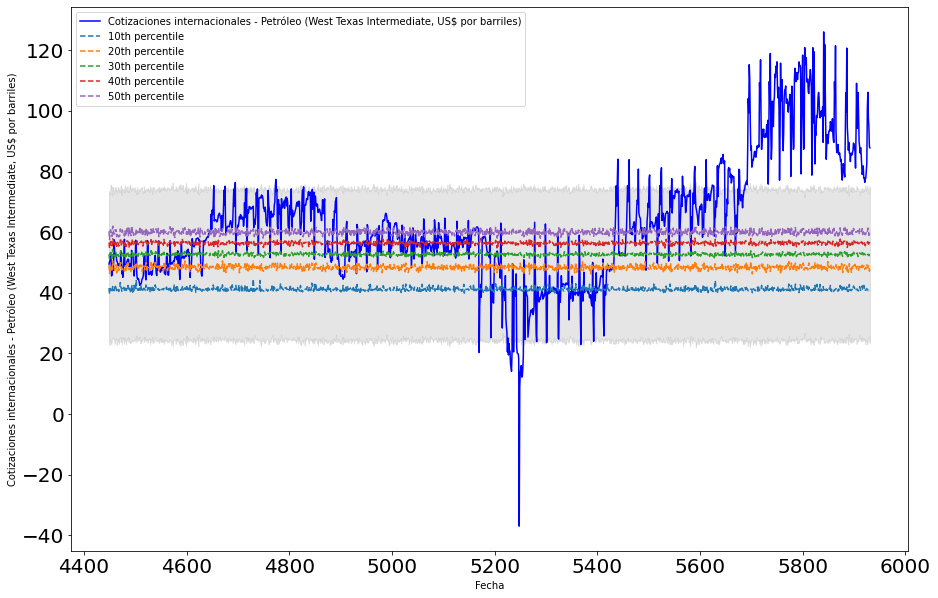

In [454]:
# training data y data original

n = len(dataoil_final )
train_count = round(n * 0.75)
train = dataoil_final.iloc[:train_count]
valid = dataoil_final.iloc[train_count :n]



# fit del modelo ARIMA(3, 1, 3)(5, 0, 5, 4)

model = SARIMAX(train,
                order=(3, 1, 3),
                seasonal_order=(5, 0, 5, 4),
                enforce_stationarity = False,
                enforce_invertibility = False)

model_fit = model.fit()

#  forecast sobre el lapso del train para comparar
forecast_values = model_fit.get_forecast(steps=1483)
predictions = forecast_values.predicted_mean

# extraigo los residuos
valid, predictions = valid.align(predictions, join='inner', axis=0)
residuals = valid.sub(predictions, axis=0)

# lista para bootrsrap forecast
bootstrap_forecasts = []

residuals_1d = residuals.values.reshape(-1)

# 1000 sendas
for i in range(1000):
    sample = np.random.choice(residuals_1d, size=len(residuals), replace=True)
    bootstrap_forecasts.append(predictions + sample)

# percentiles
percentiles = [10, 20, 30, 40, 50]
percentile_values = np.percentile(bootstrap_forecasts, percentiles, axis=0)

# plot  percentiles

plt.plot(percentile_values)
plt.show()

#print( valid )
#print(predictions)
#print(residuals)
percentile_df = pd.DataFrame(percentile_values.T, columns=percentiles, index=valid.index)

# Plot
ax = valid.plot(figsize=(15, 10), fontsize=20, color='b')

for p in percentiles:
    percentile_df[p].plot(ax=ax, label=f'{p}th percentile', linestyle='--')

lower_bound = predictions - 1.28 * (np.std(bootstrap_forecasts, axis=0))
upper_bound = predictions + 1.28 * (np.std(bootstrap_forecasts, axis=0))
ax.fill_between(percentile_df.index, lower_bound, upper_bound, color='gray', alpha=0.2)

ax.set_xlabel('Fecha')
ax.set_ylabel('Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)')
plt.legend()

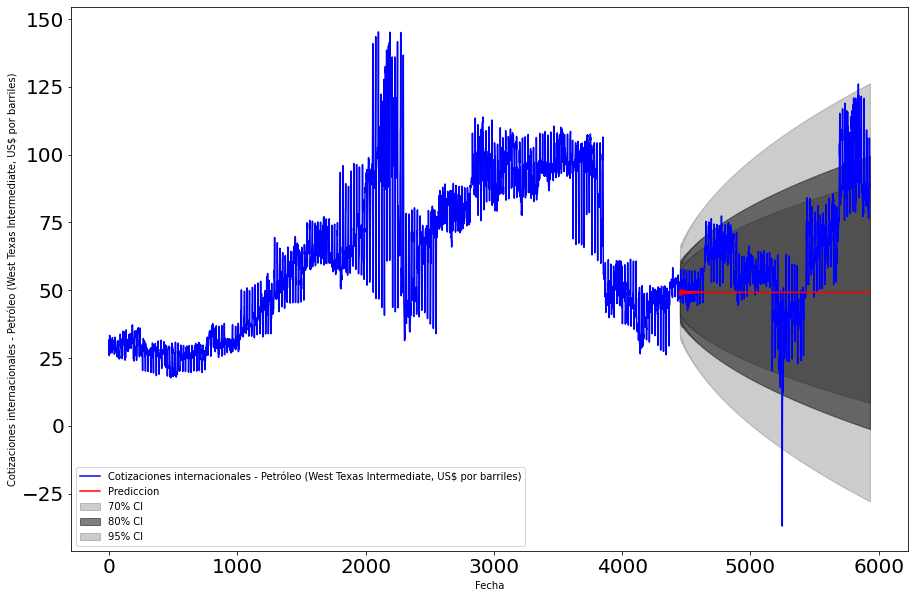

In [455]:

# para obtener IC segun el metodo usual y siguiendo el codigo del profesor
ax = dataoil_final.plot(figsize=(15, 10), fontsize=20, color='b')
predictions.plot(ax=ax, label='Prediccion', color='r', alpha=1.0)



ax.fill_between(forecast_values.conf_int(alpha=0.30).index,
                forecast_values.conf_int(alpha=0.30).iloc[:, 0],
                forecast_values.conf_int(alpha=0.30).iloc[:, 1], color='k', alpha=.2, label='70% CI')


ax.fill_between(forecast_values.conf_int(alpha=0.20).index,
                forecast_values.conf_int(alpha=0.20).iloc[:, 0],
                forecast_values.conf_int(alpha=0.20).iloc[:, 1], color='k', alpha=.5, label='80% CI')

ax.fill_between(forecast_values.conf_int(alpha=0.05).index,
                forecast_values.conf_int(alpha=0.05).iloc[:, 0],
                forecast_values.conf_int(alpha=0.05).iloc[:, 1], color='k', alpha=.2, label='95% CI')



ax.set_xlabel('Fecha')
ax.set_ylabel('Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)')
lt.legend()

## Exponential smoothing fits

## Exportaciones


El trabajo y código es análogo al de la estimación vía ARIMA. La única diferencia yace en reemplazar

model = SARIMAX(train,
                order=(3, 1, 3),
                seasonal_order=(5, 0, 5, 4),
                enforce_stationarity = False,
                enforce_invertibility = False)

por 


model = ExponentialSmoothing(data,
                              trend='add',
                              seasonal='add',
                              seasonal_periods=12,
                              damped=True,
                              smoothing_level=alpha,
                              smoothing_slope=beta,
                              smoothing_seasonal=gamma).fit()
                              
Como en general usaremos el ETS simple, en particular el comando es

model = ExponentialSmoothing(data,trend=None,seasonal=None,smoothing_level=alpha).fit()


In [471]:
display(data_exportaciones)
data_exportaciones.to_csv('exportaciones.csv')
dataexportaciones= pd.read_csv('exportaciones.csv')
dataexportaciones_final = dataexportaciones.loc[:, 'Exportaciones por Departamento (Valores FOB en millones de US$) - Total']
display(dataexportaciones_final)

,Exportaciones por Departamento (Valores FOB en millones de US$) - Total
Fecha,
2005-01-01,1260.352460
2005-02-01,1133.709115
2005-03-01,1343.020060
2005-04-01,1253.014325
2005-05-01,1349.999845
...,...
2020-06-01,2910.042383
2020-07-01,3706.534050
2020-08-01,3643.429016


0      1260.352460
1      1133.709115
2      1343.020060
3      1253.014325
4      1349.999845
          ...     
185    2910.042383
186    3706.534050
187    3643.429016
188    4383.913664
189    4721.556795
Name: Exportaciones por Departamento (Valores FOB en millones de US$) - Total, Length: 190, dtype: float64

In [480]:
# training data y data original

n = len(dataexportaciones_final)
train_count = round(n * 0.75)
train = dataexportaciones_final.iloc[:train_count]
valid = dataexportaciones_final.iloc[train_count :n]
display(n-train_count)

48

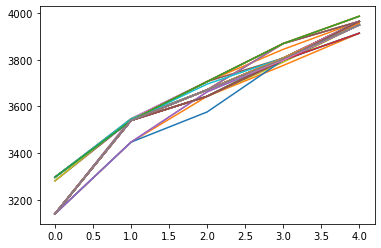

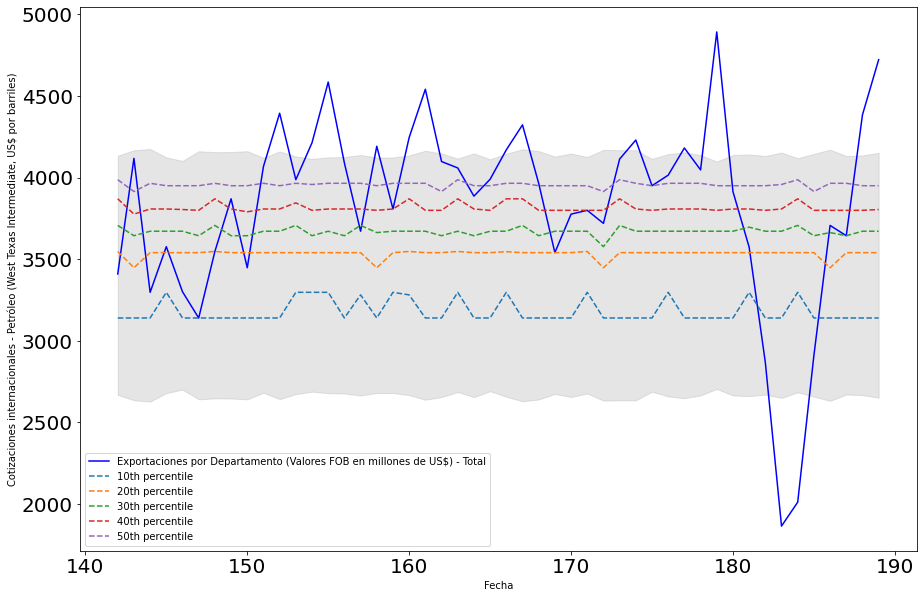

In [486]:

# fit ETS

model = SimpleExpSmoothing(train)

model_fit = model.fit(smoothing_level=0.53)

forecast_values = model_fit.forecast(steps=48)

#print(forecast_values)

predictions = forecast_values


# extraigo los residuos
valid, predictions = valid.align(predictions, join='inner', axis=0)
residuals = valid.sub(predictions, axis=0)

# lista para bootrsrap forecast
bootstrap_forecasts = []

residuals_1d = residuals.values.reshape(-1)

# 1000 sendas
for i in range(1000):
    sample = np.random.choice(residuals_1d, size=len(residuals), replace=True)
    bootstrap_forecasts.append(predictions + sample)

# percentiles
percentiles = [10, 20, 30, 40, 50]
percentile_values = np.percentile(bootstrap_forecasts, percentiles, axis=0)

# plot  percentiles

plt.plot(percentile_values)
plt.show()

#print( valid )
#print(predictions)
#print(residuals)
percentile_df = pd.DataFrame(percentile_values.T, columns=percentiles, index=valid.index)

# Plot
ax = valid.plot(figsize=(15, 10), fontsize=20, color='b')

for p in percentiles:
    percentile_df[p].plot(ax=ax, label=f'{p}th percentile', linestyle='--')

lower_bound = predictions - 1.28 * (np.std(bootstrap_forecasts, axis=0))
upper_bound = predictions + 1.28 * (np.std(bootstrap_forecasts, axis=0))
ax.fill_between(percentile_df.index, lower_bound, upper_bound, color='gray', alpha=0.2)

ax.set_xlabel('Fecha')
ax.set_ylabel('Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)')
plt.legend()

In [488]:
display(pbi)
pbi.to_csv('pbi.csv')
data_pbi= pd.read_csv('pbi.csv')
data_pbi_final = data_pbi.loc[:, 'Producto bruto interno y demanda interna (índice 2007=100) - PBI']
display(data_pbi_final)

,Producto bruto interno y demanda interna (índice 2007=100) - PBI
Fecha,
2005-01-01,79.979161
2005-02-01,80.134460
2005-03-01,81.396413
2005-04-01,87.073447
2005-05-01,92.141455
...,...
2020-06-01,139.338017
2020-07-01,153.762995
2020-08-01,156.724587


0       79.979161
1       80.134460
2       81.396413
3       87.073447
4       92.141455
          ...    
185    139.338017
186    153.762995
187    156.724587
188    161.866811
189    170.555237
Name: Producto bruto interno y demanda interna (índice 2007=100) - PBI, Length: 190, dtype: float64

In [489]:
# training data y data original

n = len(data_pbi_final)
train_count = round(n * 0.75)
train =data_pbi_final.iloc[:train_count]
valid = data_pbi_final.iloc[train_count :n]
display(n-train_count)

48

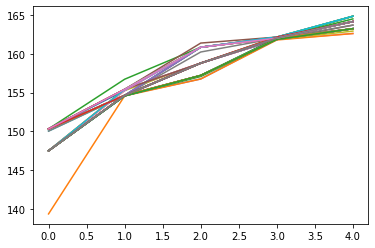

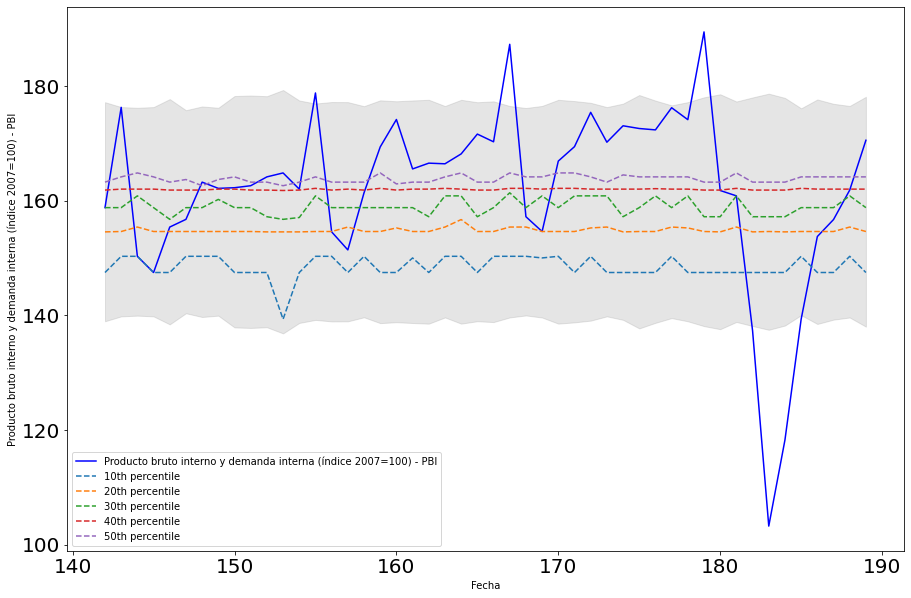

In [490]:

# fit ETS

model = SimpleExpSmoothing(train)

model_fit = model.fit(smoothing_level=0.333)

forecast_values = model_fit.forecast(steps=48)

#print(forecast_values)

predictions = forecast_values


# extraigo los residuos
valid, predictions = valid.align(predictions, join='inner', axis=0)
residuals = valid.sub(predictions, axis=0)

# lista para bootrsrap forecast
bootstrap_forecasts = []

residuals_1d = residuals.values.reshape(-1)

# 1000 sendas
for i in range(1000):
    sample = np.random.choice(residuals_1d, size=len(residuals), replace=True)
    bootstrap_forecasts.append(predictions + sample)

# percentiles
percentiles = [10, 20, 30, 40, 50]
percentile_values = np.percentile(bootstrap_forecasts, percentiles, axis=0)

# plot  percentiles

plt.plot(percentile_values)
plt.show()

#print( valid )
#print(predictions)
#print(residuals)
percentile_df = pd.DataFrame(percentile_values.T, columns=percentiles, index=valid.index)

# Plot
ax = valid.plot(figsize=(15, 10), fontsize=20, color='b')

for p in percentiles:
    percentile_df[p].plot(ax=ax, label=f'{p}th percentile', linestyle='--')

lower_bound = predictions - 1.28 * (np.std(bootstrap_forecasts, axis=0))
upper_bound = predictions + 1.28 * (np.std(bootstrap_forecasts, axis=0))
ax.fill_between(percentile_df.index, lower_bound, upper_bound, color='gray', alpha=0.2)

ax.set_xlabel('Fecha')
ax.set_ylabel('Producto bruto interno y demanda interna (índice 2007=100) - PBI')
plt.legend()

In [500]:
#Venta de energía eléctrica total (gwh)
#Producción de energía eléctrica total (gwh)

url_base  = 'https://estadisticas.bcrp.gob.pe/estadisticas/series/api/'
cod_var   = ['RD14428DQ', 'RD14378DQ'] 
form_out  = '/json'
#
period    = '/2004-T1/2017-T3'


# dejamos la nomenclatura T.

#crear la mega tabla
df_trimestral_secundaria = pd.DataFrame()

#Transformando los datos a formato de base de datos Pandas. 

for j in cod_var:
    url_aux   = url_base + j + form_out + period
    resp      = requests.get(url_aux)
    resp_json = resp.json()
    periods   = resp_json['periods']
    
    value = []
    dates = []
    
    for i in periods:
        aux_dat = i['name']
        aux_val = i['values']
        dates.append(aux_dat)
        value.append(float(aux_val[0]))
    
    dict_aux = {'Fecha' : dates, 
                 resp_json['config']['series'][0]['name'] : value}
    df_aux = pd.DataFrame(dict_aux)
    df_aux.set_index(df_aux['Fecha'], inplace=True)
    df_aux = df_aux.drop(columns=['Fecha'])
    df_trimestral_secundaria   = pd.concat([df_trimestral_secundaria, df_aux], axis=1)

display(df_trimestral_secundaria)

,Venta de energía eléctrica por departamento - Total (gwh),Producción de electricidad por departamento - Total (gwh)
Fecha,,
T1.05,5011.985074,6204.779219
T2.05,5151.822095,6347.402207
T3.05,5151.417685,6329.067660
T4.05,5377.332984,6628.487729
T1.06,5409.871194,6704.236912
T2.06,5473.842485,6699.409360
T3.06,5579.537963,6829.039864
T4.06,5815.984680,7137.142592
T1.07,5956.440845,7285.946164


## Venta de energía


In [502]:

df_trimestral_secundaria.to_csv('df_trimestral_secundaria.csv')
data_trimestral_p3= pd.read_csv('df_trimestral_secundaria.csv')
data_venta_energia_final =data_trimestral_p3.loc[:, 'Venta de energía eléctrica por departamento - Total (gwh)']
display(data_venta_energia_final)

0      5011.985074
1      5151.822095
2      5151.417685
3      5377.332984
4      5409.871194
5      5473.842485
6      5579.537963
7      5815.984680
8      5956.440845
9      6119.179805
10     6176.763251
11     6464.702474
12     6628.057703
13     6760.948631
14     6809.490439
15     6804.833241
16     6734.647852
17     6724.545081
18     6701.966108
19     6998.088731
20     7178.027726
21     7395.054469
22     7367.497826
23     7591.572197
24     7767.612149
25     7947.619980
26     7903.286871
27     8146.070740
28     8278.929177
29     8385.819930
30     8396.262802
31     8560.591002
32     8725.054378
33     8940.255159
34     8913.739713
35     9139.702067
36     9190.621090
37     9268.438187
38     9236.121895
39     9545.832150
40     9618.767910
41     9861.567507
42     9889.474061
43    10387.696320
44    10764.364061
45    10791.282159
46    10717.588159
47    11012.490154
48     3716.391419
49     3639.758731
50     3644.750084
51     3757.568880
Name: Venta 

In [503]:

n = len(data_venta_energia_final)
train_count = round(n * 0.75)
train = data_venta_energia_final.iloc[:train_count]
valid = data_venta_energia_final.iloc[train_count :n]
display(n-train_count)

13

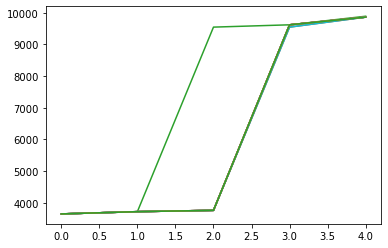

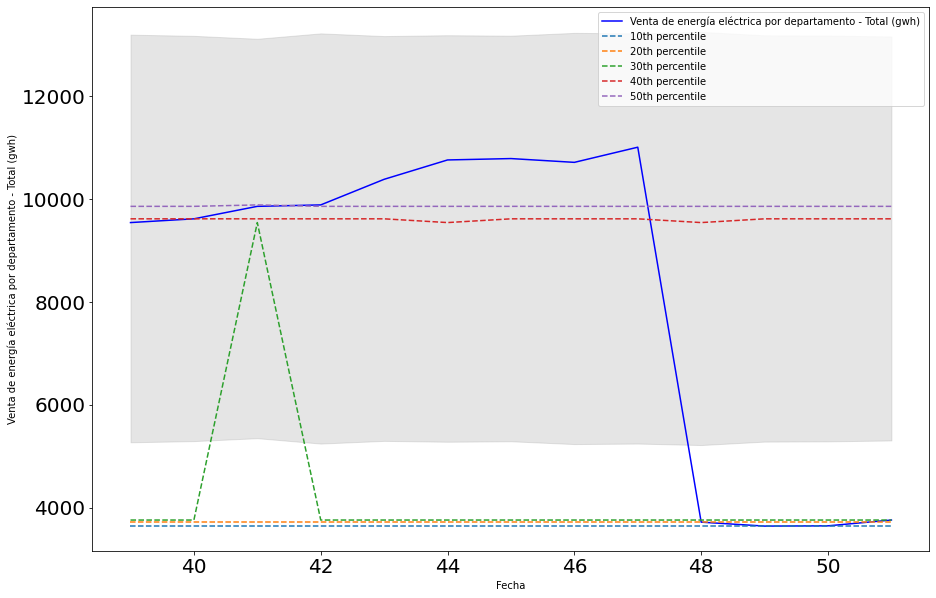

In [505]:
# fit ETS

model = SimpleExpSmoothing(train)

model_fit = model.fit()

forecast_values = model_fit.forecast(steps=13)

#print(forecast_values)

predictions = forecast_values


# extraigo los residuos
valid, predictions = valid.align(predictions, join='inner', axis=0)
residuals = valid.sub(predictions, axis=0)

# lista para bootrsrap forecast
bootstrap_forecasts = []

residuals_1d = residuals.values.reshape(-1)

# 1000 sendas
for i in range(1000):
    sample = np.random.choice(residuals_1d, size=len(residuals), replace=True)
    bootstrap_forecasts.append(predictions + sample)

# percentiles
percentiles = [10, 20, 30, 40, 50]
percentile_values = np.percentile(bootstrap_forecasts, percentiles, axis=0)

# plot  percentiles

plt.plot(percentile_values)
plt.show()

#print( valid )
#print(predictions)
#print(residuals)
percentile_df = pd.DataFrame(percentile_values.T, columns=percentiles, index=valid.index)

# Plot
ax = valid.plot(figsize=(15, 10), fontsize=20, color='b')

for p in percentiles:
    percentile_df[p].plot(ax=ax, label=f'{p}th percentile', linestyle='--')

lower_bound = predictions - 1.28 * (np.std(bootstrap_forecasts, axis=0))
upper_bound = predictions + 1.28 * (np.std(bootstrap_forecasts, axis=0))
ax.fill_between(percentile_df.index, lower_bound, upper_bound, color='gray', alpha=0.2)

ax.set_xlabel('Fecha')
ax.set_ylabel('Venta de energía eléctrica por departamento - Total (gwh)')
plt.legend()

## Producción de energía

In [506]:
data_produccion_energia_final =data_trimestral_p3.loc[:, 'Producción de electricidad por departamento - Total (gwh)']
display(data_produccion_energia_final)

0      6204.779219
1      6347.402207
2      6329.067660
3      6628.487729
4      6704.236912
5      6699.409360
6      6829.039864
7      7137.142592
8      7285.946164
9      7387.939004
10     7458.722222
11     7810.439752
12     8021.207739
13     8070.605873
14     8142.209647
15     8229.083024
16     8159.801810
17     8086.295906
18     8145.010113
19     8553.627992
20     8736.608087
21     8888.276903
22     8915.935038
23     9212.318960
24     9503.151278
25     9615.812182
26     9648.419554
27     9933.984311
28    10103.436426
29    10123.237384
30    10231.124317
31    10527.267488
32    10628.636605
33    10805.814599
34    10828.707757
35    11096.522833
36    11258.026871
37    11314.331545
38    11317.452264
39    11553.479908
40    11822.559515
41    11923.391361
42    11938.581456
43    12617.496073
44    13027.746381
45    12731.500162
46    12769.172414
47    13171.554974
48     4482.135708
49     4322.716882
50     4309.162845
51     4531.700987
Name: Produc

In [507]:
n = len(data_produccion_energia_final)
train_count = round(n * 0.75)
train =data_produccion_energia_final.iloc[:train_count]
valid = data_produccion_energia_final.iloc[train_count :n]
display(n-train_count)

13

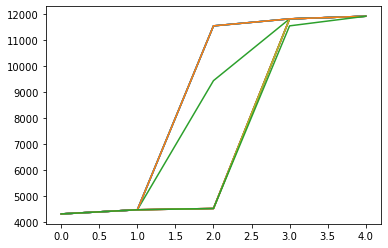

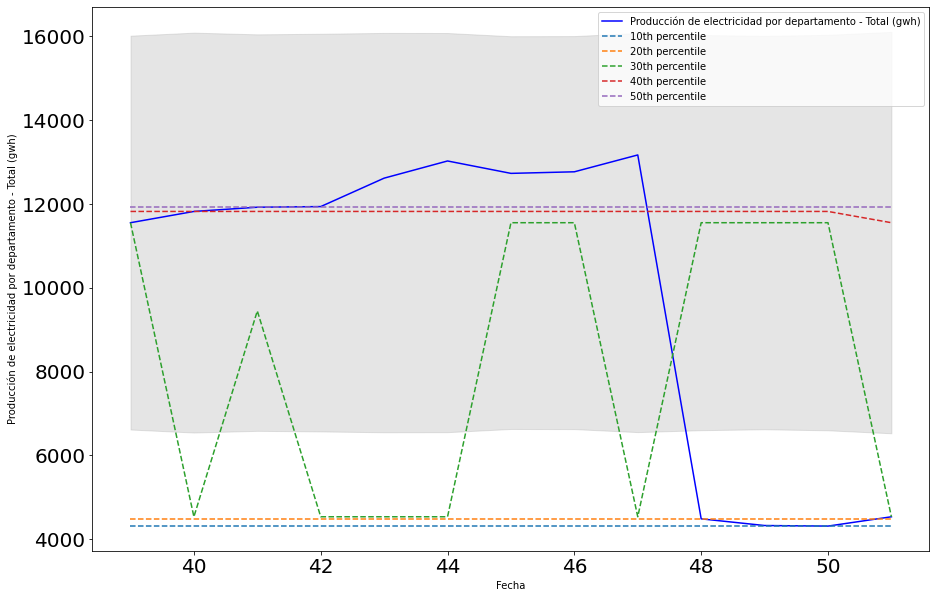

In [508]:
# fit ETS

model = SimpleExpSmoothing(train)

model_fit = model.fit()

forecast_values = model_fit.forecast(steps=13)

#print(forecast_values)

predictions = forecast_values


# extraigo los residuos
valid, predictions = valid.align(predictions, join='inner', axis=0)
residuals = valid.sub(predictions, axis=0)

# lista para bootrsrap forecast
bootstrap_forecasts = []

residuals_1d = residuals.values.reshape(-1)

# 1000 sendas
for i in range(1000):
    sample = np.random.choice(residuals_1d, size=len(residuals), replace=True)
    bootstrap_forecasts.append(predictions + sample)

# percentiles
percentiles = [10, 20, 30, 40, 50]
percentile_values = np.percentile(bootstrap_forecasts, percentiles, axis=0)

# plot  percentiles

plt.plot(percentile_values)
plt.show()

#print( valid )
#print(predictions)
#print(residuals)
percentile_df = pd.DataFrame(percentile_values.T, columns=percentiles, index=valid.index)

# Plot
ax = valid.plot(figsize=(15, 10), fontsize=20, color='b')

for p in percentiles:
    percentile_df[p].plot(ax=ax, label=f'{p}th percentile', linestyle='--')

lower_bound = predictions - 1.28 * (np.std(bootstrap_forecasts, axis=0))
upper_bound = predictions + 1.28 * (np.std(bootstrap_forecasts, axis=0))
ax.fill_between(percentile_df.index, lower_bound, upper_bound, color='gray', alpha=0.2)

ax.set_xlabel('Fecha')
ax.set_ylabel('Producción de electricidad por departamento - Total (gwh)')
plt.legend()

## Cobre

In [512]:
display(data_cobre)
data_cobre.to_csv('data_cobre.csv')
cobre_diario= pd.read_csv('data_cobre.csv')
cobre_diario_final = cobre_diario.loc[:, 'Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)']
display(cobre_diario_final)

,"Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)"
Fecha,
2000-01-02,83.483676
2000-01-03,78.607558
2000-01-05,78.698276
2000-01-06,78.698276
2000-01-08,83.778511
...,...
2022-12-05,409.072279
2022-12-07,334.320256
2022-12-08,365.822246


0        83.483676
1        78.607558
2        78.698276
3        78.698276
4        83.778511
           ...    
5927    409.072279
5928    334.320256
5929    365.822246
5930    364.053236
5931    345.886862
Name: Cotizaciones internacionales - Cobre (Londres, cUS$ por libras), Length: 5932, dtype: float64

In [513]:
n = len(cobre_diario_final)
train_count = round(n * 0.75)
train =cobre_diario_final.iloc[:train_count]
valid =cobre_diario_final.iloc[train_count :n]
display(n-train_count)

1483

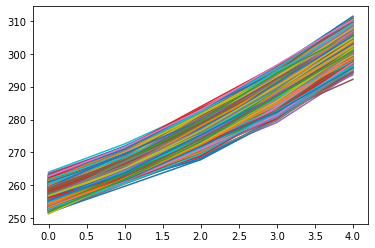

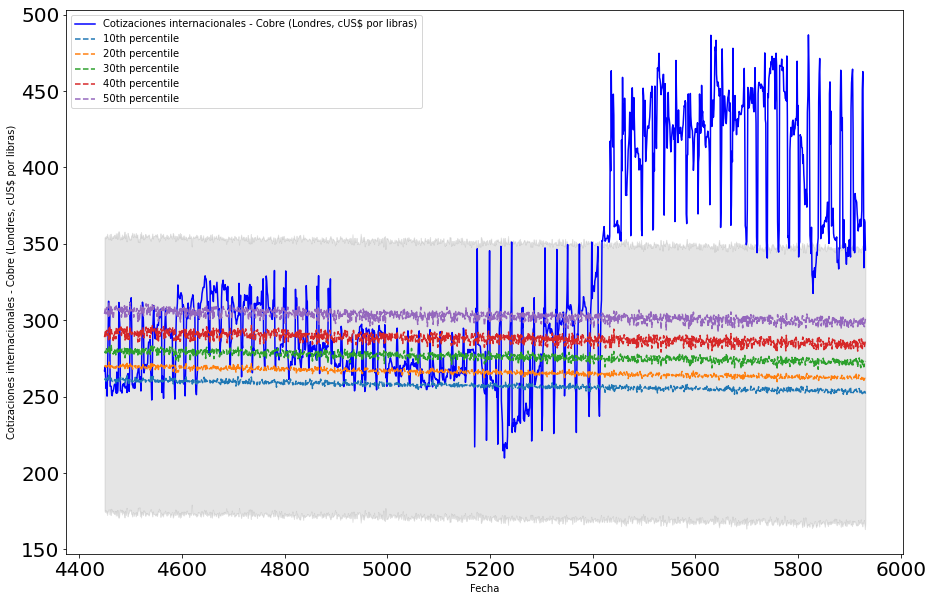

In [514]:
# fit ETS

model = ExponentialSmoothing(train, trend='add')
model_fit = model.fit()

forecast_values = model_fit.forecast(steps=1483)

#print(forecast_values)

predictions = forecast_values


# extraigo los residuos
valid, predictions = valid.align(predictions, join='inner', axis=0)
residuals = valid.sub(predictions, axis=0)

# lista para bootrsrap forecast
bootstrap_forecasts = []

residuals_1d = residuals.values.reshape(-1)

# 1000 sendas
for i in range(1000):
    sample = np.random.choice(residuals_1d, size=len(residuals), replace=True)
    bootstrap_forecasts.append(predictions + sample)

# percentiles
percentiles = [10, 20, 30, 40, 50]
percentile_values = np.percentile(bootstrap_forecasts, percentiles, axis=0)

# plot  percentiles

plt.plot(percentile_values)
plt.show()

#print( valid )
#print(predictions)
#print(residuals)
percentile_df = pd.DataFrame(percentile_values.T, columns=percentiles, index=valid.index)

# Plot
ax = valid.plot(figsize=(15, 10), fontsize=20, color='b')

for p in percentiles:
    percentile_df[p].plot(ax=ax, label=f'{p}th percentile', linestyle='--')

lower_bound = predictions - 1.28 * (np.std(bootstrap_forecasts, axis=0))
upper_bound = predictions + 1.28 * (np.std(bootstrap_forecasts, axis=0))
ax.fill_between(percentile_df.index, lower_bound, upper_bound, color='gray', alpha=0.2)

ax.set_xlabel('Fecha')
ax.set_ylabel('Cotizaciones internacionales - Cobre (Londres, cUS$ por libras)')
plt.legend()

## Petróleo

In [516]:
display(data_oil)
data_oil.to_csv('data_oil.csv')
oil_diario= pd.read_csv('data_oil.csv')
oil_diario_final = oil_diario.loc[:, 'Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)']
display(oil_diario_final)

,"Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)"
Fecha,
2000-01-02,28.22
2000-01-03,31.77
2000-01-05,25.89
2000-01-06,30.14
2000-01-08,27.79
...,...
2022-12-05,106.15
2022-12-07,97.69
2022-12-08,94.86


0        28.22
1        31.77
2        25.89
3        30.14
4        27.79
         ...  
5927    106.15
5928     97.69
5929     94.86
5930     88.18
5931     87.83
Name: Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles), Length: 5932, dtype: float64

In [517]:
n = len(oil_diario_final)
train_count = round(n * 0.75)
train =oil_diario_final.iloc[:train_count]
valid =oil_diario_final.iloc[train_count :n]
display(n-train_count)

1483

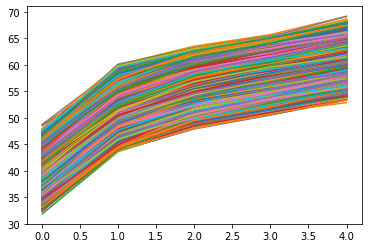

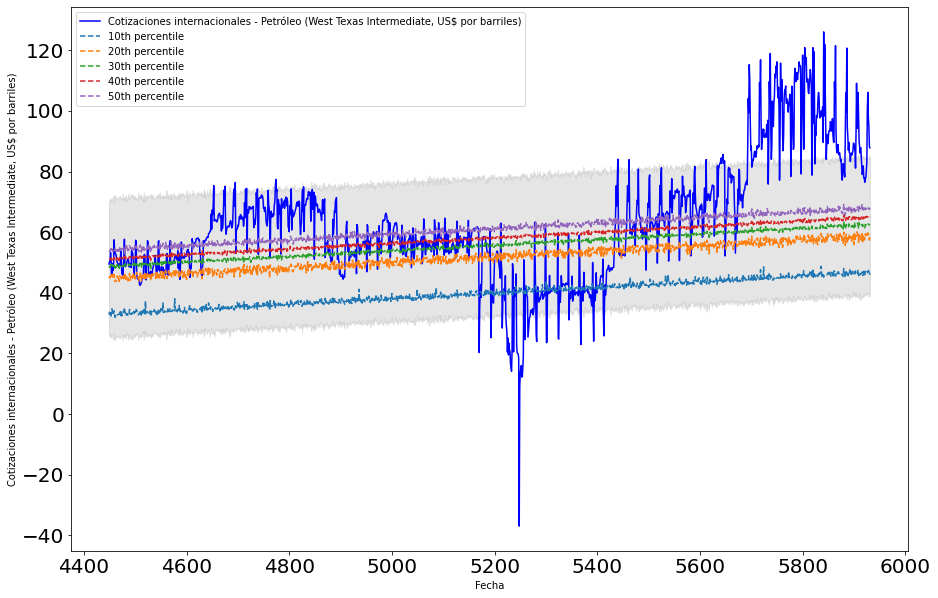

In [518]:
# fit ETS

model = ExponentialSmoothing(train, trend='add')
model_fit = model.fit()

forecast_values = model_fit.forecast(steps=1483)

#print(forecast_values)

predictions = forecast_values


# extraigo los residuos
valid, predictions = valid.align(predictions, join='inner', axis=0)
residuals = valid.sub(predictions, axis=0)

# lista para bootrsrap forecast
bootstrap_forecasts = []

residuals_1d = residuals.values.reshape(-1)

# 1000 sendas
for i in range(1000):
    sample = np.random.choice(residuals_1d, size=len(residuals), replace=True)
    bootstrap_forecasts.append(predictions + sample)

# percentiles
percentiles = [10, 20, 30, 40, 50]
percentile_values = np.percentile(bootstrap_forecasts, percentiles, axis=0)

# plot  percentiles

plt.plot(percentile_values)
plt.show()

#print( valid )
#print(predictions)
#print(residuals)
percentile_df = pd.DataFrame(percentile_values.T, columns=percentiles, index=valid.index)

# Plot
ax = valid.plot(figsize=(15, 10), fontsize=20, color='b')

for p in percentiles:
    percentile_df[p].plot(ax=ax, label=f'{p}th percentile', linestyle='--')

lower_bound = predictions - 1.28 * (np.std(bootstrap_forecasts, axis=0))
upper_bound = predictions + 1.28 * (np.std(bootstrap_forecasts, axis=0))
ax.fill_between(percentile_df.index, lower_bound, upper_bound, color='gray', alpha=0.2)

ax.set_xlabel('Fecha')
ax.set_ylabel('Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)')
plt.legend()

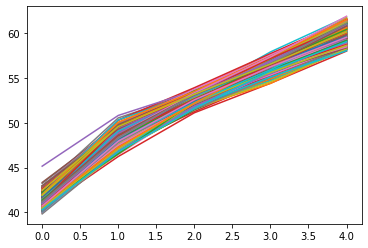

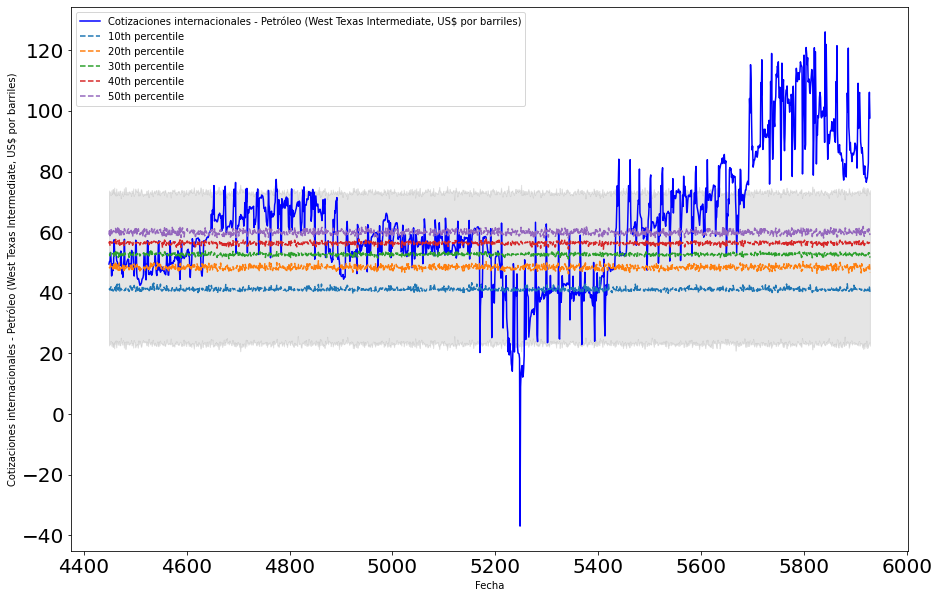

In [519]:
# fit ETS

model = SimpleExpSmoothing(train)

model_fit = model.fit()

forecast_values = model_fit.forecast(steps=1480)

#print(forecast_values)

predictions = forecast_values


# extraigo los residuos
valid, predictions = valid.align(predictions, join='inner', axis=0)
residuals = valid.sub(predictions, axis=0)

# lista para bootrsrap forecast
bootstrap_forecasts = []

residuals_1d = residuals.values.reshape(-1)

# 1000 sendas
for i in range(1000):
    sample = np.random.choice(residuals_1d, size=len(residuals), replace=True)
    bootstrap_forecasts.append(predictions + sample)

# percentiles
percentiles = [10, 20, 30, 40, 50]
percentile_values = np.percentile(bootstrap_forecasts, percentiles, axis=0)

# plot  percentiles

plt.plot(percentile_values)
plt.show()

#print( valid )
#print(predictions)
#print(residuals)
percentile_df = pd.DataFrame(percentile_values.T, columns=percentiles, index=valid.index)

# Plot
ax = valid.plot(figsize=(15, 10), fontsize=20, color='b')

for p in percentiles:
    percentile_df[p].plot(ax=ax, label=f'{p}th percentile', linestyle='--')

lower_bound = predictions - 1.28 * (np.std(bootstrap_forecasts, axis=0))
upper_bound = predictions + 1.28 * (np.std(bootstrap_forecasts, axis=0))
ax.fill_between(percentile_df.index, lower_bound, upper_bound, color='gray', alpha=0.2)

ax.set_xlabel('Fecha')
ax.set_ylabel('Cotizaciones internacionales - Petróleo (West Texas Intermediate, US$ por barriles)')
plt.legend()

## Conclusiones

En general, los modelos ARIMA muestran un mejor desempeño (de ahí el interés de haber cortado la data y no usar todo el set de información en el training y hacer el clásico bootstrap). En efecto, la gráfica (azul) se aproxima más a las simuladas con el bootastrap que en el caso de la estimación ETS.

Las estimación ETS provee una ponderación de valores pasados, de ahí, el porque las gráficas parecen cuasi-constantes o cuasi-lineales. 


Esto es consistente pues la optimización de los modelo ARIMA de cierta forma aproximan y abarcan a los ETS. Esto pues, si $x^{*} \in \{x: \Gamma(x)=\text{argmax}\{\Gamma(x)\}\}$, y $\text{argmax}\{\Gamma(x)\} = \max_{\Omega}\Gamma(x)$, en caso $\Theta \subset \Omega$, una solución $y^{*}$ obtenida dada la restricción $\Theta$ es tal que $\Gamma(y^{*}) \leq \Gamma(x^{*})$ (en caso se maximice) o $\Gamma(x^{*}) \leq \Gamma(y^{*})$ (en caso se minimice).

In [527]:
# Marcelo Gallardo 22-01-2023